# Complete analysis and treatment of Vertical MD4224 scan

In [1]:
import sys
import numpy as np
import pickle
sys.path.append('/eos/user/s/sterbini/MD_ANALYSIS/public/')
sys.path.append('/eos/project/l/liu/Toolbox/')
from myToolbox import *
from scipy.signal import savgol_filter
import gzip
import pandas as pd

Version 0.03. This is the latest version.
Please help me to improve it reporting bugs to guido.sterbini@cern.ch.
Your platform is Linux-3.10.0-957.10.1.el7.x86_64-x86_64-with-centos-7.6.1810-Core
Your folder is /eos/home-h/harafiqu/SWAN_projects/PS/Simulations/V_Scan
Your IP is 172.17.0.8
2019-05-13 09:34:51


In [2]:
myFiles=glob.glob('/eos/user/h/harafiqu/MD4224/2018.09.05_vertical/2018*.mat')
len(myFiles)

450

# Make Tune and Intensity Dataframes

In [3]:
def fromMatlabToDataFrame(listing, listOfVariableToAdd, verbose=False, matlabFullInfo=False):
    listOfVariableToAdd=list(set(listOfVariableToAdd))
    myDataFrame=pnd.DataFrame({})
    cycleStamp=[]
    cycleStampHuman=[]
    PLS_matlab=[]
    matlabObject=[]
    matlabFilePath=[]
    for j in listOfVariableToAdd:
        exec(j.replace('.','_')+'=[]')
    for i in listing:
        if verbose:
            print(i)
        data=myToolbox.japcMatlabImport(i);
        if matlabFullInfo:
            matlabObject.append(data)
        #to correct
        localCycleStamp=np.nanmax(data.headerCycleStamps);
        deltaLocal_UTC=datetime.datetime.fromtimestamp(localCycleStamp/1e9)-datetime.datetime.utcfromtimestamp(localCycleStamp/1e9)
        utcCycleStamp=localCycleStamp+deltaLocal_UTC.total_seconds()*1e9
        cycleStamp.append(utcCycleStamp)
        aux=myToolbox.unixtime2datetimeVectorize(np.nanmax(data.headerCycleStamps)/1e9)
        cycleStampHuman.append(aux.tolist())
        PLS_matlab.append(data.cycleName)
        matlabFilePath.append(os.path.abspath(i))
        for j in listOfVariableToAdd:
            if hasattr(data,j.split('.')[0]):
                exec(j.replace('.','_') + '.append(data.' + j + ')')
            else:
                exec(j.replace('.','_') + '.append(np.nan)')
    myDataFrame['cycleStamp']=pnd.Series(cycleStamp,cycleStampHuman)
    myDataFrame['matlabPLS']=pnd.Series(PLS_matlab,cycleStampHuman)
    myDataFrame['matlabFilePath']=pnd.Series(matlabFilePath,cycleStampHuman)
    if matlabFullInfo:
        myDataFrame['matlabFullInfo']=pnd.Series(matlabObject,cycleStampHuman)
    for j in listOfVariableToAdd:
        exec('myDataFrame[\'' + j + '\']=pnd.Series(' +j.replace('.','_')+ ',cycleStampHuman)')    #myDataFrame=pnd.DataFrame({j:aux,
    return myDataFrame

In [4]:
# Convert mat files to dataframe
df_test = fromMatlabToDataFrame(myFiles,['PR_BQS72.SamplerAcquisition.value.estimatedTuneV','PR_BQS72.SamplerAcquisition.value.estimatedTuneH','PR_BQS72.SamplerAcquisition.cycleStamp','PR_BCT_ST.Samples.value.samples','PR_BCT_ST.Samples.cycleStamp'])

In [5]:
# cleanup dataframe
df_test['PR_BCT_ST.Samples.cycleStamp']=df_test['PR_BCT_ST.Samples.cycleStamp']/1e9
df_test['PR_BQS72.SamplerAcquisition.cycleStamp']=df_test['PR_BQS72.SamplerAcquisition.cycleStamp']/1e9

In [6]:
df_test

,cycleStamp,matlabPLS,matlabFilePath,PR_BQS72.SamplerAcquisition.value.estimatedTuneV,PR_BQS72.SamplerAcquisition.cycleStamp,PR_BCT_ST.Samples.cycleStamp,PR_BCT_ST.Samples.value.samples,PR_BQS72.SamplerAcquisition.value.estimatedTuneH
2018-09-05 10:20:30.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.2391116740353679, 0.23971673231960905, 0.23...",1.536136e+09,1.536136e+09,"[-0.16468000000000002, -0.15378, -0.1374300000...","[0.20977273575518698, 0.20940702780573384, 0.2..."
2018-09-05 10:21:06.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.23976878434647172, 0.24005858967109586, 0.2...",1.536136e+09,1.536136e+09,"[-0.16468000000000002, -0.15378, -0.1374300000...","[0.20904288280545877, 0.2091414764329, 0.20907..."
2018-09-05 10:20:30.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.23979297109117814, 0.23927600776361443, 0.2...",1.536136e+09,1.536136e+09,"[-0.21493, -0.20040000000000002, -0.18587, -0....","[0.20910096986069623, 0.20919447601635738, 0.2..."
2018-09-05 10:21:06.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.22984427276260058, 0.23000876451501565, 0.2...",1.536136e+09,1.536136e+09,"[-0.19495, -0.18526, -0.17436000000000001, -0....","[0.20900025780414888, 0.20880781328871953, 0.2..."
2018-09-05 10:21:42.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.21960233799140136, 0.21974349999447174, 0.2...",1.536136e+09,1.536136e+09,"[-0.14228000000000002, -0.13138000000000002, -...","[0.20920446730191952, 0.20915974993014785, 0.2..."
2018-09-05 10:22:18.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.2102815567691356, 0.20942227306900782, 0.20...",1.536136e+09,1.536136e+09,"[-0.13864, -0.12593000000000001, -0.1150300000...","[0.20715974144784158, 0.20999031660603723, 0.2..."
2018-09-05 10:22:54.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.19871366825637893, 0.1989663926550141, 0.20...",1.536136e+09,1.536136e+09,"[-0.19676000000000002, -0.18345, -0.17013, -0....","[0.2100921495539858, 0.20985952297053748, 0.20..."
2018-09-05 10:23:30.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.1899620637501338, 0.1906069731650187, 0.189...",1.536136e+09,1.536136e+09,"[-0.21372000000000002, -0.20040000000000002, -...","[0.20933471986513602, 0.20873250795510992, 0.2..."
2018-09-05 10:24:06.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.18002022523528952, 0.1798854030479251, 0.18...",1.536136e+09,1.536136e+09,"[-0.16226000000000002, -0.15499000000000002, -...","[0.20916809409599718, 0.2091351622165313, 0.20..."
2018-09-05 10:24:42.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.171126744770092, 0.17001407402332383, 0.171...",1.536136e+09,1.536136e+09,"[-0.12714, -0.11564, -0.10716, -0.089000000000...","[0.20855192735048142, 0.20957426025888468, 0.2..."


In [7]:
# Check cyclestamp differences

# Iterate over each row in the dataframe
differences = []
for index, row in df_test.iterrows():
    difference = (row['PR_BCT_ST.Samples.cycleStamp'] - row['PR_BQS72.SamplerAcquisition.cycleStamp'])/row['PR_BCT_ST.Samples.cycleStamp']
    differences.append(difference)
    
print 'Difference between BCT and BQS73 cycle times (percentage) \n Mean:', np.mean(differences),' Min:',np.min(differences),' Max:', np.max(differences)

# Iterate over each row in the dataframe
differences = []
for index, row in df_test.iterrows():
    difference = (row['cycleStamp'] - (row['PR_BCT_ST.Samples.cycleStamp']*1E9))/row['cycleStamp']
    differences.append(difference)
    
print '\nDifference between BCT and cyclestamp cycle times (percentage) \n Mean:', np.mean(differences),' Min:',np.min(differences),' Max:', np.max(differences)

Difference between BCT and BQS73 cycle times (percentage) 
 Mean: 2.23347503095737e-11  Min: 0.0  Max: 1.0050637639308164e-08

Difference between BCT and cyclestamp cycle times (percentage) 
 Mean: 4.68740573399049e-06  Min: 4.687012369152908e-06  Max: 4.735469788809376e-06


In [8]:
df_bct = fromMatlabToDataFrame(myFiles,['PR_BCT_ST.Samples.value.samples','PR_BCT_ST.Samples.cycleStamp', 'PR_SCBFC.Samples.value.samples'])
df_bqs72 = fromMatlabToDataFrame(myFiles,['PR_BQS72.SamplerAcquisition.value.estimatedTuneV','PR_BQS72.SamplerAcquisition.value.estimatedTuneH','PR_BQS72.SamplerAcquisition.cycleStamp'])

In [9]:
df_first = pnd.merge(df_bct, df_bqs72, left_on = 'PR_BCT_ST.Samples.cycleStamp',  right_on = 'PR_BQS72.SamplerAcquisition.cycleStamp')

In [10]:
# Have to convert this for unknown reason (myToolbox.unixtime2datetimeVectorize expects this converted cycleStamp)
df_first['PR_BCT_ST.Samples.cycleStamp']=df_first['PR_BCT_ST.Samples.cycleStamp']/1e9
# copy to new column
df_first['cf_cycleStamp']=df_first['PR_BCT_ST.Samples.cycleStamp']
# rename BCT cyclestamp to cycleStamp
df_first = df_first.rename(index=str, columns={"PR_BCT_ST.Samples.cycleStamp" : "cycleStamp", })
# convert to datetime
#df_first['PR_BCT_ST.Samples.cycleStamp']=df_first['cycleStamp'].apply(myToolbox.unixtime2datetimeVectorize)
df_first['cf_timeStamp'] = df_first['cycleStamp'].apply(myToolbox.unixtime2datetimeVectorize)
#df_first['cf_timeStamp']=df_first['timeStamp']
# Set index
df_first = df_first.set_index(['cycleStamp'])
df_first = df_first.drop(labels='matlabFilePath_x',axis='columns')
df_first = df_first.drop(labels='matlabFilePath_y',axis='columns')
df_first = df_first.drop(labels='cycleStamp_x',axis='columns')
df_first = df_first.drop(labels='cycleStamp_y',axis='columns')
df_first = df_first.drop(labels='matlabPLS_y',axis='columns')
df_first = df_first.drop(labels='matlabPLS_x',axis='columns')
df_first = df_first.drop(labels='PR_BQS72.SamplerAcquisition.cycleStamp',axis='columns')
#df_first = df_first.drop(labels='PR_BCT_ST.Samples.cycleStamp',axis='columns')

In [11]:
df_first['Qx']=df_first.apply(lambda x: np.nanmean(x['PR_BQS72.SamplerAcquisition.value.estimatedTuneH'][20:280]),axis=1)
df_first['Qy']=df_first.apply(lambda x: np.nanmean(x['PR_BQS72.SamplerAcquisition.value.estimatedTuneV'][20:280]),axis=1)

In [12]:
# Remove anomalous cases etc
#df_first = df_first.drop(df_first[df_first['Qx'] < .295].index )
df_first = df_first.dropna(axis=0,how='all',subset =['Qy'])
df_first = df_first.dropna(axis=0,how='all',subset =['Qx'])
df_first = df_first.drop(labels='PR_BQS72.SamplerAcquisition.value.estimatedTuneV',axis='columns')
df_first = df_first.drop(labels='PR_BQS72.SamplerAcquisition.value.estimatedTuneH',axis='columns')
#df_mergetest

In [13]:
df_first

,PR_BCT_ST.Samples.value.samples,PR_SCBFC.Samples.value.samples,cf_cycleStamp,cf_timeStamp,Qx,Qy
cycleStamp,,,,,,
1.536136e+09,"[-0.16468000000000002, -0.15378, -0.1374300000...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,2018-09-05 10:19:54.700,0.208865,0.239484
1.536136e+09,"[-0.16468000000000002, -0.15378, -0.1374300000...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,2018-09-05 10:19:54.700,0.208865,0.239484
1.536136e+09,"[-0.21493, -0.20040000000000002, -0.18587, -0....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,2018-09-05 10:20:30.700,0.208899,0.239078
1.536136e+09,"[-0.19495, -0.18526, -0.17436000000000001, -0....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,2018-09-05 10:21:06.700,0.208694,0.229331
1.536136e+09,"[-0.14228000000000002, -0.13138000000000002, -...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,2018-09-05 10:21:42.700,0.208412,0.219715
1.536136e+09,"[-0.13864, -0.12593000000000001, -0.1150300000...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,2018-09-05 10:22:18.700,0.208581,0.209510
1.536136e+09,"[-0.19676000000000002, -0.18345, -0.17013, -0....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,2018-09-05 10:22:54.700,0.208356,0.199719
1.536136e+09,"[-0.21372000000000002, -0.20040000000000002, -...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,2018-09-05 10:23:30.700,0.208183,0.189839
1.536136e+09,"[-0.16226000000000002, -0.15499000000000002, -...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,2018-09-05 10:24:06.700,0.208225,0.179881


In [14]:
# Check chirp time
test = myToolbox.japcMatlabImport(myFiles[0])
test.PR_BQS72.SamplerAcquisition.value.acqOffset

20

# Intensity, Losses, Ratio

In [15]:
def intensity_df(ndf,start=85,end=1185):
    df=ndf.copy()
    def losses(a):
        try:
            b=(a[start]-a[end])/a[start]*100 
        except:
            b=np.nan
        return b
    def ratio(a):
        try:
            c=a[end]/a[start]
        except:
            c=np.nan
        return c
    def max_intensity(a):
        try:
            d=np.max(a)
        except:
            d=np.nan
        return d*1E10
    df['intensity']=df['PR_BCT_ST.Samples.value.samples'].apply(max_intensity)
    df['losses']=df['PR_BCT_ST.Samples.value.samples'].apply(losses)
    df['ratio']=df['PR_BCT_ST.Samples.value.samples'].apply(ratio)
    return df

In [16]:
df_second=intensity_df(df_first,start=70,end=1185)

In [17]:
df_second = df_second.drop(labels='PR_BCT_ST.Samples.value.samples',axis='columns');
df_second = df_second.set_index(['cf_timeStamp']);
df_second

,PR_SCBFC.Samples.value.samples,cf_cycleStamp,Qx,Qy,intensity,losses,ratio
cf_timeStamp,,,,,,,
2018-09-05 10:19:54.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,0.208865,0.239484,7.023244e+11,2.106413,0.978936
2018-09-05 10:19:54.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,0.208865,0.239484,7.023244e+11,2.106413,0.978936
2018-09-05 10:20:30.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,0.208899,0.239078,7.548161e+11,1.698342,0.983017
2018-09-05 10:21:06.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,0.208694,0.229331,7.327544e+11,2.203742,0.977963
2018-09-05 10:21:42.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,0.208412,0.219715,6.951734e+11,2.985061,0.970149
2018-09-05 10:22:18.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,0.208581,0.209510,7.361018e+11,3.982576,0.960174
2018-09-05 10:22:54.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,0.208356,0.199719,7.079539e+11,2.690493,0.973095
2018-09-05 10:23:30.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,0.208183,0.189839,7.265163e+11,1.429472,0.985705
2018-09-05 10:24:06.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,0.208225,0.179881,7.214954e+11,0.909661,0.990903


In [18]:
df_second = df_second.drop(df_second.index[0])
df_second[df_second.index.duplicated()]

,PR_SCBFC.Samples.value.samples,cf_cycleStamp,Qx,Qy,intensity,losses,ratio
cf_timeStamp,,,,,,,


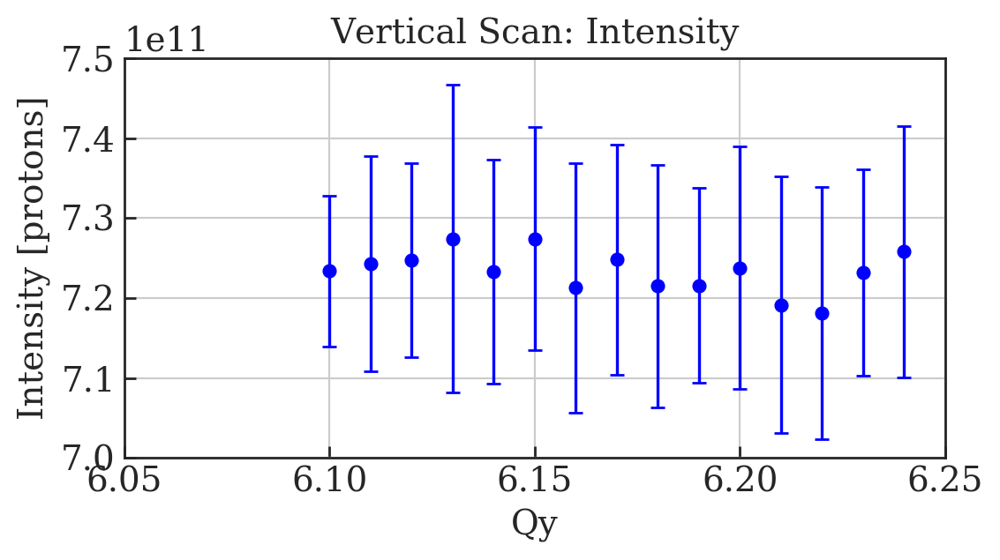

In [19]:
# Plot averaged data points with error bars
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df_second['intensity'][(df_second['Qy']>lower_lim)][(df_second['Qy']<upper_lim)] ) )
    
    y_error_172.append( np.std( df_second['intensity'][(df_second['Qy']>lower_lim)][(df_second['Qy']<upper_lim)] ) )
    
    
fig=plt.figure(figsize=(6, 3), dpi= 200, facecolor='w', edgecolor='k');

plt.errorbar(x_data, y_data_172, y_error_172, linestyle='None', marker='o', capsize=3, color='b')

x_d = np.linspace(6.0, 7.0, 2)
y_d = (7.25E11, 7.25E11)
#plt.plot(x_d, y_d, 'r-', label='7.25E11')

plt.xlabel('Qy');
plt.ylabel('Intensity [protons]');
plt.title('Vertical Scan: Intensity')
plt.ylim(70E10,75E10)
plt.xlim(6.05, 6.25)
#plt.legend()
plt.grid();
fig.savefig('MD4224_Complete_Vertical_Intensities_Errors.png');

# Timber: Vertical

In [20]:
def read_data(year=2018,month=9,date=5,hour=10,minutes=0,span=5,user='CPS%MD1',WS='64.V'):
    t1=datetime.datetime(year,month,date,hour,minutes)
    t2=t1+datetime.timedelta(hours=span)
    CALS=['PR.BWS.{}_ROT:PROF_DATA_IN'.format(WS),  'PR.BWS.{}_ROT:PROF_POSITION_IN'.format(WS),  'PR.BWS.{}_ROT:ACQ_DELAY'.format(WS), 'PR.BCT.LT:SAMPLES']
    df=myToolbox.fromTimberToDataFrame(CALS,t1,t2,fundamental=user)
    return  df

In [21]:
dfV=read_data(year=2018,date=5,month=9,hour=10,minutes=0,span=5,user='CPS%MD1',WS='64.V');

In [22]:
len(dfV)

432

In [23]:
dfV

,PR.BWS.64.V_ROT:ACQ_DELAY,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BCT.LT:SAMPLES,PR.BWS.64.V_ROT:PROF_DATA_IN,cycleStamp
2018-09-05 10:12:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.14046, -0.13017, -0.11988, -0.1005, -0.082...","[0.173502430703752, 0.17229545882224, 0.172095...",1.536142e+18
2018-09-05 10:12:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.20706, -0.18889, -0.17557, -0.15317, -0.12...","[0.173099170197014, 0.17229545882224, 0.173704...",1.536142e+18
2018-09-05 10:13:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.21311, -0.20282, -0.18889, -0.1671, -0.150...","[0.174514696879112, 0.174109083627406, 0.17410...",1.536142e+18
2018-09-05 10:13:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.13985, -0.12956, -0.13198, -0.11685, -0.10...","[0.173300683154985, 0.173704413116415, 0.17390...",1.536142e+18
2018-09-05 10:14:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.14591, -0.12472, -0.11624, -0.10111, -0.08...","[0.17512488920122, 0.174514696879112, 0.174311...",1.536142e+18
2018-09-05 10:15:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.20464, -0.18526, -0.16831, -0.14349, -0.12...","[0.17512488920122, 0.174514696879112, 0.174717...",1.536143e+18
2018-09-05 10:15:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.22098, -0.21008, -0.20161, -0.18223, -0.15...","[0.173300683154985, 0.173099170197014, 0.17350...",1.536143e+18
2018-09-05 10:16:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.1562, -0.15136, -0.14409, -0.13441, -0.120...","[0.173300683154985, 0.172496036141661, 0.17309...",1.536143e+18
2018-09-05 10:16:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.11806, -0.1114, -0.10413, -0.09142, -0.076...","[0.173704413116415, 0.174109083627406, 0.17330...",1.536143e+18
2018-09-05 10:17:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.18284, -0.16347, -0.15075, -0.1338, -0.113...","[0.172696846962657, 0.17289789155706, 0.173906...",1.536143e+18


# Manual Fit

In [24]:
def gaussian_3_parameters(x, A, mu, sig):
    """gaussian_3_parameter(x, m, A, mu, sig)"""
    return A/np.sqrt(2*np.pi)/sig*np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))

def gaussian_4_parameters(x, m, A, mu, sig):
    """gaussian_4_parameter(x, m, A, mu, sig)"""
    return m*x+A/np.sqrt(2*np.pi)/sig*np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))

def gaussian_5_parameters(x, c, m, A, mu, sig):
    """gaussian_5_parameter(x, c, m, A, mu, sig)"""
    return c+m*x+A/np.sqrt(2*np.pi)/sig*np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))

def second_moment(values, weights):
    weighted_average = np.average(values, weights=weights)
    second_moment = np.sqrt(np.average((values-weighted_average)**2, weights=weights))
    return (second_moment)

def second_moment_2(values, weights, sig, n_sigmas=6.):
    a=np.where((values<n_sigmas*sig) & (values>-n_sigmas*sig))[0]
    values=values[a]
    weights=weights[a]    
    weighted_average = np.average(values, weights=weights)
    second_moment = np.sqrt(np.average((values-weighted_average)**2, weights=weights))
    return (second_moment)

def filtered(a):
    try:
        b=(scipy.signal.savgol_filter(a,15,1))
    except:
        b=a
    return b

def Multi_filter(ndf, with_plot = False, WS = '65.H', sig_limit_mm=10, smooth = False):
    
    df = ndf.copy()
    
    position_label = 'PR.BWS.'+WS+'_ROT:PROF_POSITION_IN'
    profile_label = 'PR.BWS.'+WS+'_ROT:PROF_DATA_IN'
    
    window = 40    
    
    # Arrays to hold dataframe data. Appended to dataframe at the end of the loop.
    mu_5 = []
    sigma_5 = []
    A_5 = []
    m_5 = []
    c_5 = []
    sig_err_5 = []
    
    mu_3 = []
    sigma_3 = []
    A_3 = []
    sig_err_3 = []
    
    mom_2nd = []
    
    filtered_profiles = []
    filtered_positions = []
    
    failed_rows = []
    
    new_new_X=[]
    
    # Iterate over dataframe
    for j in range(0, len(df), 1):
        print '\nMulti_filter row ', j
        
# 5 parameter Gaussian fit to find mean and sigma
#------------------------------------------------
    
        data = []
        # Filter the data (scipy.signal.savgol_filter)
        if smooth: data = filtered(df[profile_label].iloc()[j])    
        else:data = df[profile_label].iloc()[j]
            
        X = df[position_label].iloc()[j]/1000.
        Y = data
        indx_max = np.argmax(Y)
        mu0 = X[indx_max]
        x_tmp = X
        y_tmp = Y
        offs0 = min(y_tmp)
        ampl = max(y_tmp)-offs0
        x1 = x_tmp[np.searchsorted(y_tmp[:window], offs0+ampl/2)]
        x2 = x_tmp[np.searchsorted(-y_tmp[window:], -offs0+ampl/2)]
        FWHM = x2-x1
        #sigma0 = np.abs(2*FWHM/2.355)
        sigma0 = 5
        ampl *= np.sqrt(2*np.pi)*sigma0
        slope = 0
        
        popt5 = []
        pcov5 = []    

        popt5, pcov5 = curve_fit(gaussian_5_parameters, X, data, p0 =[offs0, slope, ampl, mu0, sigma0])
        result5 = gaussian_5_parameters(X, popt5[0], popt5[1], popt5[2], popt5[3], popt5[4])

        fit_c_5 = popt5[0]
        fit_m_5 = popt5[1]
        fit_A_5 = popt5[2]
        fit_mean_5 = popt5[3]
        fit_sigma_5 = abs(popt5[4])
        
        c_5.append(np.array(popt5[0]))
        m_5.append(np.array(popt5[1]))
        A_5.append(np.array(popt5[2]))
        mu_5.append(np.array(popt5[3]))
        sigma_5.append(abs(np.array(abs(popt5[4]))))
        sig_err_5.append(np.sqrt(np.diag(pcov5[4])[4][4]))
        
        print '5 parameter fit sigma = ', fit_sigma_5 , ' +/- ', np.sqrt(np.diag(pcov5[4]))[4][4]
    
        if fit_sigma_5 > sig_limit_mm:
            
            print '\n\tinitial guess: mu0', mu0
            print '\tinitial guess: offs0', offs0
            print '\tinitial guess: ampl', ampl
            print '\tinitial guess: slope', slope
            print '\tinitial guess: sigma0', sigma0
            
            result0 = gaussian_5_parameters(X, offs0, slope, ampl, mu0, sigma0)
            
            fig, ax1 = plt.subplots(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');

            plt.plot(X, df[profile_label].iloc()[j], label='raw');
            plt.plot(X, result5, label='5 param fit');
            plt.plot(X, result0, label='initial param fit');

            tit = 'WS profile & fit ' + str(j);
            savename = 'MD4224_HB_Vertical_Multifit_' + str(j);

            plt.title(tit);
            plt.ylabel('Profile [-]');
            plt.xlabel('Position [mm]');
            plt.legend();            
            plt.grid();
            fig.savefig(savename);    
            plt.close();
            
            # Set empty array values for completeness - cannot set dataframe with missing values
            filtered_profiles.append(np.nan)
            filtered_positions.append(np.nan)
            
            failed_rows.append(j)

            mom_2nd.append(np.nan)

            c_5.append(np.nan)
            m_5.append(np.nan)
            A_5.append(np.nan)
            mu_5.append(np.nan)
            sigma_5.append(np.nan)
            sig_err_5.append(np.nan)

            A_3.append(np.nan)
            mu_3.append(np.nan)
            sigma_3.append(np.nan)
            sig_err_3.append(np.nan)        
  
            
        # Simple filter for negative sigma (fit didn't work)
        elif fit_sigma_5 < sig_limit_mm:
            
# Consider only data between +/-(6 sigma + mean)
#------------------------------------------------
            new_X = []
            new_Y = []        

            # Iterate over data
            for i in xrange(len(Y)): # Append data if inside cut window
                if (X[i] < (6*fit_sigma_5 + fit_mean_5)) and (X[i] > (-6*fit_sigma_5 + fit_mean_5)):

# Remove Slope and Offset
#------------------------------------------------               
                    new_X.append(X[i])
                    new_Y.append(Y[i] - (fit_m_5*X[i] + fit_c_5))

# 3 parameter Gaussian fit to centre
#------------------------------------------------

            popt3 = []
            pcov3 = []   
            popt3, pcov3 = curve_fit(gaussian_3_parameters, new_X, new_Y, p0 =[fit_A_5, fit_mean_5, fit_sigma_5])
            result3 = gaussian_3_parameters(new_X, popt3[0], popt3[1], popt3[2])

            fit_A_3 = popt3[0]
            fit_mean_3 = popt3[1]
            fit_sigma_3 = popt3[2]

            A_3.append(np.array(popt3[0]))
            mu_3.append(np.array(popt3[1]))
            sigma_3.append(np.array(abs(popt3[2])))
            sig_err_3.append(np.sqrt(np.diag(pcov3[2]))[2][2])     

            print '3 parameter fit sigma = ', popt3[2] , ' +/- ', np.sqrt(np.diag(pcov3[2]))[2][2]

# Threshold ?
#------------------------------------------------

# 2nd moment
#------------------------------------------------
            # Shift centre
            new_new_X = new_X - fit_mean_3

            second_mom = second_moment(new_new_X, new_Y)

            mom_2nd.append(second_mom)

            print 'Second moment = ', second_mom        

            # Append to dataframe later
            filtered_positions.append(new_new_X)
            filtered_profiles.append(new_Y)       

# Plot
#------------------------------------------------      
            if with_plot:
                fig, ax1 = plt.subplots(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');

                plt.plot(X, df[profile_label].iloc()[j], label='raw');
                plt.plot(X, result5, label='5 param fit');
                plt.plot(new_new_X, result3, label='3 param fit' );
                plt.plot(new_new_X, new_Y, label='filtered');

                tit = 'WS profile & fit ' + str(j);
                savename = 'MD4224_HB_Vertical_Multifit_' + str(j);

                plt.title(tit);
                plt.ylabel('Profile [-]');
                plt.xlabel('Position [mm]');
                plt.legend();            
                plt.grid();
                fig.savefig(savename);
                plt.close();

    # Set values in dataframe   
    
#     df['5sig '+WS[-1]] = sigma_5
#     df['5sig err'+WS[-1]] = sig_err_5
#     df['5A '+WS[-1]] = A_5
#     df['5mu '+WS[-1]] = mu_5
#     df['5m '+WS[-1]] = m_5
#     df['5c '+WS[-1]] = c_5
    
#     df['3sig '+WS[-1]] = sigma_3
#     df['3sig err'+WS[-1]] = sig_err_3
#     df['3A '+WS[-1]] = A_3
#     df['3mu '+WS[-1]] = mu_3
    
    df['2ndMoment '+WS[-1]] = mom_2nd   
    
    df['sig '+WS[-1]] = sigma_3
    df['sig err'+WS[-1]] = sig_err_3
    df['A '+WS[-1]] = A_3
    df['mu '+WS[-1]] = mu_3
    
    df['position '+WS[-1]] = filtered_positions
    df['profile '+WS[-1]] = filtered_profiles
    
    print 'failed rows = ', failed_rows
    
    return df

In [25]:
df_V_filtered = Multi_filter(dfV, with_plot = True, WS = '64.V' )


Multi_filter row  0
5 parameter fit sigma =  2.788639104835815  +/-  0.003926192248341214
3 parameter fit sigma =  2.7886402929181093  +/-  0.02020046673627379
Second moment =  3.132208047565709


/usr/local/bin/start_ipykernel.py:111: RuntimeWarning: invalid value encountered in sqrt
/usr/local/bin/start_ipykernel.py:193: RuntimeWarning: invalid value encountered in sqrt
/usr/local/bin/start_ipykernel.py:195: RuntimeWarning: invalid value encountered in sqrt



Multi_filter row  1
5 parameter fit sigma =  2.858593627149108  +/-  0.002885842102213625
3 parameter fit sigma =  2.8585942702020866  +/-  0.014355616628631657
Second moment =  3.010831988291384

Multi_filter row  2
5 parameter fit sigma =  2.9297937624023582  +/-  0.0027836260209190165
3 parameter fit sigma =  2.9297941431604184  +/-  0.01368008551850069
Second moment =  2.95593746144889

Multi_filter row  3
5 parameter fit sigma =  3.03067158571614  +/-  0.00397149996655544
3 parameter fit sigma =  3.030670821156049  +/-  0.019400945200456904
Second moment =  3.0818150684456613

Multi_filter row  4
5 parameter fit sigma =  2.903034667149036  +/-  0.003289527175167738
3 parameter fit sigma =  2.903034628859224  +/-  0.01599599322154827
Second moment =  3.04020618330891

Multi_filter row  5
5 parameter fit sigma =  2.9386150270343565  +/-  0.0027079650262858243
3 parameter fit sigma =  2.9386151716389737  +/-  0.012731998318958746
Second moment =  3.1521356533431057

Multi_filter row


Multi_filter row  43
5 parameter fit sigma =  3.2077592037613436  +/-  0.003038611683899817
3 parameter fit sigma =  3.20775939076019  +/-  0.013391813207045147
Second moment =  3.148729308076565

Multi_filter row  44
5 parameter fit sigma =  3.212679209880033  +/-  0.0033991757549855506
3 parameter fit sigma =  3.2126797158444123  +/-  0.015339395637993625
Second moment =  3.2874503169522438

Multi_filter row  45
5 parameter fit sigma =  3.248660711130314  +/-  0.0029255590444793194
3 parameter fit sigma =  3.2486607768424545  +/-  0.012595510400107618
Second moment =  3.185877221209128

Multi_filter row  46
5 parameter fit sigma =  3.2729013041343573  +/-  0.003464355989366678
3 parameter fit sigma =  3.2729022183233094  +/-  0.015173678859251387
Second moment =  3.1271615631451355

Multi_filter row  47
5 parameter fit sigma =  3.86700173492837  +/-  0.005363851386047704
3 parameter fit sigma =  3.867000048252819  +/-  0.022424172521737964
Second moment =  3.718372765281439

Multi_f


Multi_filter row  85
5 parameter fit sigma =  3.115369577535007  +/-  0.0033006471241627563
3 parameter fit sigma =  3.11536959685749  +/-  0.015118915470420179
Second moment =  3.1856558399115076

Multi_filter row  86
5 parameter fit sigma =  3.0978008580707397  +/-  0.0035802032591501806
3 parameter fit sigma =  3.09780270921239  +/-  0.016567853231972268
Second moment =  3.3236569031533656

Multi_filter row  87
5 parameter fit sigma =  3.117402951439272  +/-  0.003003655739935901
3 parameter fit sigma =  3.1174029822157996  +/-  0.013476623007244354
Second moment =  3.1710015722452556

Multi_filter row  88
5 parameter fit sigma =  3.2638256000724186  +/-  0.0029465615593740257
3 parameter fit sigma =  3.263825658267733  +/-  0.012858573797899779
Second moment =  3.3488036708816837

Multi_filter row  89
5 parameter fit sigma =  3.341852771718139  +/-  0.0032414170492218353
3 parameter fit sigma =  3.341851504801611  +/-  0.014119228641374817
Second moment =  3.411721845542196

Multi


Multi_filter row  127
5 parameter fit sigma =  2.9706989956030636  +/-  0.002823834664880414
3 parameter fit sigma =  2.970699133465817  +/-  0.013071123973220878
Second moment =  3.046979449657365

Multi_filter row  128
5 parameter fit sigma =  3.0053616430151053  +/-  0.0028727949058561545
3 parameter fit sigma =  3.0053617563229675  +/-  0.01328509924682709
Second moment =  3.2452464536876677

Multi_filter row  129
5 parameter fit sigma =  3.0065481153540556  +/-  0.0027852194659353483
3 parameter fit sigma =  3.0065492751066367  +/-  0.012527461907247206
Second moment =  3.1962270233754513

Multi_filter row  130
5 parameter fit sigma =  3.08989028999737  +/-  0.0030530976339270244
3 parameter fit sigma =  3.089890628002465  +/-  0.01361030850638045
Second moment =  3.1779954321284185

Multi_filter row  131
5 parameter fit sigma =  3.2026232703837083  +/-  0.0034245500880798457
3 parameter fit sigma =  3.202623800452987  +/-  0.015481540733375647
Second moment =  3.1624297751224524


Multi_filter row  169
5 parameter fit sigma =  5.067596217303044  +/-  0.00870087121270184
3 parameter fit sigma =  5.067607782072066  +/-  0.03144212103514252
Second moment =  4.64196422107923

Multi_filter row  170
5 parameter fit sigma =  5.437309600625267  +/-  0.007252910162082991
3 parameter fit sigma =  5.437307890202833  +/-  0.024461944043441528
Second moment =  4.82742084304076

Multi_filter row  171
5 parameter fit sigma =  6.088183682260249  +/-  0.008041782083376291
3 parameter fit sigma =  6.088190834916369  +/-  0.024127843416587687
Second moment =  5.750909474640219

Multi_filter row  172
5 parameter fit sigma =  3.088317702015271  +/-  0.0028561034200814566
3 parameter fit sigma =  3.088317910145856  +/-  0.012672654800295618
Second moment =  3.230935043383413

Multi_filter row  173
5 parameter fit sigma =  2.9973091871207647  +/-  0.003498092750834831
3 parameter fit sigma =  2.9973098136948564  +/-  0.016622247173113665
Second moment =  3.0193677385920323

Multi_fil


Multi_filter row  211
5 parameter fit sigma =  5.0322827195195785  +/-  0.0069856341635477675
3 parameter fit sigma =  5.03228505175098  +/-  0.024908395915871538
Second moment =  4.725671460222092

Multi_filter row  212
5 parameter fit sigma =  5.384044428186338  +/-  0.007348735187256475
3 parameter fit sigma =  5.384037257739179  +/-  0.02514503499989207
Second moment =  4.914137131160048

Multi_filter row  213
5 parameter fit sigma =  6.234048235933724  +/-  0.010278646036700848
3 parameter fit sigma =  6.234055401697568  +/-  0.027458246287221162
Second moment =  6.347280142534706

Multi_filter row  214
5 parameter fit sigma =  3.0906291996050608  +/-  0.003264469166926678
3 parameter fit sigma =  3.09062961330752  +/-  0.014906850701831377
Second moment =  3.285275007616528

Multi_filter row  215
5 parameter fit sigma =  3.0347719911672466  +/-  0.0034823089757052934
3 parameter fit sigma =  3.0347749814069185  +/-  0.016364213939603193
Second moment =  3.0400087736338324

Multi


Multi_filter row  253
5 parameter fit sigma =  4.833960286044729  +/-  0.007658522831201778
3 parameter fit sigma =  4.833955729387509  +/-  0.02840954708854571
Second moment =  4.681133512509626

Multi_filter row  254
5 parameter fit sigma =  4.928631281744715  +/-  0.007279241523908445
3 parameter fit sigma =  4.9286339675352435  +/-  0.026513524883887477
Second moment =  4.460466177553136

Multi_filter row  255
5 parameter fit sigma =  5.179826820199434  +/-  0.0061835790465860924
3 parameter fit sigma =  5.17982519173261  +/-  0.021023451537859488
Second moment =  5.382563177798832

Multi_filter row  256
5 parameter fit sigma =  5.670694797517766  +/-  0.008046930369489246
3 parameter fit sigma =  5.670689828361608  +/-  0.024482428129337746
Second moment =  6.11631296586035

Multi_filter row  257
5 parameter fit sigma =  3.058178346518233  +/-  0.002849250340798743
3 parameter fit sigma =  3.0581784575503352  +/-  0.012796874313891936
Second moment =  3.2282673563699174

Multi_fi


Multi_filter row  295
5 parameter fit sigma =  4.3002448418620265  +/-  0.004902457234734056
3 parameter fit sigma =  4.300248120342986  +/-  0.018911681739666952
Second moment =  4.072942393615452

Multi_filter row  296
5 parameter fit sigma =  4.873646711901514  +/-  0.006630921203451359
3 parameter fit sigma =  4.8736444433963335  +/-  0.024359428266150947
Second moment =  4.231152165301543

Multi_filter row  297
5 parameter fit sigma =  5.083687705095635  +/-  0.007273581998392487
3 parameter fit sigma =  5.083696557450538  +/-  0.025718670823355758
Second moment =  5.049863518872684

Multi_filter row  298
5 parameter fit sigma =  5.231633983186087  +/-  0.006797930431002722
3 parameter fit sigma =  5.2316298796078105  +/-  0.02327799392650045
Second moment =  4.859402144157615

Multi_filter row  299
5 parameter fit sigma =  5.936662717969319  +/-  0.007221927548286136
3 parameter fit sigma =  5.936664727844024  +/-  0.021662581856324678
Second moment =  5.285005620226225

Multi_f


Multi_filter row  337
5 parameter fit sigma =  4.118842871846818  +/-  0.004470765555320324
3 parameter fit sigma =  4.118840509438285  +/-  0.017195740703115817
Second moment =  3.798278257640132

Multi_filter row  338
5 parameter fit sigma =  4.379435846310719  +/-  0.0050990216705279695
3 parameter fit sigma =  4.379438234770674  +/-  0.019110166355186423
Second moment =  3.937155655491467

Multi_filter row  339
5 parameter fit sigma =  4.757155134489794  +/-  0.0061159428204320375
3 parameter fit sigma =  4.757162999925342  +/-  0.022488830515285736
Second moment =  4.260101117530082

Multi_filter row  340
5 parameter fit sigma =  4.834664458241774  +/-  0.005782962534542856
3 parameter fit sigma =  4.834666747849226  +/-  0.02059045037325988
Second moment =  4.343414767541031

Multi_filter row  341
5 parameter fit sigma =  5.173477508688144  +/-  0.0062096317165531685
3 parameter fit sigma =  5.173477812232418  +/-  0.020993569530496553
Second moment =  5.178440225854646

Multi_f

5 parameter fit sigma =  3.970963448511826  +/-  0.005114207244165978
3 parameter fit sigma =  3.9709652488799954  +/-  0.02062069157603321
Second moment =  3.903058431586273

Multi_filter row  380
5 parameter fit sigma =  4.475631651214205  +/-  0.0056946200398541365
3 parameter fit sigma =  4.475633726400489  +/-  0.021549510307754666
Second moment =  4.23112034221683

Multi_filter row  381
5 parameter fit sigma =  4.789079016376655  +/-  0.005921448196787091
3 parameter fit sigma =  4.789080416663654  +/-  0.021160266381018807
Second moment =  4.753979128789034

Multi_filter row  382
5 parameter fit sigma =  4.851921958214868  +/-  0.005499624706111876
3 parameter fit sigma =  4.851926403296138  +/-  0.019151173041030332
Second moment =  4.316443605561174

Multi_filter row  383
5 parameter fit sigma =  5.375408272788496  +/-  0.006119625705718025
3 parameter fit sigma =  5.375407095483687  +/-  0.020183106449062696
Second moment =  5.268982885799633

Multi_filter row  384
5 paramete


Multi_filter row  421
5 parameter fit sigma =  5.0027704076878665  +/-  0.0063041556635334535
3 parameter fit sigma =  5.002776096682377  +/-  0.022138328018499038
Second moment =  4.681174577610851

Multi_filter row  422
5 parameter fit sigma =  5.280539582283908  +/-  0.006895837882123477
3 parameter fit sigma =  5.2805376503690775  +/-  0.02368507945686194
Second moment =  5.458707349318727

Multi_filter row  423
5 parameter fit sigma =  5.758378694919666  +/-  0.007786504213024496
3 parameter fit sigma =  5.758377063796965  +/-  0.023799634038589496
Second moment =  6.045096201089692

Multi_filter row  424
5 parameter fit sigma =  2.9953858936667754  +/-  0.0028417610780446887
3 parameter fit sigma =  2.995385945355646  +/-  0.012965846363954505
Second moment =  3.137697153089356

Multi_filter row  425
5 parameter fit sigma =  2.8542395557595266  +/-  0.00267057049435412
3 parameter fit sigma =  2.8542408106521315  +/-  0.012376487817248372
Second moment =  3.1451846544804543

Mul

In [26]:
df_V_filtered = df_V_filtered.dropna(axis=0, how='all', subset=['profile V']);
df_V_filtered = df_V_filtered.dropna(axis=0, how='all', subset=['sig V']);
df_V_filtered = df_V_filtered.drop(labels = 'PR.BCT.LT:SAMPLES',axis='columns');
df_V_filtered['cycleStamp'] = df_V_filtered['cycleStamp']/1e9;
df_V_filtered['timeStamp_h'] = df_V_filtered['cycleStamp'].apply(myToolbox.unixtime2datetimeVectorize);


In [27]:
df_V_filtered

,PR.BWS.64.V_ROT:ACQ_DELAY,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,cycleStamp,2ndMoment V,sig V,sig errV,A V,mu V,position V,profile V,timeStamp_h
2018-09-05 10:12:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173502430703752, 0.17229545882224, 0.172095...",1.536142e+09,3.132208,2.7886402929181093,0.020200,6.452195201225923,1.4161365066912859,"[16.608863493308714, 16.534863493308716, 16.41...","[0.000776702050126421, 0.000574348051127882, 0...",2018-09-05 12:12:06.700
2018-09-05 10:12:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173099170197014, 0.17229545882224, 0.173704...",1.536142e+09,3.010832,2.8585942702020866,0.014356,6.740661295927736,1.221591016314844,"[17.144408983685157, 17.09040898368516, 17.037...","[-0.00024597228561037965, -0.00024592133172846...",2018-09-05 12:12:42.700
2018-09-05 10:13:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.174514696879112, 0.174109083627406, 0.17410...",1.536142e+09,2.955937,2.9297941431604184,0.013680,6.83515413997671,1.1734280946355182,"[17.495571905364482, 17.35757190536448, 17.302...","[-0.0003046735899116526, 0.0009069395982613804...",2018-09-05 12:13:18.700
2018-09-05 10:13:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173300683154985, 0.173704413116415, 0.17390...",1.536142e+09,3.081815,3.030670821156049,0.019401,6.964632068580115,1.1043962999179182,"[18.08360370008208, 17.94960370008208, 17.8686...","[0.0018511974682094978, 0.0012413400654321116,...",2018-09-05 12:13:54.700
2018-09-05 10:14:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.17512488920122, 0.174514696879112, 0.174311...",1.536142e+09,3.040206,2.903034628859224,0.015996,5.022052891748524,1.1126631931312738,"[17.390336806868728, 17.308336806868727, 17.30...","[0.0010362362048673412, 0.0012393421806040361,...",2018-09-05 12:14:30.700
2018-09-05 10:15:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.17512488920122, 0.174514696879112, 0.174717...",1.536143e+09,3.152136,2.9386151716389737,0.012732,4.991960311561539,1.122423422705334,"[17.574576577294664, 17.463576577294663, 17.35...","[0.002213751375130024, 0.002827721597545463, 0...",2018-09-05 12:15:06.700
2018-09-05 10:15:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173300683154985, 0.173099170197014, 0.17350...",1.536143e+09,3.098637,2.9823574055277153,0.023715,4.957005998822932,0.8996482102654576,"[17.853351789734543, 17.769351789734543, 17.65...","[0.001875227445048061, 0.0018753333458864097, ...",2018-09-05 12:15:42.700
2018-09-05 10:16:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173300683154985, 0.172496036141661, 0.17309...",1.536143e+09,3.090829,2.9284429512550947,0.015198,5.178244007097413,1.158736229389001,"[17.538263770611, 17.455263770611, 17.34426377...","[-0.002231473889183627, -0.0024302971047269195...",2018-09-05 12:16:18.700
2018-09-05 10:16:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173704413116415, 0.174109083627406, 0.17330...",1.536143e+09,2.957795,2.837770411936462,0.013618,5.051679382837676,1.233687622311651,"[17.025312377688348, 16.945312377688346, 16.81...","[-0.0015952020825911462, -0.001595052621289172...",2018-09-05 12:16:54.700
2018-09-05 10:17:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172696846962657, 0.17289789155706, 0.173906...",1.536143e+09,3.144051,2.8482318336624743,0.015426,4.7923762704209825,1.0890698929041707,"[16.96093010709583, 16.86193010709583, 16.8129...","[0.0006579266616856538, -0.0007540108137684964...",2018-09-05 12:17:30.700


# Merge Timber WS dataframe with Intensity/Tunes dataframe

In [28]:
df_third = pnd.merge(df_V_filtered, df_second, left_index=True, right_index=True, how='outer');
df_third

,PR.BWS.64.V_ROT:ACQ_DELAY,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,cycleStamp,2ndMoment V,sig V,sig errV,A V,mu V,position V,profile V,timeStamp_h,PR_SCBFC.Samples.value.samples,cf_cycleStamp,Qx,Qy,intensity,losses,ratio
2018-09-05 10:12:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173502430703752, 0.17229545882224, 0.172095...",1.536142e+09,3.132208,2.7886402929181093,0.020200,6.452195201225923,1.4161365066912859,"[16.608863493308714, 16.534863493308716, 16.41...","[0.000776702050126421, 0.000574348051127882, 0...",2018-09-05 12:12:06.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05 10:12:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173099170197014, 0.17229545882224, 0.173704...",1.536142e+09,3.010832,2.8585942702020866,0.014356,6.740661295927736,1.221591016314844,"[17.144408983685157, 17.09040898368516, 17.037...","[-0.00024597228561037965, -0.00024592133172846...",2018-09-05 12:12:42.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05 10:13:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.174514696879112, 0.174109083627406, 0.17410...",1.536142e+09,2.955937,2.9297941431604184,0.013680,6.83515413997671,1.1734280946355182,"[17.495571905364482, 17.35757190536448, 17.302...","[-0.0003046735899116526, 0.0009069395982613804...",2018-09-05 12:13:18.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05 10:13:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173300683154985, 0.173704413116415, 0.17390...",1.536142e+09,3.081815,3.030670821156049,0.019401,6.964632068580115,1.1043962999179182,"[18.08360370008208, 17.94960370008208, 17.8686...","[0.0018511974682094978, 0.0012413400654321116,...",2018-09-05 12:13:54.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05 10:14:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.17512488920122, 0.174514696879112, 0.174311...",1.536142e+09,3.040206,2.903034628859224,0.015996,5.022052891748524,1.1126631931312738,"[17.390336806868728, 17.308336806868727, 17.30...","[0.0010362362048673412, 0.0012393421806040361,...",2018-09-05 12:14:30.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05 10:15:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.17512488920122, 0.174514696879112, 0.174717...",1.536143e+09,3.152136,2.9386151716389737,0.012732,4.991960311561539,1.122423422705334,"[17.574576577294664, 17.463576577294663, 17.35...","[0.002213751375130024, 0.002827721597545463, 0...",2018-09-05 12:15:06.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05 10:15:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173300683154985, 0.173099170197014, 0.17350...",1.536143e+09,3.098637,2.9823574055277153,0.023715,4.957005998822932,0.8996482102654576,"[17.853351789734543, 17.769351789734543, 17.65...","[0.001875227445048061, 0.0018753333458864097, ...",2018-09-05 12:15:42.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05 10:16:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173300683154985, 0.172496036141661, 0.17309...",1.536143e+09,3.090829,2.9284429512550947,0.015198,5.178244007097413,1.158736229389001,"[17.538263770611, 17.455263770611, 17.34426377...","[-0.002231473889183627, -0.0024302971047269195...",2018-09-05 12:16:18.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05 10:16:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173704413116415, 0.174109083627406, 0.17330...",1.536143e+09,2.957795,2.837770411936462,0.013618,5.051679382837676,1.233687622311651,"[17.025312377688348, 16.945312377688346, 16.81...","[-0.0015952020825911462, -0.001595052621289172...",2018-09-05 12:16:54.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05 10:17:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172696846962657, 0.17289789155706, 0.173906...",1.536143e+09,3.144051,2.8482318336624743,0.015426,4.7923762704209825,1.0890698929041707,"[16.96093010709583, 16.86193010709583, 16.8129...","[0.0006579266616856538, -0.0007540108137684964...",2018-09-05 12:17:30.700,NaN,NaN,NaN,NaN,NaN,Na

In [29]:
df_third=df_third.dropna(axis=0,how='all',subset =['Qy']);
df_third=df_third.dropna(axis=0,how='all',subset =['sig V']);
df_third=df_third.dropna(axis=1,how='all');
df_third = df_third.drop(labels = 'timeStamp_h',axis='columns');
df_third = df_third.drop(labels = 'cf_cycleStamp',axis='columns');
df_third

,PR.BWS.64.V_ROT:ACQ_DELAY,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,cycleStamp,2ndMoment V,sig V,sig errV,A V,mu V,position V,profile V,PR_SCBFC.Samples.value.samples,Qx,Qy,intensity,losses,ratio
2018-09-05 10:20:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.17229545882224, 0.17229545882224, 0.1735024...",1.536143e+09,3.281589,2.9994494508823175,0.011036,4.674117219845751,1.194792438636508,"[17.99320756136349, 17.913207561363492, 17.750...","[0.0002743988815579468, -0.0003314104699027320...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208899,0.239078,7.548161e+11,1.698342,0.983017
2018-09-05 10:21:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173300683154985, 0.17289...",1.536143e+09,3.203431,3.1059290861276785,0.017218,4.735926944681591,1.0613386155296278,"[18.633661384470372, 18.52566138447037, 18.498...","[0.0005375984547532353, -6.800042019439179e-05...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208694,0.229331,7.327544e+11,2.203742,0.977963
2018-09-05 10:21:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173704413116415, 0.17471...",1.536143e+09,3.013625,2.877569760386751,0.013372,4.210207115773017,1.1427805475505157,"[17.169219452449486, 17.089219452449484, 16.95...","[-0.00013146856293763665, -0.00033271834636078...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208412,0.219715,6.951734e+11,2.985061,0.970149
2018-09-05 10:22:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172095114732879, 0.17129606525681, 0.171096...",1.536143e+09,3.192118,3.240216833707556,0.019804,4.449373960361013,1.0897481518960797,"[19.37725184810392, 19.26125184810392, 19.1432...","[-0.0023664620381889656, -0.001767900782242565...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208581,0.209510,7.361018e+11,3.982576,0.960174
2018-09-05 10:22:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173099170197014, 0.17330...",1.536143e+09,3.275086,3.180944840805123,0.017962,4.441083033668285,0.9197659734003868,"[19.080234026599612, 18.99523402659961, 18.911...","[-0.00042794258272393915, -0.00103003807445023...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208356,0.199719,7.079539e+11,2.690493,0.973095
2018-09-05 10:23:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.174311772273524, 0.17350...",1.536143e+09,3.432943,3.300061990218307,0.014947,4.565909315671348,0.9676094983024153,"[19.781390501697583, 19.699390501697586, 19.61...","[0.0009132607432985607, -9.633297676292507e-05...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208183,0.189839,7.265163e+11,1.429472,0.985705
2018-09-05 10:24:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.174109083627406, 0.173502430703752, 0.17451...",1.536143e+09,3.393933,3.319619663513618,0.015588,4.512798604860301,1.06952690260444,"[19.88347309739556, 19.80947309739556, 19.7584...","[-0.0012127405378839773, -0.001212468910250536...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208225,0.179881,7.214954e+11,0.909661,0.990903
2018-09-05 10:24:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172095114732879, 0.171695125159864, 0.17209...",1.536143e+09,3.413773,3.4922039286292734,0.019307,4.490249394766745,1.1695269372034072,"[20.91047306279659, 20.68447306279659, 20.5274...","[-0.0005337476518609274, -0.000130702880489386...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208439,0.170431,7.035416e+11,1.409083,0.985909
2018-09-05 10:25:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173502430703752, 0.173300683154985, 0.17492...",1.536143e+09,3.655397,3.5763442350211503,0.018213,4.275558516238426,0.8637397442678284,"[21.43426025573217, 21.25826025573217, 21.1752...","[0.0022844916745668187, 0.0016733919598480307,...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.2089

# Emittances

In [30]:
def span_range(df,myFiles=None):
    if myFiles:
        span=[i for i in xrange(len(df)) if datetime.datetime.strptime(myFiles[0][-27:-4], '%Y.%m.%d.%H.%M.%S.%f')<df.index[i]<datetime.datetime.strptime(myFiles[-1][-27:-4], '%Y.%m.%d.%H.%M.%S.%f')]
    else:
        span=xrange(len(df))
    return span

In [31]:
span=span_range(df_third)
span

xrange(419)

In [32]:
from scipy.interpolate import interp1d
def PS_WSoptics(tunex, tuney, WS='65', verbose=False):
        
    ptc_optics = dict()
    #ptc_optics[float(tune)] = [(all floats) beta_x, beta_y, alpha_x, alpha_y, D_x, D_y]
    ptc_optics[6.10] = [11.835, 24.924, 0.0115, -0.016, 2.86, 0.]
    ptc_optics[6.12] = [11.917, 24.029, 0.0099, 0.0028, 2.83, 0.]
    ptc_optics[6.14] = [12, 23.44, 0.0082, 0.0157, 2.8, 0.]
    ptc_optics[6.16] = [12.083, 23.031, 0.0065, 0.0251, 2.77, 0.]
    ptc_optics[6.18] = [12.165, 22.735, 0.0047, 0.0322, 2.74, 0.]
    ptc_optics[6.20] = [12.247, 22.513, 0.0029, 0.0377, 2.71, 0.]
    ptc_optics[6.22] = [12.328, 22.34, 0.0012, 0.0421, 2.68, 0.]
    ptc_optics[6.24] = [12.409, 22.202, -0.00055, 0.0457, 2.65, 0.]
    
    # interpolated data
    Qy = [6.1, 6.11, 6.12, 6.13, 6.14, 6.15, 6.16, 6.17, 6.18, 6.19, 6.2, 6.21, 6.22, 6.23, 6.24]
    beta_x_ptc = [11.83456792, 11.87596148, 11.91741726, 11.95887931, 12.00030736, 12.04167193, 12.08295116, 12.12412865, 12.16519202, 12.20613183, 12.24694093, 12.28761386, 12.32814649, 12.36853572, 12.40877927]
    beta_x = [11.497769168690875, 11.561219729086927, 11.621678373194436, 11.686151694872475, 11.752090514751318, 11.815069726257521, 11.881710579253923, 11.949973709644429, 12.019244092286321, 12.088000160376582, 12.155714548092652, 12.221668817192917, 12.286522995992001, 12.351792373251067, 12.41733027437319]
    beta_x_eff = [15.70727832774324, 15.746782430840286, 15.786312009995264, 15.827611157406391, 15.865523318272942, 15.900303674092575, 15.934927000400245, 15.970255546048815, 16.00642316437317, 16.044394910006403, 16.08771768319707, 16.171233397798897, 16.287840619373497, 16.365446219985902, 16.388017386590324]
    beta_y_ptc = [24.92373871, 24.42660692, 24.02924164, 23.70631133, 23.44016924, 23.21815984, 23.03097747, 22.87162883, 22.7347561, 22.61618278, 22.51260139, 22.42135386, 22.34027393, 22.26757179, 22.20174814]
    beta_y = [28.75941629371245, 27.901539601878184, 27.213290322184257, 26.55273573875031, 25.951088509809498, 25.46986237056283, 24.988794222684113, 24.545888785547756, 24.150861736726874, 23.81407818999024, 23.529804455256162, 23.280644484660698, 23.067685323867895, 22.898961752454188, 22.764817219063925]
    beta_y_eff = [28.75941363876187, 27.901537495704986, 27.21328851050792, 26.552734005497832, 25.951087908101496, 25.469861065350035, 24.988792628258622, 24.545887021172206, 24.150860438788662, 23.814077295064806, 23.529803570633504, 23.280643730316875, 23.067684825182425, 22.89896132742581, 22.764816922948334]
    alpha_x_ptc = [0.011513, 0.01069, 0.009857, 0.009017, 0.00817, 0.007316, 0.006457, 0.005594, 0.004726, 0.003854, 0.002979, 0.002101, 0.001221, 0.000338, -0.000546]
    alpha_x = [0.020149363762314573, 0.018841738892805736, 0.017628458124003044, 0.016317893976010907, 0.014987158717971134, 0.013721509703739742, 0.012370721644305303, 0.010976584559329877, 0.009552467712758283, 0.008137364733604945, 0.00674769784387647, 0.00540321374339072, 0.004084552073385008, 0.0027449656310449765, 0.001399858908938113]
    alpha_x_eff = [0.01263857994342128, 0.011787402752768992, 0.010993119054166795, 0.010138160374765592, 0.009268803518251613, 0.008440528874409346, 0.007565913699962478, 0.00665668167725413, 0.005727886071697952, 0.0047986057589267895, 0.0038721576771630377, 0.0029754572927884995, 0.00209091394149012, 0.0011996244965600173, 0.00030772719575205697]
    alpha_y_ptc = [-0.015862, -0.00566, 0.002752, 0.009781, 0.015724, 0.020797, 0.025166, 0.028959, 0.032276, 0.035195, 0.03778, 0.040084, 0.04215, 0.044012, 0.045702]
    alpha_y = [-0.0759981299041554, -0.06026690948643802, -0.04710360569302436, -0.034364222714159766, -0.0226876810922163, -0.0128778777253371, -0.0031960530794603887, 0.00573900436130687, 0.013766673300182369, 0.020700217072685663, 0.026624706918980934, 0.031779608236245774, 0.03618275788076127, 0.03980850948662125, 0.04282193036546169]
    alpha_y_eff = [-0.07599819813583442, -0.06026687716107299, -0.04710358259720198, -0.03436419121508966, -0.022687704211584163, -0.012877859092497113, -0.0031960257774123163, 0.005739023549823524, 0.013766695978317036, 0.02070022530014002, 0.026624716144330474, 0.03177961640012476, 0.036182764652471, 0.039808513074497745, 0.04282193193366175]
    D_x_ptc = [2.858624854, 2.844314013, 2.829919074, 2.815459752, 2.800950597, 2.786402598, 2.771824228, 2.757222142, 2.742601663, 2.727967112, 2.71332205, 2.698669456, 2.684011849, 2.66935139, 2.654689951]
    D_x = [2.7232597364718965, 2.711617531257042, 2.6995782883372725, 2.6866659088601867, 2.673333040270362, 2.660009904023271, 2.645587060435802, 2.6306159716576585, 2.6153104916827656, 2.5997777190545786, 2.584122745980839, 2.5682844312570325, 2.552395926698185, 2.5364870147593908, 2.5203979092578246]
    D_y_ptc = [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
    D_y = [0.00032016495885226815, -0.0002189058945793827, 2.7764495806106146e-05, -0.00024143037602403352, 0.0009865662335166862, 0.00015608160748784814, -0.0002853837009812899, -4.574488900503671e-06, -6.670454167668475e-05, -9.192803073975801e-05, -5.7217673705390416e-05, 3.9571270250276e-05, -1.7313614618598883e-05, -2.407762236190365e-06, -2.2386320787418418e-06]

    #    # old
#     Qy = [6.1, 6.12, 6.14, 6.16, 6.18, 6.2, 6.22, 6.24]
#     beta_x_ptc = [11.835, 11.917, 12, 12.083, 12.165, 12.247, 12.328, 12.409]
#     beta_x = [11.496287799470704, 11.622348183114314, 11.752791012666949, 11.882235857048215, 12.017876534237434, 12.155717432086707, 12.286640418239848, 12.418697362251356]
#     beta_x_eff = [15.71937930751325, 15.769989166689998, 15.846834580765128, 15.914760535085426, 16.012224151123437, 16.067729573281675, 16.265895421362465, 16.287392480720673]
#     beta_y_ptc = [24.924, 24.029, 23.44, 23.031, 22.735, 22.513, 22.34, 22.202]
#     beta_y = [28.784027286342415, 27.207938015726914, 25.95396311972594, 24.996666601561824, 24.16981199942386, 23.532576507285963, 23.068468704478313, 22.76306463960286]
#     beta_y_eff = [28.784021415243977, 27.20793652234759, 25.953962447008042, 24.996665150525683, 24.1698108711869, 23.532575659545216, 23.06846817340586, 22.763064622584743]
#     alpha_x_ptc = [0.0115, 0.0099, 0.0082, 0.0065, 0.0047, 0.0029, 0.0012, -0.00055]
#     alpha_x = [0.020196943327589586, 0.017627598679308795, 0.014994645269010886, 0.012378157613604897, 0.009604465728624582, 0.006771094434762246, 0.004103420240249408, 0.0014042139169805218]
#     alpha_x_eff = [0.012644756543632252, 0.010999606000298172, 0.009279390671409909, 0.007565427145992475, 0.005761468634033717, 0.0038912356469907898, 0.002097495908152698, 0.00041000161249536634]
#     alpha_y_ptc = [-0.016, 0.0028, 0.0157, 0.0251, 0.0322, 0.0377, 0.0421, 0.0457]
#     alpha_y = [-0.07633339839729839, -0.04694770375188252, -0.022726415517094378, -0.0032576706141040795, 0.013524545703849094, 0.026632494806317433, 0.03620287285371853, 0.04286149340139552]
#     alpha_y_eff = [-0.07633353873159593, -0.04694768168864276, -0.022726376530043065, -0.0032576498736779915, 0.013524555750239533, 0.026632507622584966, 0.03620287711554266, 0.04286150380905749]
#     D_x_ptc = [2.86, 2.83, 2.8, 2.77, 2.74, 2.71, 2.68, 2.65]
#     D_x = [2.7232998132262445, 2.6998500131457344, 2.6737571779004394, 2.645956067783495, 2.615602483750087, 2.5843844615942437, 2.5525948394197817, 2.5209695063465576]
#     D_y_ptc = [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
#     D_y = [0.0008237864638082594, -2.8364867400863136e-05, 0.0005038574946213577, -0.00010499875711448806, 3.6980491474269093e-05, -1.014483389421703e-05, -2.01627560923344e-05, -5.804429820819794e-05]

#     alpha_x_int = interp1d(Qy, alpha_x)
#     alpha_y_int = interp1d(Qy, alpha_y)
#     alpha_x_eff_int = interp1d(Qy, alpha_x_eff)
#     alpha_y_eff_int = interp1d(Qy, alpha_y_eff)
#     beta_x_int = interp1d(Qy, beta_x)
#     beta_y_int = interp1d(Qy, beta_y, kind='cubic')
#     D_y_int = interp1d(Qy, D_y)

    beta_x_int = interp1d(Qy, beta_x)
    beta_y_int = interp1d(Qy, beta_y, kind='cubic')

    D_x_int = interp1d(Qy, D_x)

    if tuney < 1:
        tuney = 6 + tuney
    
    if tuney > 6.24:
        result = {'Beta_x':beta_x_int(6.24), 'Beta_y':beta_y_int(6.24),'D_x': D_x_int(6.24)}
    elif tuney < 6.10:
        result = {'Beta_x':beta_x_int(6.10), 'Beta_y':beta_y_int(6.10),'D_x': D_x_int(6.10)}
    else:
        result = {'Beta_x':beta_x_int(tuney), 'Beta_y':beta_y_int(tuney),'D_x': D_x_int(tuney)}
    return result

def profiles(ndf,WS='64.V',myFiles=None, lim=40):
    df=ndf.copy()
    # play with these limits
    #x=np.linspace(-40,40,1000)
    x=np.linspace(-lim,lim,1000)
    a=df.columns
    if 'profile '+WS[-1] not in a:
        df['profile '+WS[-1]]=df['PR.BWS.{}_ROT:PROF_DATA_IN'.format(WS)].apply(filtered)
        df['position '+WS[-1]]=df['PR.BWS.{}_ROT:PROF_POSITION_IN'.format(WS)].values/1000.
    if 'sig '+WS[-1] not in a:
        df['sig '+WS[-1]]=np.nan
        df['mu '+WS[-1]]=np.nan
        df['c '+WS[-1]]=np.nan
        df['A '+WS[-1]]=np.nan

    span=span_range(df,myFiles=myFiles)
    if np.isnan(df['sig '+WS[-1]].iloc[span]).all():
        for i in span:
            df['A '+WS[-1]].iloc[i], df['c '+WS[-1]].iloc[i], df['mu '+WS[-1]].iloc[i], df['sig '+WS[-1]].iloc[i] = makeGaussianFit_5_parameters(df['position '+WS[-1]].iloc[i], df['profile '+WS[-1]].iloc[i], for_df=True, window=lim)
            try:
                yz=scipy.interpolate.interp1d(df['position '+WS[-1]].iloc[i] - df['mu '+WS[-1]].iloc[i], df['profile '+WS[-1]].iloc[i] - df['c '+WS[-1]].iloc[i])(x)
                if np.isnan(yz[0]):
                    yz=np.nan
            except:
                yz = np.nan
            df['profile '+WS[-1]].iloc[i]=yz
            df['position '+WS[-1]].iloc[i]=x
    return df

def twiss(ndf,WS='65.H',myFiles=None, verbose=False):
    df=ndf.copy()
    a=df.columns
    if 'betx' not in a:
        df['betx']=np.nan
    if 'bety' not in a:
         df['bety']=np.nan
    if 'dx' not in a:
         df['dx']=np.nan
    span=span_range(df,myFiles=myFiles)
    for i in span:
            df.loc[df.index[i],'betx']=PS_WSoptics( df['Qx'].iloc[i], df['Qy'].iloc[i], WS=WS[:-2], verbose=verbose )['Beta_x']
            df.loc[df.index[i],'dx']=PS_WSoptics( df['Qx'].iloc[i], df['Qy'].iloc[i], WS=WS[:-2], verbose=verbose )['D_x']
            df.loc[df.index[i],'bety']=PS_WSoptics( df['Qx'].iloc[i], df['Qy'].iloc[i], WS=WS[:-2], verbose=verbose )['Beta_y']
    return df

def emittance_df(ndf, WS='64.V', myFiles=None, beta=0.91444281513833, gamma=2.4708737618826, dp=8.7e-4, verbose=False):
    df=ndf.copy()
    a=df.columns
    if 'emittance V' not in a:
        df['emittance V']=np.nan
    if 'sig V' not in a:
        df=profiles(df,WS=WS)
    span=span_range(df,myFiles=myFiles)
    if 'bety' not in a:
        df=twiss(df, WS=WS, verbose=verbose)
    for i in span:
        df.loc[df.index[i],'emittance V']=beta*gamma*(df['sig V'].iloc[i]**2)/df['bety'].iloc[i]
        print 'Emittance ', i, ' = ', beta*gamma*(df['sig V'].iloc[i]**2)/df['bety'].iloc[i]
    return df

In [33]:
# Calculate emittances in Vertical
df_fourth = emittance_df(df_third, WS='64.V', verbose=True)

Emittance  0  =  0.8925044386731174
Emittance  1  =  0.9514453507233764
Emittance  2  =  0.8108714650902599
Emittance  3  =  1.0184669846853154
Emittance  4  =  0.9713229790315139
Emittance  5  =  1.0330641062958394
Emittance  6  =  1.0307955955393815
Emittance  7  =  1.1234305974400567
Emittance  8  =  1.1572084335314818
Emittance  9  =  1.2370993819517542
Emittance  10  =  1.4245585213961958
Emittance  11  =  1.688548124575473
Emittance  12  =  2.296698265070947
Emittance  13  =  2.928336872371553
Emittance  14  =  0.9470139844396919
Emittance  15  =  0.8461339747686496
Emittance  16  =  0.8565075300632171
Emittance  17  =  0.8482740237592302
Emittance  18  =  0.7279790486749902
Emittance  19  =  1.0707941051671768
Emittance  20  =  1.037974481676782
Emittance  21  =  1.0440337500803096
Emittance  22  =  1.150932985216563
Emittance  23  =  1.3279360604326118
Emittance  24  =  1.7585987939649408
Emittance  25  =  1.7490621842351897
Emittance  26  =  1.9954018501676074
Emittance  27  =

Emittance  269  =  2.054916043003997
Emittance  270  =  2.1398088781077402
Emittance  271  =  2.062922131694537
Emittance  272  =  2.8064447289948693
Emittance  273  =  0.991302142478906
Emittance  274  =  1.0549596514603474
Emittance  275  =  0.8411528466357236
Emittance  276  =  0.9907105608967779
Emittance  277  =  1.040494918038947
Emittance  278  =  1.0367966155235084
Emittance  279  =  1.0569811517152783
Emittance  280  =  1.3955257908995564
Emittance  281  =  1.3629928474078927
Emittance  282  =  1.6412703002746751
Emittance  283  =  2.023937899090049
Emittance  284  =  2.1516600619328603
Emittance  285  =  2.2264741336787304
Emittance  286  =  2.783995519341882
Emittance  287  =  0.8851877906366645
Emittance  288  =  0.8913188483976194
Emittance  289  =  0.880356753361397
Emittance  290  =  0.9607904948084449
Emittance  291  =  0.9908093722688863
Emittance  292  =  1.027153203886886
Emittance  293  =  1.1492192015365312
Emittance  294  =  1.442168552238709
Emittance  295  =  1.

In [34]:
df_fourth

,PR.BWS.64.V_ROT:ACQ_DELAY,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,cycleStamp,2ndMoment V,sig V,sig errV,A V,mu V,position V,...,PR_SCBFC.Samples.value.samples,Qx,Qy,intensity,losses,ratio,emittance V,betx,bety,dx
2018-09-05 10:20:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.17229545882224, 0.17229545882224, 0.1735024...",1.536143e+09,3.281589,2.9994494508823175,0.011036,4.674117219845751,1.194792438636508,"[17.99320756136349, 17.913207561363492, 17.750...",...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208899,0.239078,7.548161e+11,1.698342,0.983017,0.892504,12.411288,22.776124,2.521881
2018-09-05 10:21:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173300683154985, 0.17289...",1.536143e+09,3.203431,3.1059290861276785,0.017218,4.735926944681591,1.0613386155296278,"[18.633661384470372, 18.52566138447037, 18.498...",...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208694,0.229331,7.327544e+11,2.203742,0.977963,0.951445,12.347425,22.909011,2.537551
2018-09-05 10:21:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173704413116415, 0.17471...",1.536143e+09,3.013625,2.877569760386751,0.013372,4.210207115773017,1.1427805475505157,"[17.169219452449486, 17.089219452449484, 16.95...",...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208412,0.219715,6.951734e+11,2.985061,0.970149,0.810871,12.284674,23.073146,2.552849
2018-09-05 10:22:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172095114732879, 0.17129606525681, 0.171096...",1.536143e+09,3.192118,3.240216833707556,0.019804,4.449373960361013,1.0897481518960797,"[19.37725184810392, 19.26125184810392, 19.1432...",...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208581,0.209510,7.361018e+11,3.982576,0.960174,1.018467,12.218438,23.292082,2.569060
2018-09-05 10:22:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173099170197014, 0.17330...",1.536143e+09,3.275086,3.180944840805123,0.017962,4.441083033668285,0.9197659734003868,"[19.080234026599612, 18.99523402659961, 18.911...",...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208356,0.199719,7.079539e+11,2.690493,0.973095,0.971323,12.153815,23.537250,2.584562
2018-09-05 10:23:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.174311772273524, 0.17350...",1.536143e+09,3.432943,3.300061990218307,0.014947,4.565909315671348,0.9676094983024153,"[19.781390501697583, 19.699390501697586, 19.61...",...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208183,0.189839,7.265163e+11,1.429472,0.985705,1.033064,12.086896,23.819028,2.600027
2018-09-05 10:24:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.174109083627406, 0.173502430703752, 0.17451...",1.536143e+09,3.393933,3.319619663513618,0.015588,4.512798604860301,1.06952690260444,"[19.88347309739556, 19.80947309739556, 19.7584...",...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208225,0.179881,7.214954e+11,0.909661,0.990903,1.030796,12.018420,24.155232,2.615492
2018-09-05 10:24:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172095114732879, 0.171695125159864, 0.17209...",1.536143e+09,3.413773,3.4922039286292734,0.019307,4.490249394766745,1.1695269372034072,"[20.91047306279659, 20.68447306279659, 20.5274...",...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208439,0.170431,7.035416e+11,1.409083,0.985909,1.123431,11.952957,24.527882,2.629957
2018-09-05 10:25:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173502430703752, 0.173300683154985, 0.17492...",1.536143e+09,3.655397,3.5763442350211503,0.018213,4.275558516238426,0.8637397442678284,"[21.43426025573217, 21.25826025573217, 21.1752...",...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208975,0.160332,7.135835e+11,1.263647,0.987364,1.157208,11.883979,24.973197,2.645090
2018-09-05 10:25:54.700,172.

# Emittances from 2nd Moment

In [35]:
# Override original due to a bug?
def emittance_df_2(ndf, WS='65.H', myFiles=None, beta=0.91444281513833, gamma=2.4708737618826, dp=8.7e-4, verbose=False):
    df=ndf.copy()
    a=df.columns
    span=span_range(df,myFiles=myFiles)
    if 'bety' not in a:
        df=twiss(df, WS=WS, verbose=verbose)
    for i in span:
        df.loc[df.index[i],'emittance V 2ndMoment']=beta*gamma*(df['2ndMoment V'].iloc[i]**2)/df['bety'].iloc[i]
        print 'Emittance ', i, ' = ', beta*gamma*(df['sig V'].iloc[i]**2)/df['bety'].iloc[i]
    return df

In [36]:
df_fifth = emittance_df_2(df_fourth, WS='65.H', verbose=True)

Emittance  0  =  0.8925044386731174
Emittance  1  =  0.9514453507233764
Emittance  2  =  0.8108714650902599
Emittance  3  =  1.0184669846853154
Emittance  4  =  0.9713229790315139
Emittance  5  =  1.0330641062958394
Emittance  6  =  1.0307955955393815
Emittance  7  =  1.1234305974400567
Emittance  8  =  1.1572084335314818
Emittance  9  =  1.2370993819517542
Emittance  10  =  1.4245585213961958
Emittance  11  =  1.688548124575473
Emittance  12  =  2.296698265070947
Emittance  13  =  2.928336872371553
Emittance  14  =  0.9470139844396919
Emittance  15  =  0.8461339747686496
Emittance  16  =  0.8565075300632171
Emittance  17  =  0.8482740237592302
Emittance  18  =  0.7279790486749902
Emittance  19  =  1.0707941051671768
Emittance  20  =  1.037974481676782
Emittance  21  =  1.0440337500803096
Emittance  22  =  1.150932985216563
Emittance  23  =  1.3279360604326118
Emittance  24  =  1.7585987939649408
Emittance  25  =  1.7490621842351897
Emittance  26  =  1.9954018501676074
Emittance  27  =

Emittance  275  =  0.8411528466357236
Emittance  276  =  0.9907105608967779
Emittance  277  =  1.040494918038947
Emittance  278  =  1.0367966155235084
Emittance  279  =  1.0569811517152783
Emittance  280  =  1.3955257908995564
Emittance  281  =  1.3629928474078927
Emittance  282  =  1.6412703002746751
Emittance  283  =  2.023937899090049
Emittance  284  =  2.1516600619328603
Emittance  285  =  2.2264741336787304
Emittance  286  =  2.783995519341882
Emittance  287  =  0.8851877906366645
Emittance  288  =  0.8913188483976194
Emittance  289  =  0.880356753361397
Emittance  290  =  0.9607904948084449
Emittance  291  =  0.9908093722688863
Emittance  292  =  1.027153203886886
Emittance  293  =  1.1492192015365312
Emittance  294  =  1.442168552238709
Emittance  295  =  1.4196618249494035
Emittance  296  =  1.6752761192006551
Emittance  297  =  1.7265704609002892
Emittance  298  =  2.0619934110731544
Emittance  299  =  2.334891150207309
Emittance  300  =  2.6787941361449814
Emittance  301  =  

In [37]:
df_fifth

,PR.BWS.64.V_ROT:ACQ_DELAY,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,cycleStamp,2ndMoment V,sig V,sig errV,A V,mu V,position V,...,Qx,Qy,intensity,losses,ratio,emittance V,betx,bety,dx,emittance V 2ndMoment
2018-09-05 10:20:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.17229545882224, 0.17229545882224, 0.1735024...",1.536143e+09,3.281589,2.9994494508823175,0.011036,4.674117219845751,1.194792438636508,"[17.99320756136349, 17.913207561363492, 17.750...",...,0.208899,0.239078,7.548161e+11,1.698342,0.983017,0.892504,12.411288,22.776124,2.521881,1.068306
2018-09-05 10:21:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173300683154985, 0.17289...",1.536143e+09,3.203431,3.1059290861276785,0.017218,4.735926944681591,1.0613386155296278,"[18.633661384470372, 18.52566138447037, 18.498...",...,0.208694,0.229331,7.327544e+11,2.203742,0.977963,0.951445,12.347425,22.909011,2.537551,1.012119
2018-09-05 10:21:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173704413116415, 0.17471...",1.536143e+09,3.013625,2.877569760386751,0.013372,4.210207115773017,1.1427805475505157,"[17.169219452449486, 17.089219452449484, 16.95...",...,0.208412,0.219715,6.951734e+11,2.985061,0.970149,0.810871,12.284674,23.073146,2.552849,0.889362
2018-09-05 10:22:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172095114732879, 0.17129606525681, 0.171096...",1.536143e+09,3.192118,3.240216833707556,0.019804,4.449373960361013,1.0897481518960797,"[19.37725184810392, 19.26125184810392, 19.1432...",...,0.208581,0.209510,7.361018e+11,3.982576,0.960174,1.018467,12.218438,23.292082,2.569060,0.988454
2018-09-05 10:22:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173099170197014, 0.17330...",1.536143e+09,3.275086,3.180944840805123,0.017962,4.441083033668285,0.9197659734003868,"[19.080234026599612, 18.99523402659961, 18.911...",...,0.208356,0.199719,7.079539e+11,2.690493,0.973095,0.971323,12.153815,23.537250,2.584562,1.029667
2018-09-05 10:23:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.174311772273524, 0.17350...",1.536143e+09,3.432943,3.300061990218307,0.014947,4.565909315671348,0.9676094983024153,"[19.781390501697583, 19.699390501697586, 19.61...",...,0.208183,0.189839,7.265163e+11,1.429472,0.985705,1.033064,12.086896,23.819028,2.600027,1.117934
2018-09-05 10:24:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.174109083627406, 0.173502430703752, 0.17451...",1.536143e+09,3.393933,3.319619663513618,0.015588,4.512798604860301,1.06952690260444,"[19.88347309739556, 19.80947309739556, 19.7584...",...,0.208225,0.179881,7.214954e+11,0.909661,0.990903,1.030796,12.018420,24.155232,2.615492,1.077463
2018-09-05 10:24:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172095114732879, 0.171695125159864, 0.17209...",1.536143e+09,3.413773,3.4922039286292734,0.019307,4.490249394766745,1.1695269372034072,"[20.91047306279659, 20.68447306279659, 20.5274...",...,0.208439,0.170431,7.035416e+11,1.409083,0.985909,1.123431,11.952957,24.527882,2.629957,1.073535
2018-09-05 10:25:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173502430703752, 0.173300683154985, 0.17492...",1.536143e+09,3.655397,3.5763442350211503,0.018213,4.275558516238426,0.8637397442678284,"[21.43426025573217, 21.25826025573217, 21.1752...",...,0.208975,0.160332,7.135835e+11,1.263647,0.987364,1.157208,11.883979,24.973197,2.645090,1.208932
2018-09-05 10:25:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.174109083627406, 0.173502430703752, 0.17350...",1.536143e+09,3.603658,3.7317135567106865,0.017619,4.170178518144004,0.6838646886356207,"[22.31613531136438, 22.17913531136438, 21.9911...",...,0.208829,0.150752,7.117577e+11,1.797561,0.982024,1.237099,11.820084,25.434261,2.658925,1.153653


# Save Dataframe to pickle

In [38]:
df_fifth.to_pickle('MD4224_HighBrightness_Vertical_Using_Sim_Optics_Complete')

In [39]:
df0 = pnd.read_pickle('MD4224_HighBrightness_Vertical_Using_Sim_Optics_Complete')

## Find correct tomo file for sims

In [40]:
# First tomo file
time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(1536135630))

'2018-09-05 10:20:30'

In [41]:
# Last tomo file
time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(1536152855))

'2018-09-05 15:07:35'

In [42]:
# data start time
time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(df0['cycleStamp'][0]))

'2018-09-05 12:20:30'

In [43]:
# data start time
time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(df0['cycleStamp'][0]))

'2018-09-05 12:20:30'

# Plots

In [44]:
# These are our tune points:
scan_points = np.linspace(610, 624, 15);
scan_points = scan_points/100;
scan_points

array([6.1 , 6.11, 6.12, 6.13, 6.14, 6.15, 6.16, 6.17, 6.18, 6.19, 6.2 ,
       6.21, 6.22, 6.23, 6.24])

In [45]:
from math import log10, floor

def round_sig(x, sig=4):
    return round(x, sig-int(floor(log10(abs(x))))-1)

In [46]:
Qy_points=[]
for i in scan_points:
    Qy_points.append(round_sig(i,5))
Qy_points

[6.1,
 6.11,
 6.12,
 6.13,
 6.14,
 6.15,
 6.16,
 6.17,
 6.18,
 6.19,
 6.2,
 6.21,
 6.22,
 6.23,
 6.24]

In [47]:
Qy_point_separation = Qy_points[1] - Qy_points[0]
Qy_pt_sep = Qy_point_separation/2
print 'Tune points separated by +/- ', Qy_pt_sep

Tune points separated by +/-  0.005


In [48]:
# Make dictionary of nearest tune point and iterators
tune_points = {}
for i in Qy_points:
    tune_points[i] = np.where(np.logical_and(np.greater_equal(df0['Qy'], (i-Qy_pt_sep-6)), np.less_equal(df0['Qy'], (i+Qy_pt_sep-6)) ) )[0]
tune_points

{6.1: array([ 13,  28,  42,  57,  72,  99, 114, 129, 144, 159, 173, 186, 201,
        214, 228, 243, 258, 272, 286, 300, 314, 329, 343, 356, 371, 384,
        397, 410]),
 6.11: array([ 12,  27,  41,  56,  71,  86,  98, 113, 128, 143, 158, 172, 200,
        227, 242, 257, 271, 285, 299, 313, 328, 342, 370, 383, 396, 409]),
 6.12: array([ 26,  55,  70,  85, 112, 127, 142, 157, 171, 185, 199, 213, 226,
        241, 256, 270, 284, 298, 312, 327, 341, 369, 382, 408]),
 6.13: array([ 11,  25,  40,  54,  69,  84,  97, 111, 126, 141, 156, 170, 184,
        198, 212, 225, 240, 255, 269, 283, 297, 311, 326, 340, 355, 368,
        381, 395, 407]),
 6.14: array([ 10,  24,  39,  53,  68,  83,  96, 110, 125, 140, 155, 169, 183,
        197, 211, 224, 239, 254, 268, 296, 310, 325, 339, 354, 367, 380,
        406]),
 6.15: array([  9,  23,  38,  52,  67,  82,  95, 109, 124, 139, 154, 182, 196,
        210, 223, 238, 253, 267, 282, 295, 309, 324, 338, 353, 366, 379,
        394]),
 6.16: array([  8,  

In [49]:
import matplotlib.cm as cm
# One colour per data point
colors = cm.rainbow(np.linspace(0, 1, len(df0)))

## Plot all WS profiles grouped by tune point

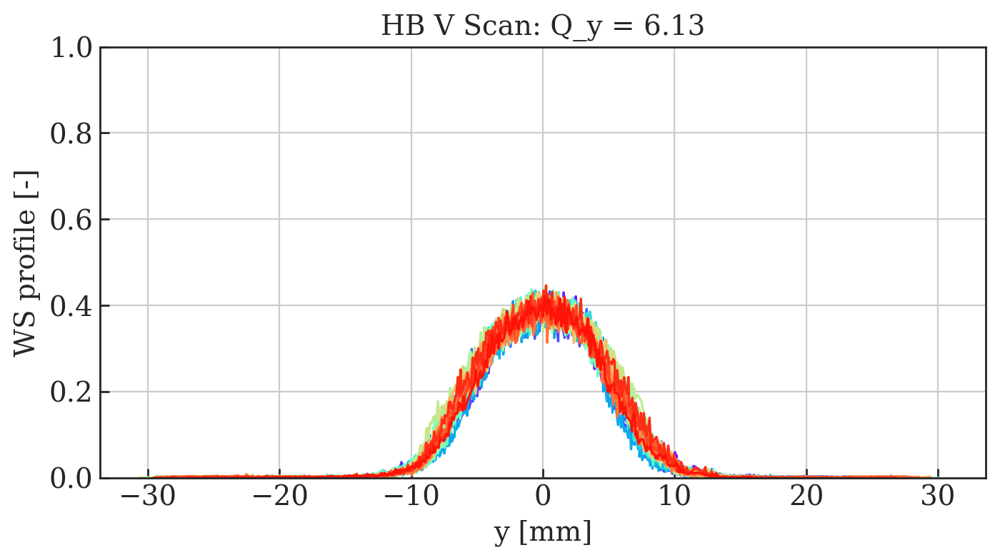

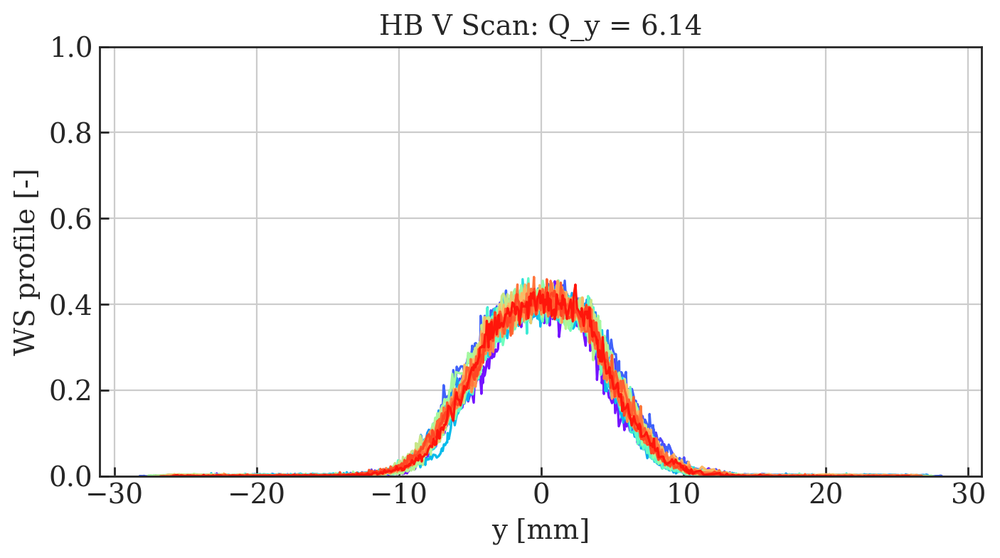

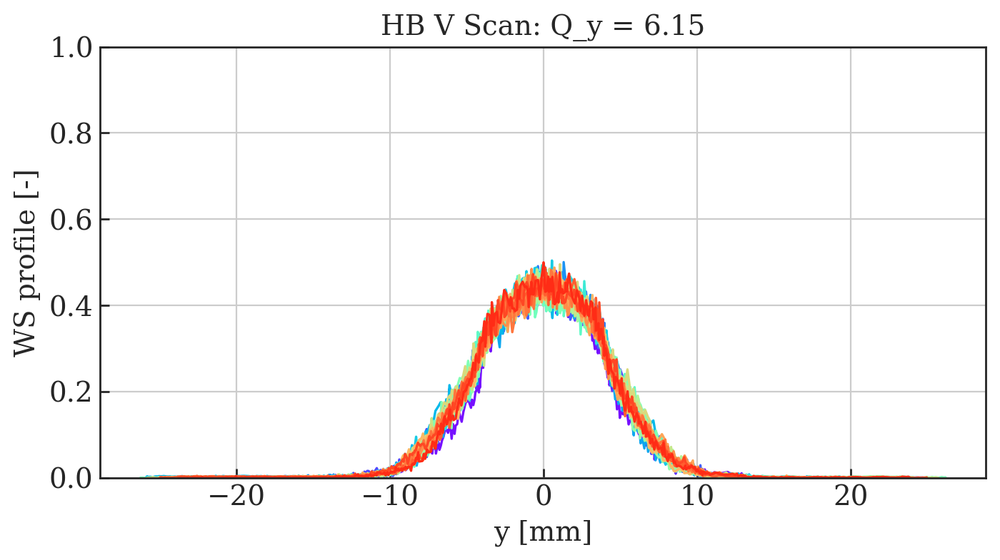

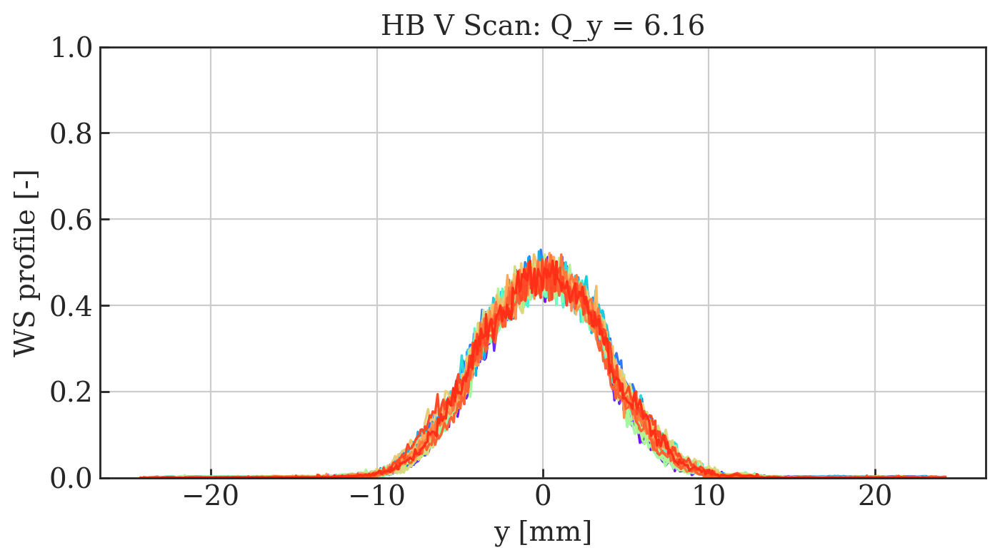

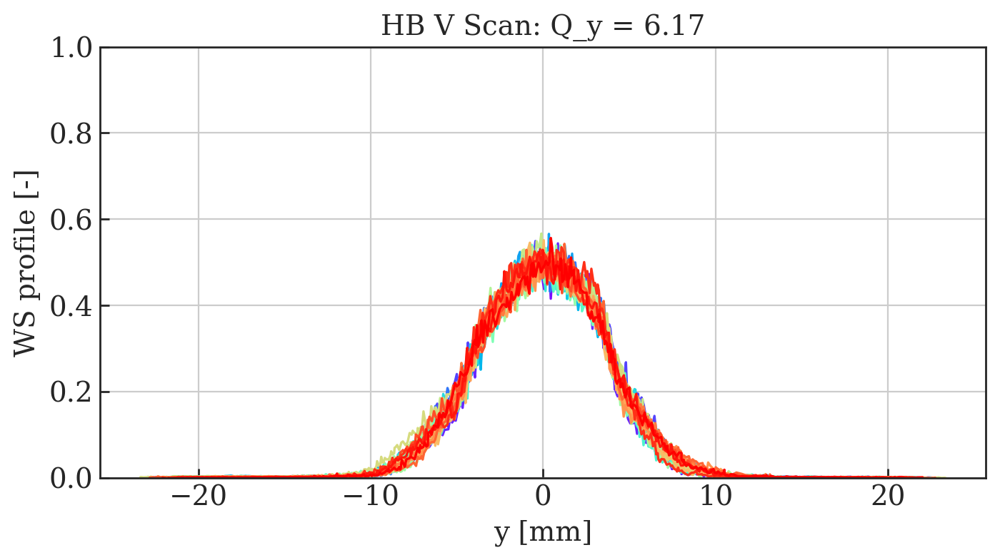

...

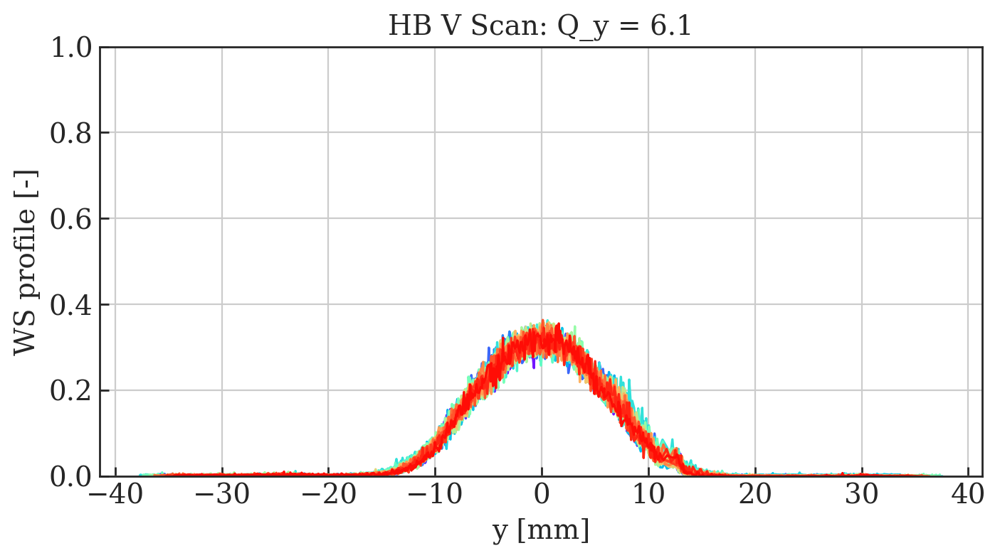

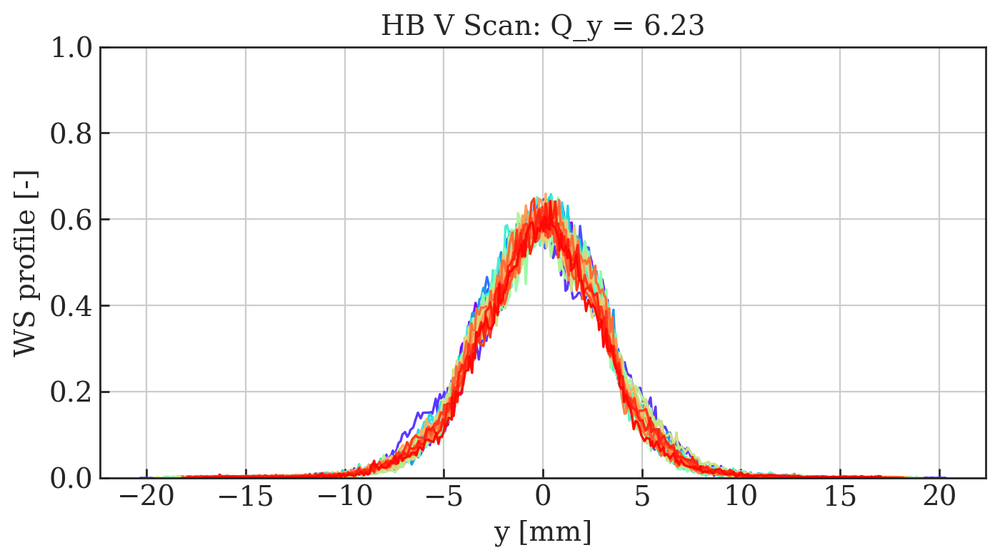

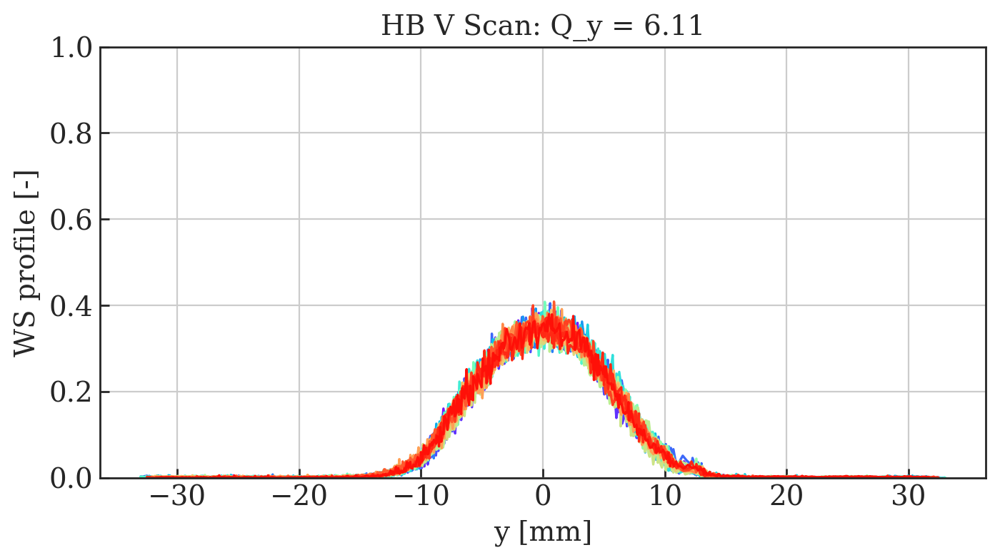

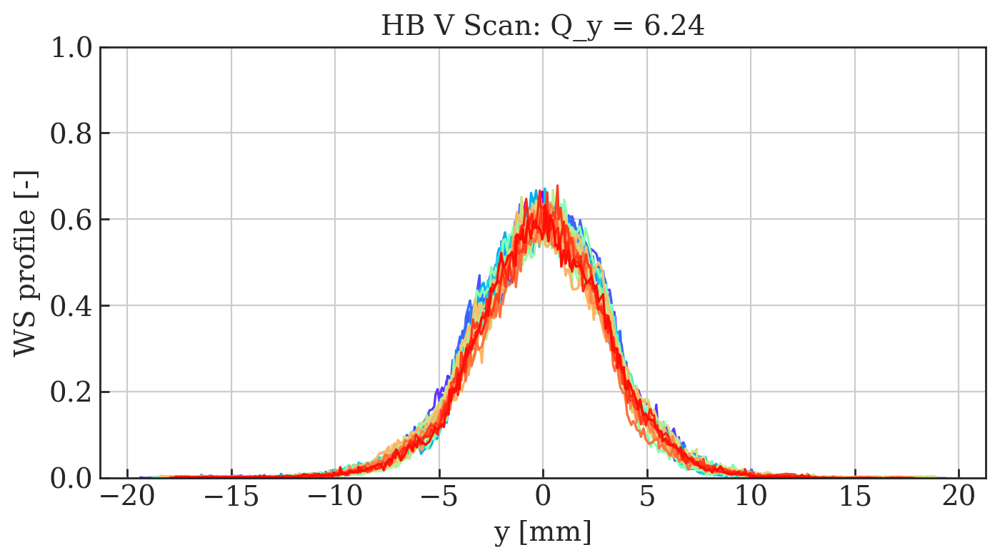

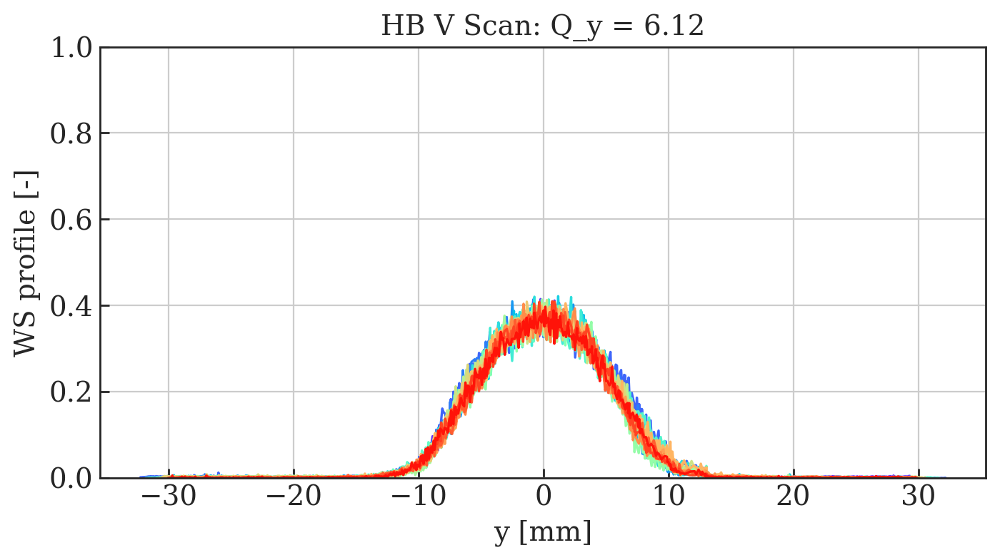

In [50]:
# Plot WS profiles grouped by Qx
for key, value in tune_points.iteritems():
    fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
    for i in xrange(len(value)):
        # dataframe index = value[i]
        plt.plot(df0['position V'].iloc[value[i]], df0['profile V'].iloc[value[i]], color=colors[value[i]])
    plt.xlabel('y [mm]')
    plt.ylabel('WS profile [-]')
    title = str('HB V Scan: Q_y = ' + str(key))
    plt.title(title)
    plt.ylim(0, 1)
    plt.grid()
    savename = str('MD4224_HB_Vertical_Manual_Fit_WS_Profiles_Qy=' + str(key) + '_Using_Sim_Optics.png')
#     fig.savefig(savename)

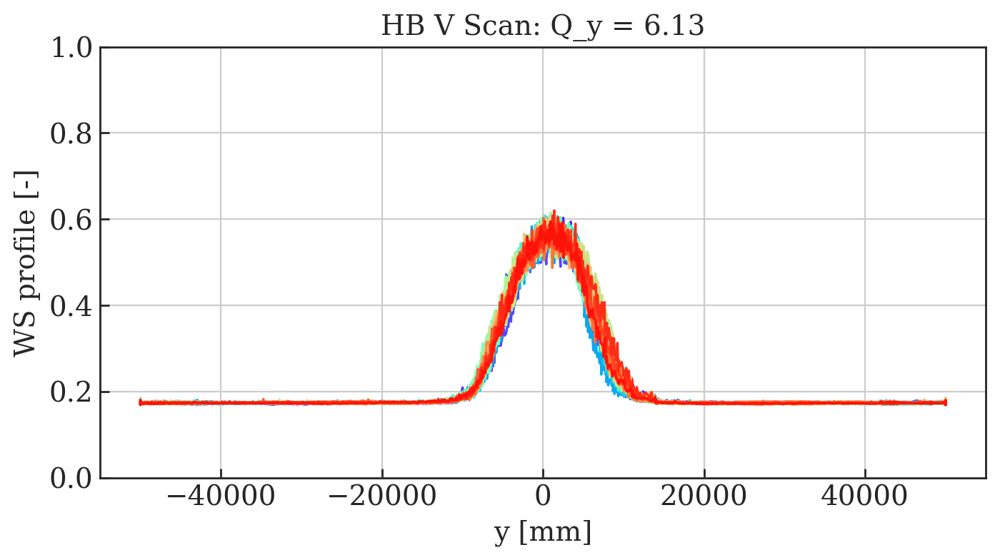

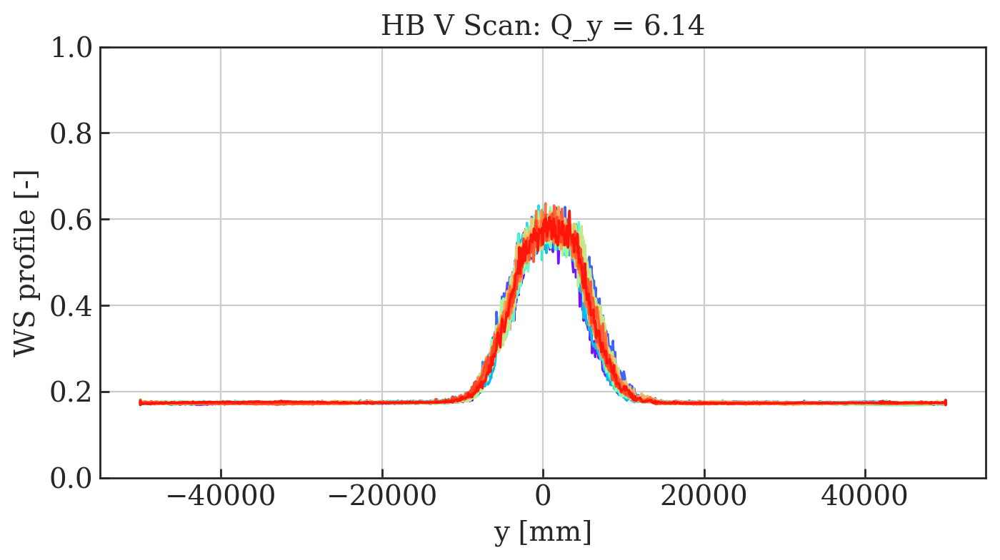

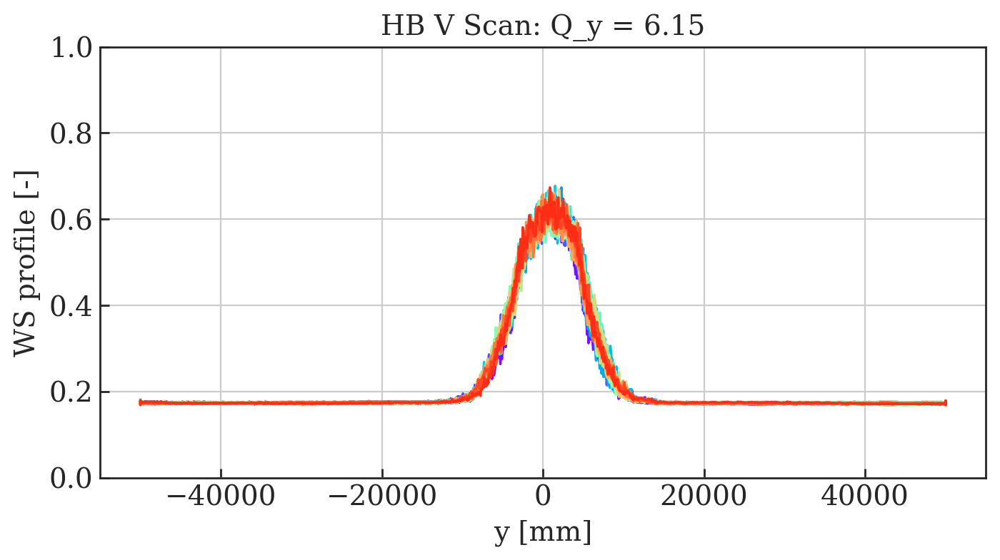

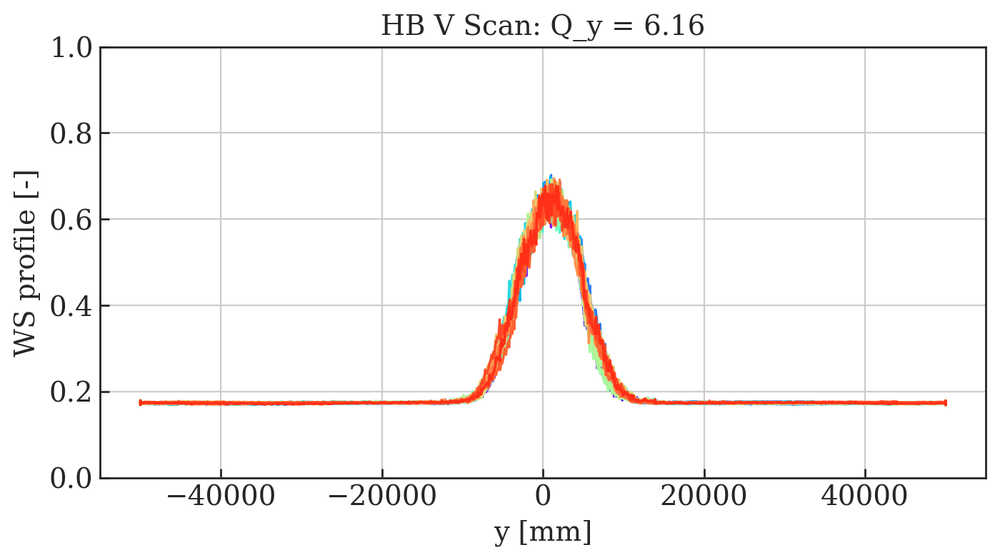

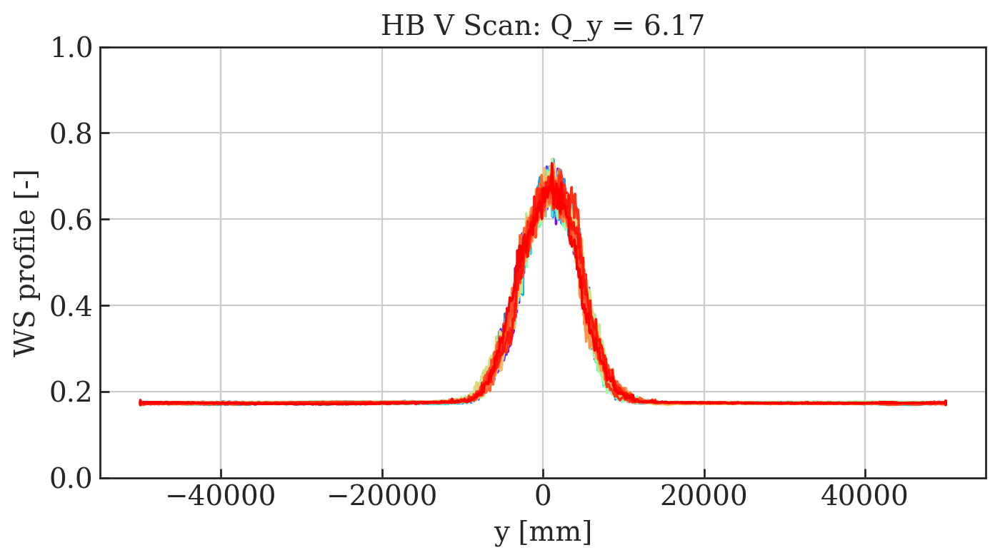

...

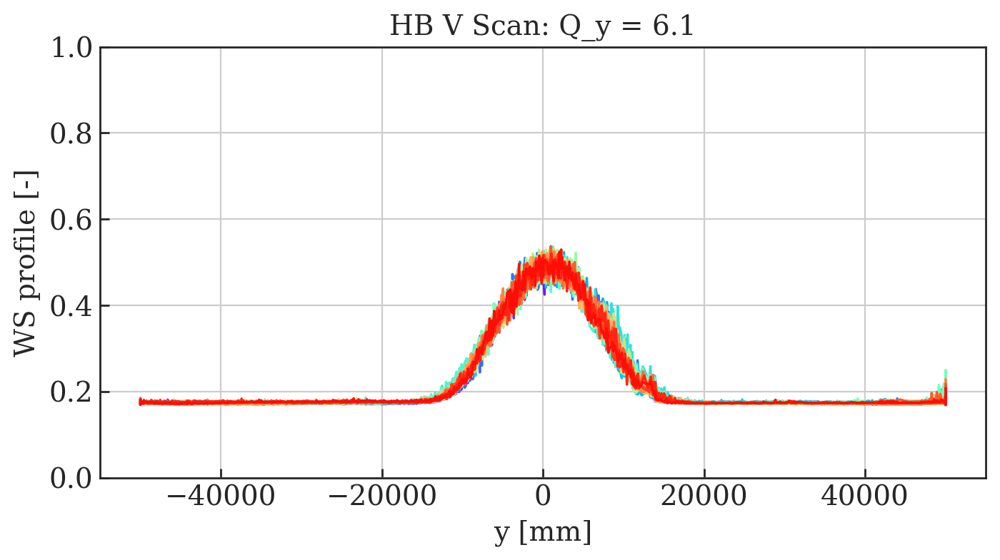

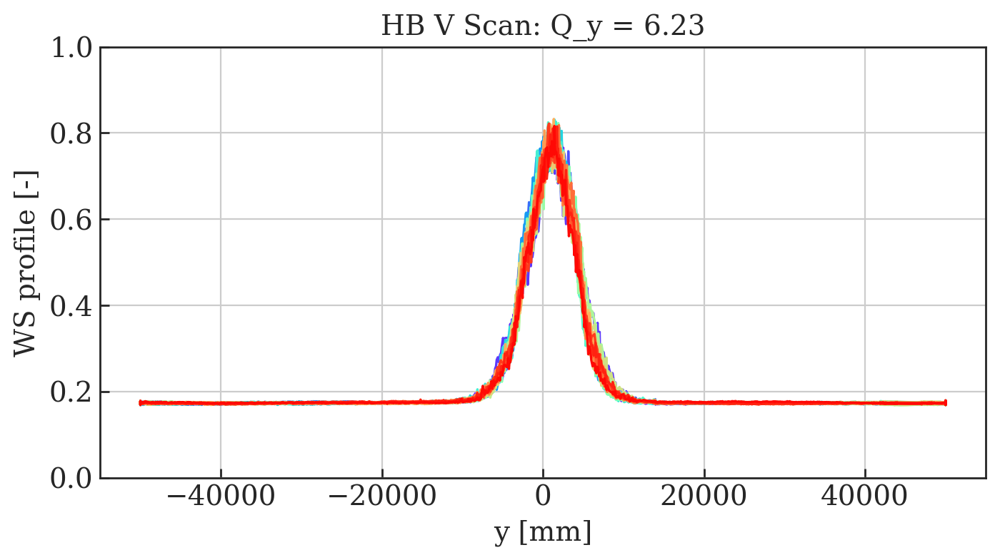

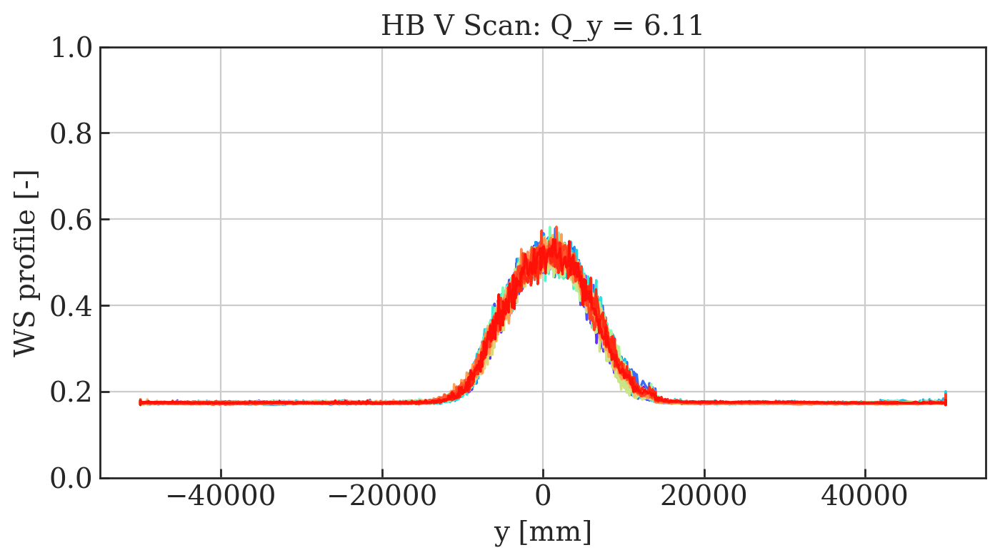

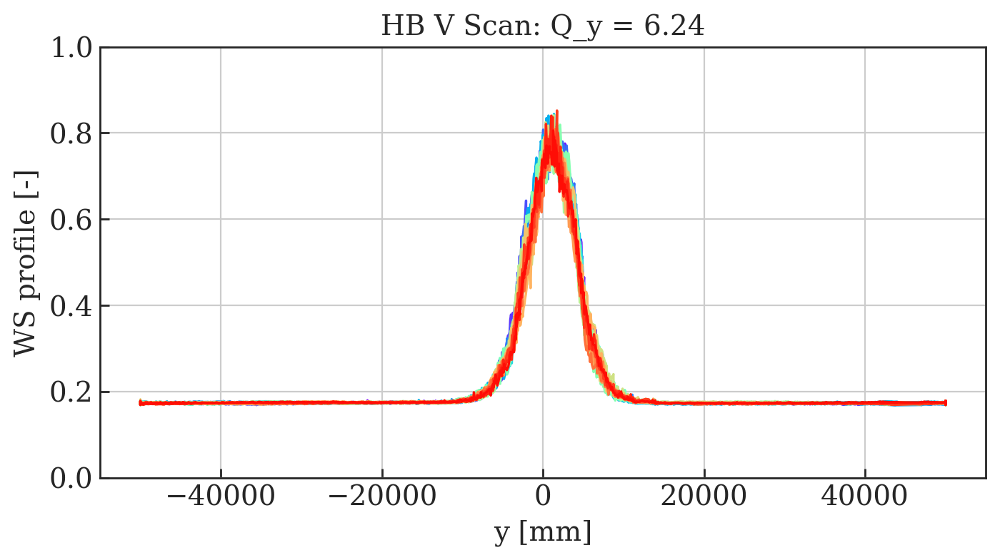

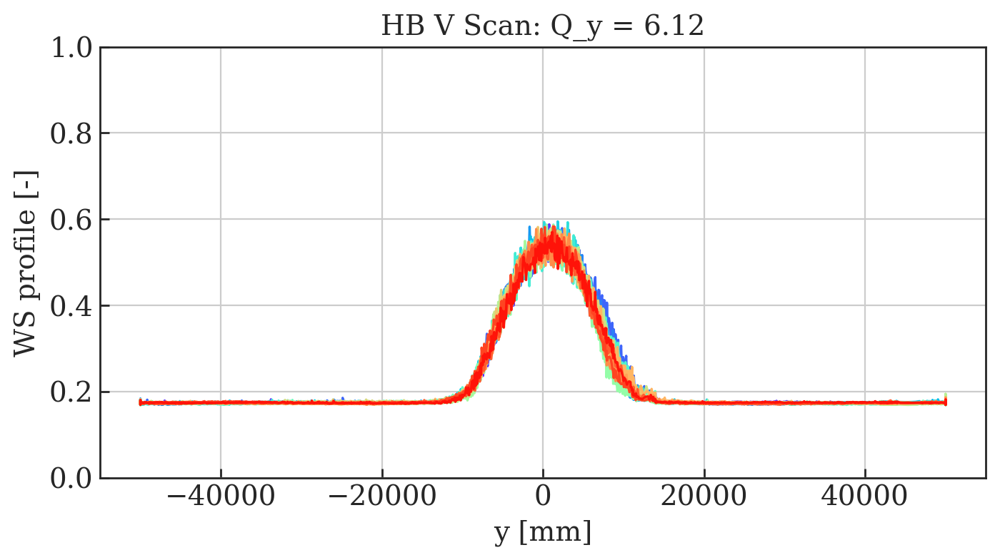

In [51]:
# Plot WS profiles grouped by Qx
for key, value in tune_points.iteritems():
    fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
    for i in xrange(len(value)):
        # dataframe index = value[i]
        plt.plot(df0['PR.BWS.64.V_ROT:PROF_POSITION_IN'].iloc[value[i]], df0['PR.BWS.64.V_ROT:PROF_DATA_IN'].iloc[value[i]], color=colors[value[i]])
    plt.xlabel('y [mm]')
    plt.ylabel('WS profile [-]')
    title = str('HB V Scan: Q_y = ' + str(key))
    plt.title(title)
    plt.ylim(0, 1)
    plt.grid()
    savename = str('MD4224_HB_Vertical_Manual_Fit_WS_Profiles_Raw_Qy=' + str(key) + '_Using_Sim_Optics.png')
#     fig.savefig(savename)

## Plot Vertical emittance

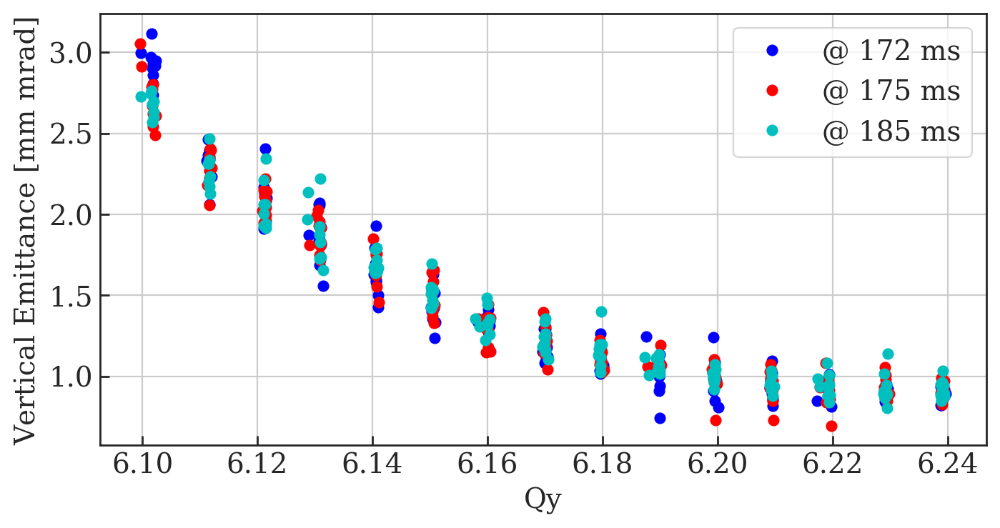

In [52]:
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
plt.plot(df0['Qy'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)]+6, df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)],'bo', label='@ 172 ms');
plt.plot(df0['Qy'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)]+6, df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)],'ro', label='@ 175 ms');
plt.plot(df0['Qy'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)]+6, df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)],'co', label='@ 185 ms');
plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');
plt.legend();
#plt.title('Wire Scanner Acquisition Delay');
#plt.xlim(6.075, 6.25);
#plt.ylim(0,5);
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Emittance_Using_Sim_Optics.png');

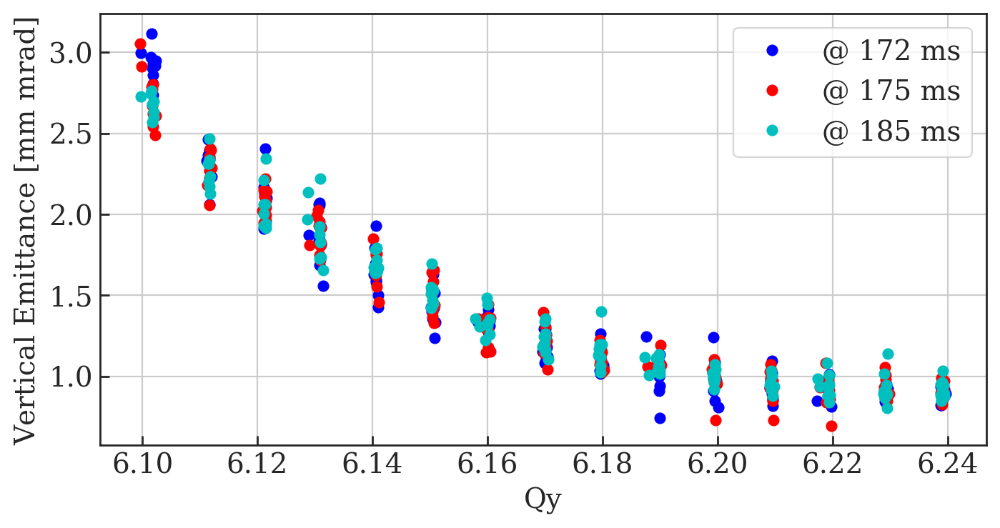

In [53]:
# Plot each shot: Qy vs Ey

fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
plt.plot(df0['Qy'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)]+6, df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)],'bo', label='@ 172 ms');
plt.plot(df0['Qy'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)]+6, df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)],'ro', label='@ 175 ms');
plt.plot(df0['Qy'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)]+6, df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)],'co', label='@ 185 ms');
plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');
plt.legend();
#plt.title('Wire Scanner Acquisition Delay');
#plt.xlim(6.075, 6.25);
#plt.ylim(0,5);
plt.grid();
fig.savefig('MD4224_Horizontal_WS_Delay_Emittance_Using_Sim_Optics.png');

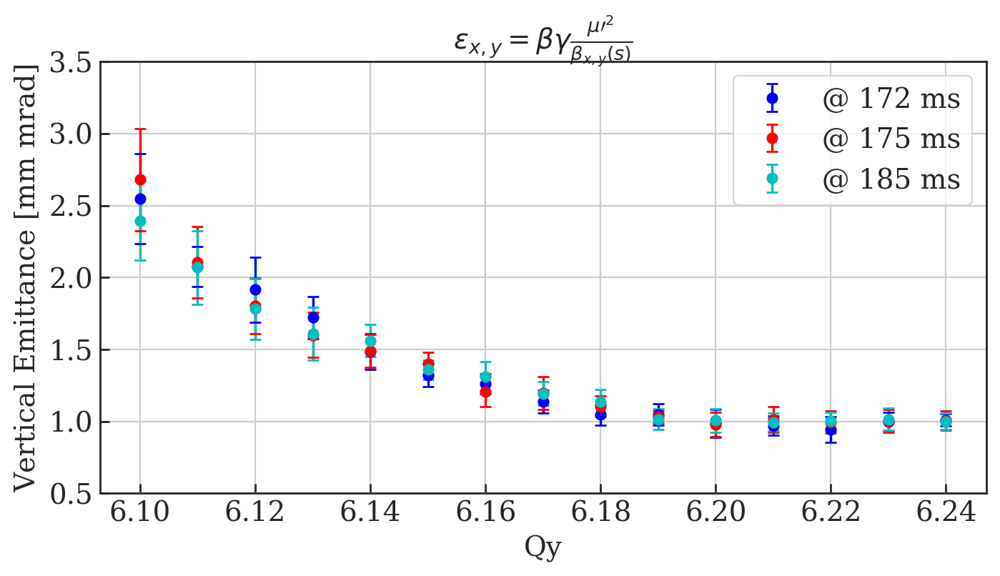

In [54]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_175.append( np.std( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_185.append( np.std( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');

plt.title(r'$\epsilon_{x,y} = \beta\gamma \frac{\mu\prime^2}{\beta_{x,y}(s)}$')

plt.ylim(0.5, 3.5)

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Emittance_2nd_Errors_Using_Sim_Optics.png');

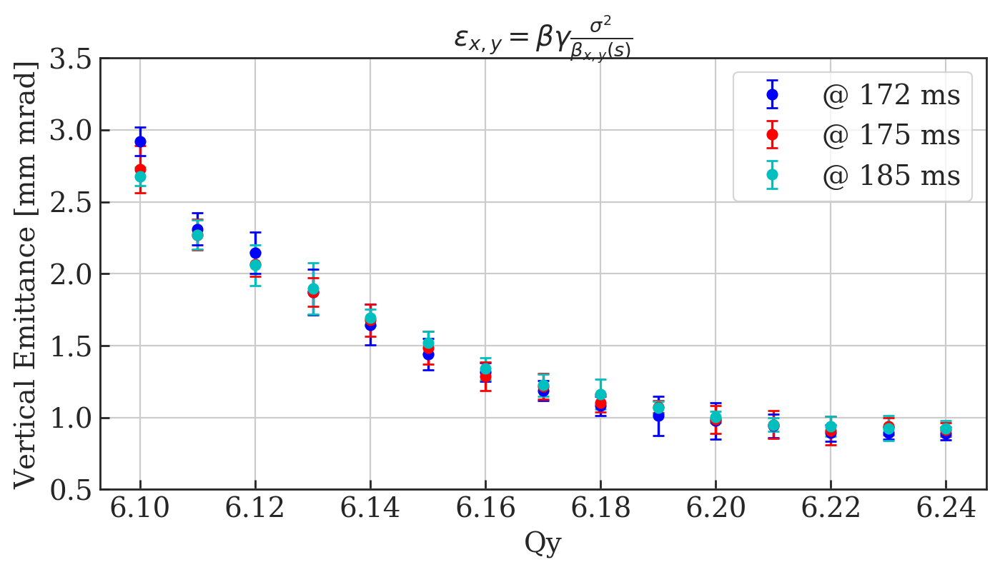

In [55]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_175.append( np.std( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_185.append( np.std( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');

plt.title(r'$\epsilon_{x,y} = \beta\gamma \frac{\sigma^2}{\beta_{x,y}(s)}$')

plt.ylim(0.5, 3.5)

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Emittance_Errors_Using_Sim_Optics.png');

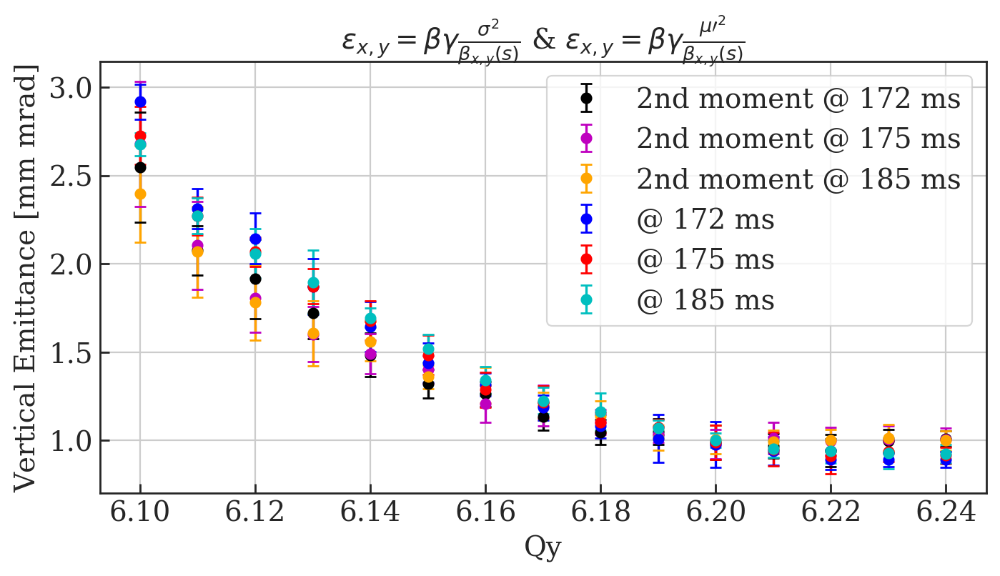

In [56]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

y_data_1722 = []
y_data_1752 = []
y_data_1852 = []

y_error_1722 = []
y_error_1752 = []
y_error_1852 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_175.append( np.std( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_185.append( np.std( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_data_1722.append( np.mean( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_1752.append( np.mean( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_1852.append( np.mean( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_1722.append( np.std( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_1752.append( np.std( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_1852.append( np.std( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_1722, y_error_1722, label='2nd moment @ 172 ms', linestyle='None', marker='o', capsize=3, color='k')
plt.errorbar(x_data, y_data_1752, y_error_1752, label='2nd moment @ 175 ms', linestyle='None', marker='o', capsize=3, color='m')
plt.errorbar(x_data, y_data_1852, y_error_1852, label='2nd moment @ 185 ms', linestyle='None', marker='o', capsize=3, color='orange')

    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');

plt.title(r'$\epsilon_{x,y} = \beta\gamma \frac{\sigma^2}{\beta_{x,y}(s)}$ & $\epsilon_{x,y} = \beta\gamma \frac{\mu\prime^2}{\beta_{x,y}(s)}$')

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Emittance_both_Errors_Using_Sim_Optics.png');

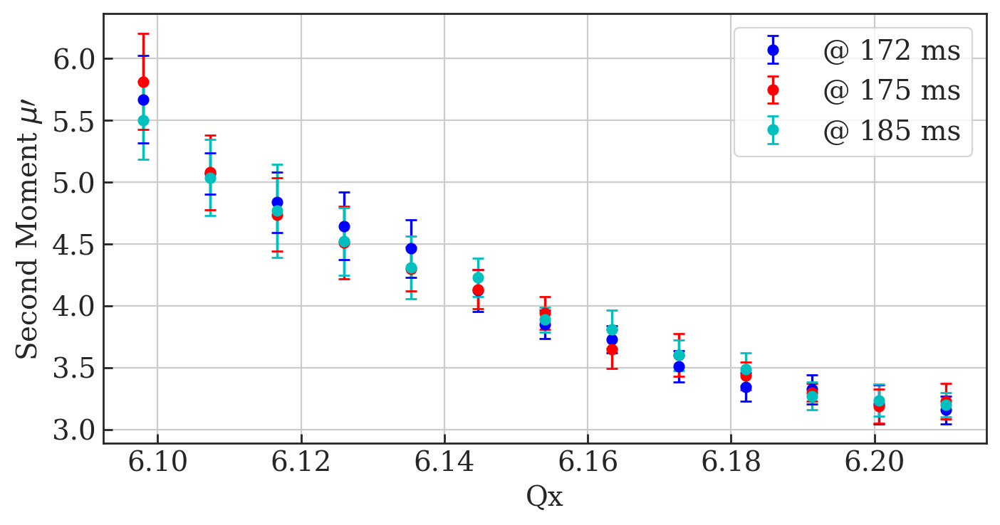

In [57]:
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
# Plot averaged data points with error bars
x_data = np.linspace(607, 621, 16);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_175.append( np.std( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_185.append( np.std( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

plt.xlabel('Qx');
plt.ylabel(r'Second Moment $\mu\prime$');

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_2nd_Moment_Errors_Using_Sim_Optics.png');

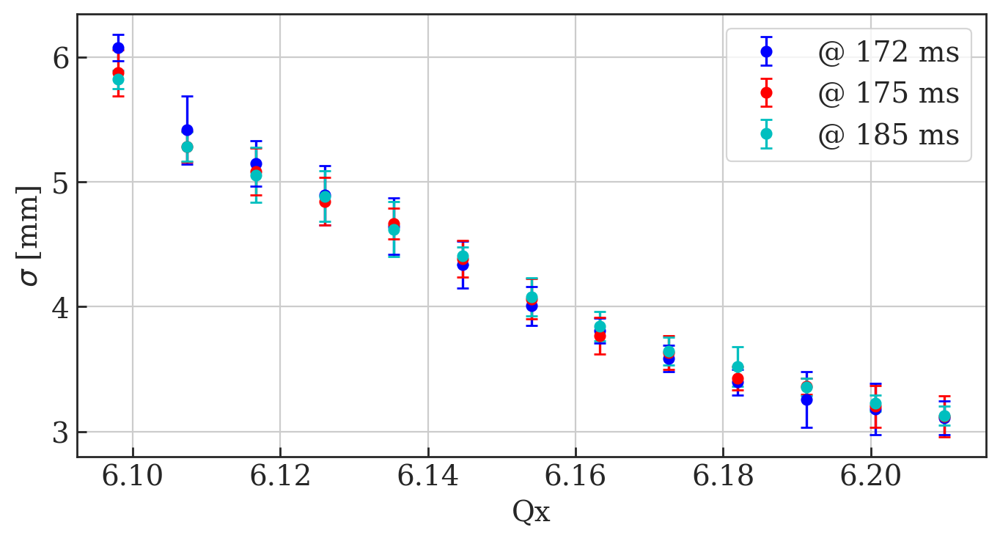

In [58]:
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
# Plot averaged data points with error bars
x_data = np.linspace(607, 621, 16);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_175.append( np.std( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_185.append( np.std( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

plt.xlabel('Qx');
plt.ylabel(r'$\sigma$ [mm]');

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Sigma_Errors_Using_Sim_Optics.png');

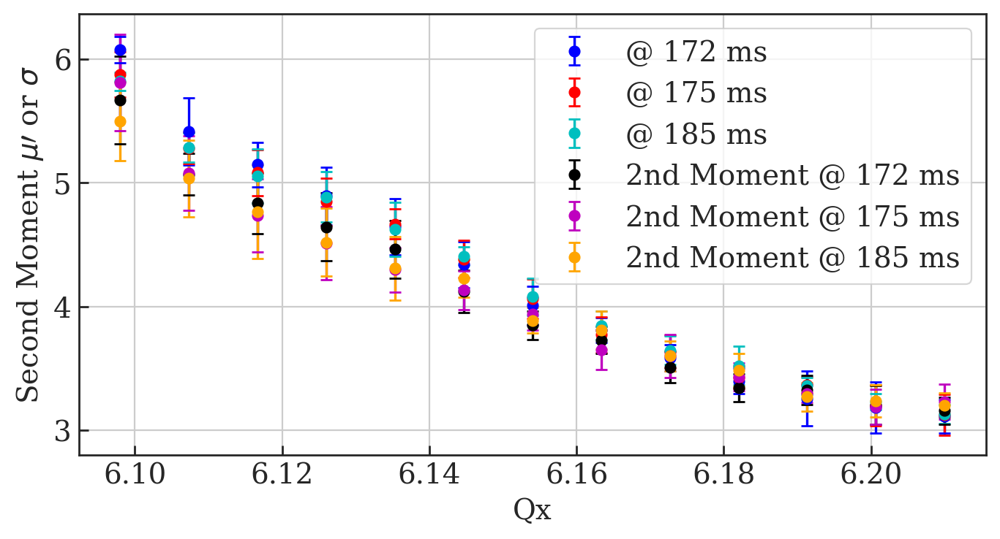

In [59]:
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
# Plot averaged data points with error bars
x_data = np.linspace(607, 621, 16);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

y_data_1722 = []
y_data_1752 = []
y_data_1852 = []

y_error_1722 = []
y_error_1752 = []
y_error_1852 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_1722.append( np.mean( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_1752.append( np.mean( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_1852.append( np.mean( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_1722.append( np.std( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_1752.append( np.std( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_1852.append( np.std( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_data_172.append( np.mean( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_175.append( np.std( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_185.append( np.std( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

    
plt.errorbar(x_data, y_data_1722, y_error_1722, label='2nd Moment @ 172 ms', linestyle='None', marker='o', capsize=3, color='k')
plt.errorbar(x_data, y_data_1752, y_error_1752, label='2nd Moment @ 175 ms', linestyle='None', marker='o', capsize=3, color='m')
plt.errorbar(x_data, y_data_1852, y_error_1852, label='2nd Moment @ 185 ms', linestyle='None', marker='o', capsize=3, color='orange')

plt.xlabel('Qx');
plt.ylabel(r'Second Moment $\mu\prime$ or $\sigma$');

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_2nd_Moment_and_Sigma_Errors_Using_Sim_Optics.png');

In [60]:
np.mean( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>.05)][(df0['Qy']<.1045)] )

2.9185748344876954

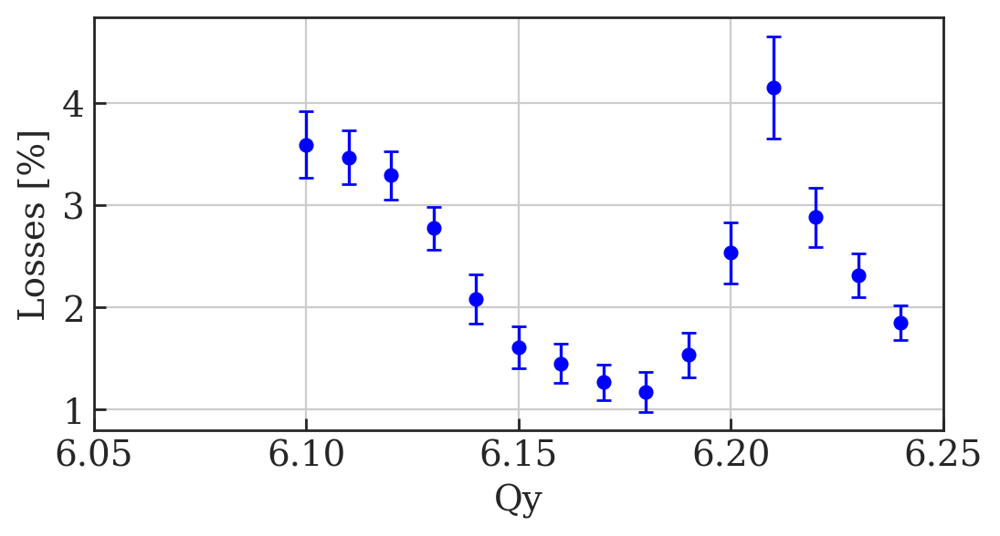

In [61]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(6, 3), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['losses'][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['losses'][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')

plt.xlabel('Qy');
plt.ylabel('Losses [%]');
plt.xlim(6.05, 6.25)

#plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Losses_Errors_Using_Sim_Optics.png');

# Load Distributions From Simulation Data

In [62]:
import matplotlib.gridspec as gridspec
from math import log10, floor
import matplotlib.cm as cm
import scipy.io as sio 
import numpy as np
import glob

# Read filename, import data
def particles_from_matfile(filename):
    d = dict()
    sio.loadmat(filename, mdict=d)
    return d

# round to n significant figures
def round_sig(x, sig=4):
    return round(x, sig-int(floor(log10(abs(x))))-1)

In [63]:
# Read .mat files into a dictionary

matfiles = glob.glob("13_May/*.mat")
sims = dict()

for f in matfiles:
    first = f.split('/')[1]
    second = first.split('.')[0]
    sims[str(second)] = f
    
sims

{'610_SbS_c172': '13_May/610_SbS_c172.mat',
 '611_SbS_c172': '13_May/611_SbS_c172.mat',
 '612_SbS_c172': '13_May/612_SbS_c172.mat',
 '613_SbS_c172': '13_May/613_SbS_c172.mat',
 '614_SbS_c172': '13_May/614_SbS_c172.mat',
 '615_SbS_c172': '13_May/615_SbS_c172.mat',
 '616_SbS_c172': '13_May/616_SbS_c172.mat',
 '617_SbS_c172': '13_May/617_SbS_c172.mat',
 '618_SbS_c172': '13_May/618_SbS_c172.mat',
 '619_SbS_c172': '13_May/619_SbS_c172.mat',
 '620_SbS_c172': '13_May/620_SbS_c172.mat',
 '621_SbS_c172': '13_May/621_SbS_c172.mat',
 '622_SbS_c172': '13_May/622_SbS_c172.mat',
 '623_SbS_c172': '13_May/623_SbS_c172.mat',
 '624_SbS_c172': '13_May/624_SbS_c172.mat'}

# Dictionary of tune points

In [64]:
# These are our tune points:
scan_points = np.linspace(610, 624, 15);
scan_points = scan_points/100;

Qy_points=[]
for i in scan_points:
    Qy_points.append(round_sig(i,5))
print Qy_points

[6.1, 6.11, 6.12, 6.13, 6.14, 6.15, 6.16, 6.17, 6.18, 6.19, 6.2, 6.21, 6.22, 6.23, 6.24]


In [65]:
# Make dictionary of nearest tune point and iterators
Qy_point_separation = Qy_points[1] - Qy_points[0]
Qy_pt_sep = Qy_point_separation/2
print 'Tune points separated by +/- ', Qy_pt_sep

tune_points = {}
for i in Qy_points:
    tune_points[i] = np.where(np.logical_and(np.greater_equal(df0['Qy'], (i-Qy_pt_sep-6)), np.less_equal(df0['Qy'], (i+Qy_pt_sep-6)) ) )[0]
tune_points

Tune points separated by +/-  0.005


{6.1: array([ 13,  28,  42,  57,  72,  99, 114, 129, 144, 159, 173, 186, 201,
        214, 228, 243, 258, 272, 286, 300, 314, 329, 343, 356, 371, 384,
        397, 410]),
 6.11: array([ 12,  27,  41,  56,  71,  86,  98, 113, 128, 143, 158, 172, 200,
        227, 242, 257, 271, 285, 299, 313, 328, 342, 370, 383, 396, 409]),
 6.12: array([ 26,  55,  70,  85, 112, 127, 142, 157, 171, 185, 199, 213, 226,
        241, 256, 270, 284, 298, 312, 327, 341, 369, 382, 408]),
 6.13: array([ 11,  25,  40,  54,  69,  84,  97, 111, 126, 141, 156, 170, 184,
        198, 212, 225, 240, 255, 269, 283, 297, 311, 326, 340, 355, 368,
        381, 395, 407]),
 6.14: array([ 10,  24,  39,  53,  68,  83,  96, 110, 125, 140, 155, 169, 183,
        197, 211, 224, 239, 254, 268, 296, 310, 325, 339, 354, 367, 380,
        406]),
 6.15: array([  9,  23,  38,  52,  67,  82,  95, 109, 124, 139, 154, 182, 196,
        210, 223, 238, 253, 267, 282, 295, 309, 324, 338, 353, 366, 379,
        394]),
 6.16: array([  8,  

# Function to find Peak

In [66]:
def peakfinder (x_dat, y_dat, tolerance = 1, verbose=False):
    
    # Find maximum
    max_y = max(y_dat)
    if verbose: print '\n\tMAX(y_dat) = ', max_y   
    
    # Assume peak as centre
    index = np.where(y_dat == max_y)[0][0]

    # Check if centre is near 0.0
    if abs(x_dat[index]) < tolerance:
        if verbose: print '\tx_dat[index] = ', x_dat[index]
    
    # Manually find 0 index
    else:
        if verbose: print '\tindex from y_dat peak not within tolerance of',tolerance,'mm. \n\ttry manual search'
        
        index = -1
        final_index = -1
        for i in xrange(len(x_dat)):
            index = index + 1
            if x_dat[i] < 0.0:
                final_index = index
                break
                
        index = final_index
        if verbose: print '\tindex = ', index       
       
    if verbose: print '\tindex of x_dat = ', x_dat[index],' is ', index
        
    # Take y=0 +/- 3 points and find mean 
    mean_dat = [y_dat[index-3],  y_dat[index-2],  y_dat[index-1], y_dat[index],  y_dat[index+1],  y_dat[index+2],  y_dat[index+3]]
    mean_7 = np.mean(mean_dat)
    if verbose: print '\tMean of peak point +/- 3 points = ', mean_7   
    
    if abs( abs(mean_7 - max_y) / mean_7 ) > 0.2:
        print '\tWARNING: difference between mean and max_y > 20% = ', abs( abs(mean_7 - max_y) / mean_7 )
        print '\t using peak value'
        mean_7 = max_y
    return mean_7

# Test Peakfinder

In [67]:
peak = peakfinder(np.array(df0['position V'].iloc[0]), np.array(df0['profile V'].iloc[0]),tolerance = 0.01, verbose=True)
print peak



	MAX(y_dat) =  0.6638534591783954
	index from y_dat peak not within tolerance of 0.01 mm. 
	try manual search
	index =  192
	index of x_dat =  -0.03379243863650805  is  192
	Mean of peak point +/- 3 points =  0.638239823191498
0.638239823191498


peak @ 65.80684350030633


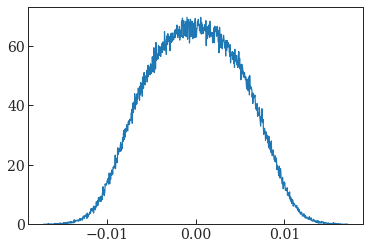

In [68]:
d = particles_from_matfile('13_May/610_SbS_c172.mat')
plt.clf()
x, bins_, p = plt.hist(d['particles']['y'][0][0][0], bins = 1000, density=True, histtype=u'step', lw=0, color='k')
    
    
peak = peakfinder(np.array(bins_[:-1]), np.array(x))
print 'peak @', peak

plt.plot(bins_[:-1], x);

# Check all simulation data peaks

In [69]:
for key, value in sorted(sims.iteritems()):
    print value
    d = particles_from_matfile(value)
    plt.clf()
    x, bins_, p = plt.hist(d['particles']['y'][0][0][0], bins = 1000, density=True, histtype=u'step', lw=0, color='k')

    peak = peakfinder(np.array(bins_[:-1]), np.array(x), verbose=True)
    print '\n peak = ', peak, '\n'
    plt.close()

13_May/610_SbS_c172.mat

	MAX(y_dat) =  69.71558331814465
	x_dat[index] =  -0.0009698441617733769
	index of x_dat =  -0.0009698441617733769  is  471
	Mean of peak point +/- 3 points =  65.80684350030633

 peak =  65.80684350030633 

13_May/611_SbS_c172.mat

	MAX(y_dat) =  77.61966927491146
	x_dat[index] =  0.0012317450247236253
	index of x_dat =  0.0012317450247236253  is  540
	Mean of peak point +/- 3 points =  72.70373054271138

 peak =  72.70373054271138 

13_May/612_SbS_c172.mat

	MAX(y_dat) =  83.28735974664797
	x_dat[index] =  -0.00030971480557629924
	index of x_dat =  -0.00030971480557629924  is  500
	Mean of peak point +/- 3 points =  78.18935559660613

 peak =  78.18935559660613 

13_May/613_SbS_c172.mat

	MAX(y_dat) =  94.4351389971383
	x_dat[index] =  -0.00035219883373246996
	index of x_dat =  -0.00035219883373246996  is  496
	Mean of peak point +/- 3 points =  86.44610931990984

 peak =  86.44610931990984 

13_May/614_SbS_c172.mat

	MAX(y_dat) =  97.95691970647584
	x_dat[in

# Plot wirescanner profiles with simulation data

In [70]:
# Function to plot data:
# d = simulation matfile dictionary
# df = MD dataframe
# md_points = array of dataframe indexes

def Plot_profiles_MD_cf_Sims(d, df, md_points, main_label = '', bins=1000, sim_label='sim', md_label='MD'):
    fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
    multi = 1/1E-3
    
    plt.clf()
    x, bins_, p = plt.hist(d['particles']['y'][0][0][0]*multi, bins = bins, density=True, histtype=u'step', lw=0, color='k')
    
    for i in md_points:
        
        # Normalisation so all plots peak at y=1
        df_norm = 1/peakfinder(np.array(df0['position V'].iloc[i]), np.array(df0['profile V'].iloc[i]))
        sim_norm = 1/peakfinder(np.array(bins_[:-1]), np.array(x))
        
        lab = md_label + str(i)
        plt.plot(df0['position V'].iloc[i], np.array(df0['profile V'].iloc[i])*df_norm, color=colors[i], label = md_label, lw=0.5)
  
    bins_ = np.array(bins_[:-1]) + (abs(bins_[0]-bins_[1])/2)

    plt.plot(bins_, x*sim_norm, lw=2, color='k', label=sim_label)
    
    
    plt.ylabel('Arbitrary Unit')
    plt.xlabel('y [mm]')
    plt.legend(fontsize='x-small')
    plt.grid();
    plt.title(main_label)
    savename = main_label + '.png'
    fig.savefig(savename);


Importing simulation file: 610_SbS_c172
Qy =  6.1 , ctime = 172.0 [ms]
[13, 57, 99, 144, 186, 228, 272, 314, 356, 397]

Importing simulation file: 611_SbS_c172
Qy =  6.11 , ctime = 172.0 [ms]
[12, 56, 98, 143, 227, 271, 313, 396]
	 using peak value
	 using peak value
	 using peak value
	 using peak value
	 using peak value
	 using peak value
	 using peak value
	 using peak value

Importing simulation file: 612_SbS_c172
Qy =  6.12 , ctime = 172.0 [ms]
[55, 142, 185, 226, 270, 312]

Importing simulation file: 613_SbS_c172
Qy =  6.13 , ctime = 172.0 [ms]
[11, 54, 97, 141, 184, 225, 269, 311, 355, 395]

Importing simulation file: 614_SbS_c172
Qy =  6.14 , ctime = 172.0 [ms]
[10, 53, 96, 140, 183, 224, 268, 310, 354]

Importing simulation file: 615_SbS_c172
Qy =  6.15 , ctime = 172.0 [ms]
[9, 52, 95, 139, 182, 223, 267, 309, 353, 394]

Importing simulation file: 616_SbS_c172
Qy =  6.16 , ctime = 172.0 [ms]
[8, 51, 94, 138, 181, 222, 266, 308, 352, 393]

Importing simulation file: 617_SbS_c

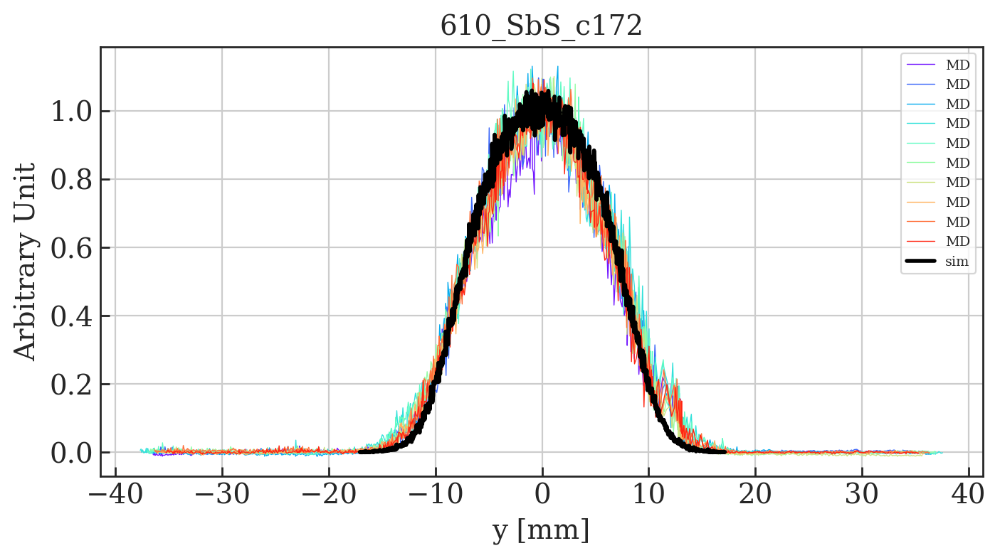

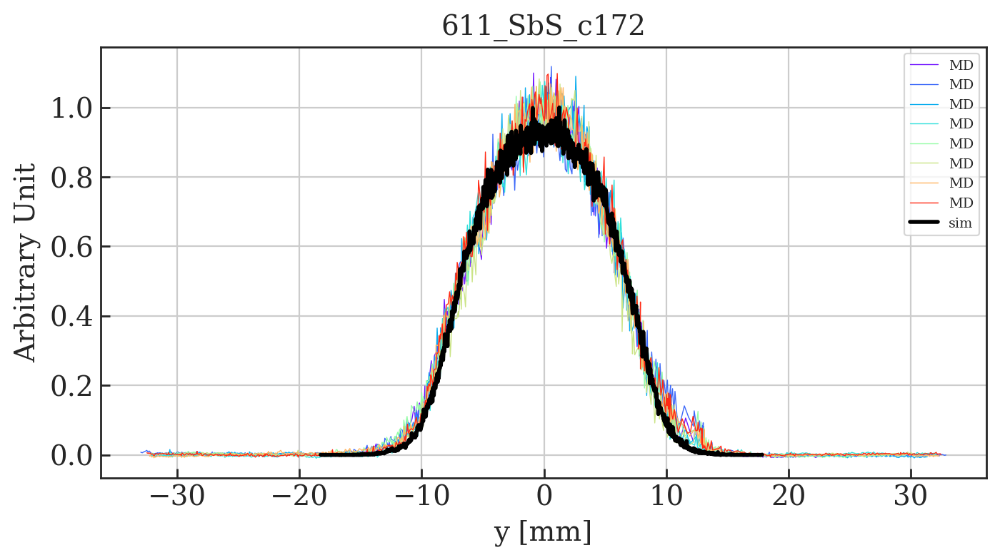

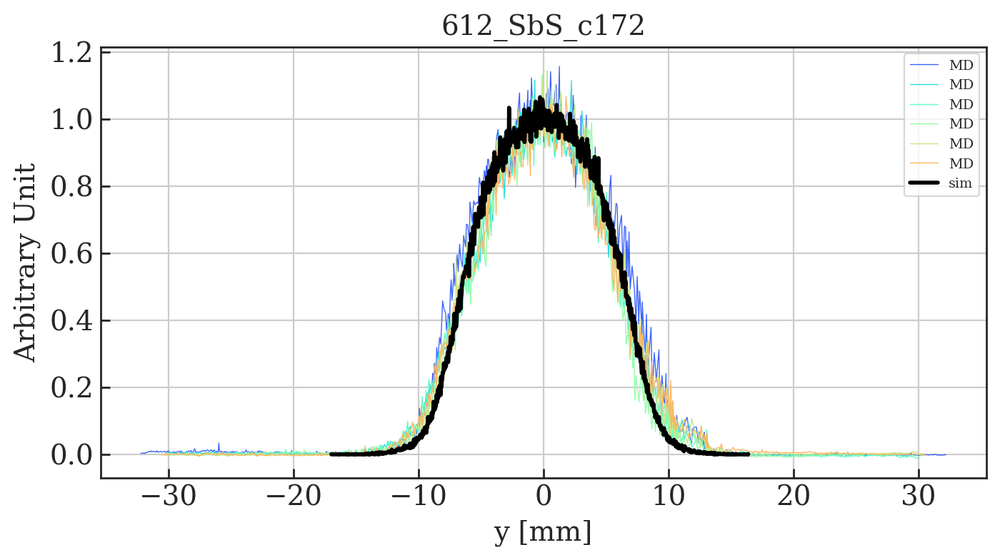

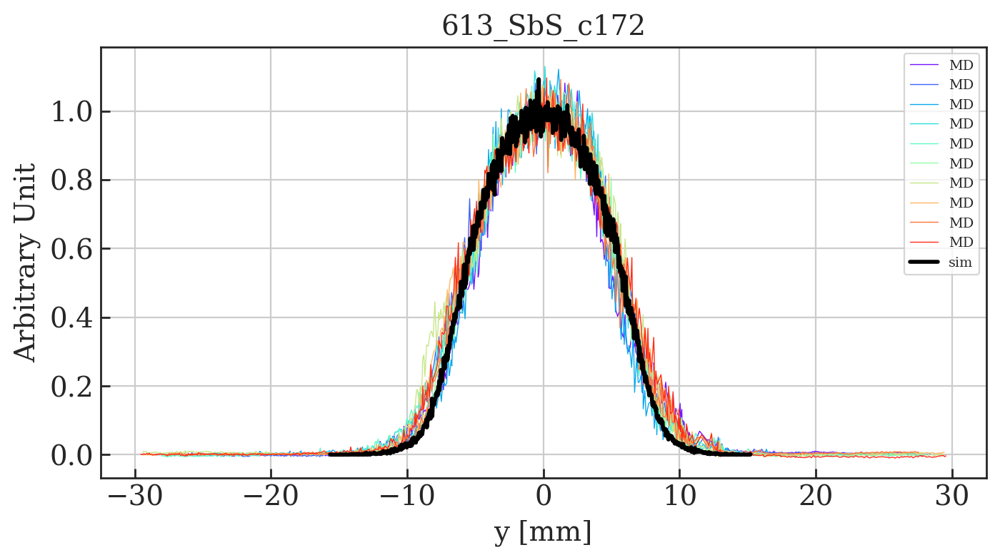

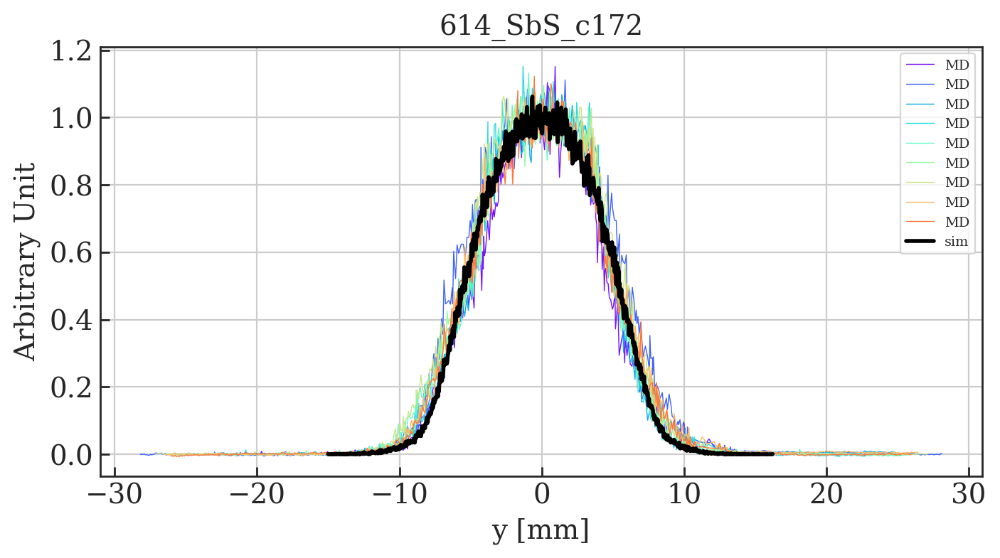

...

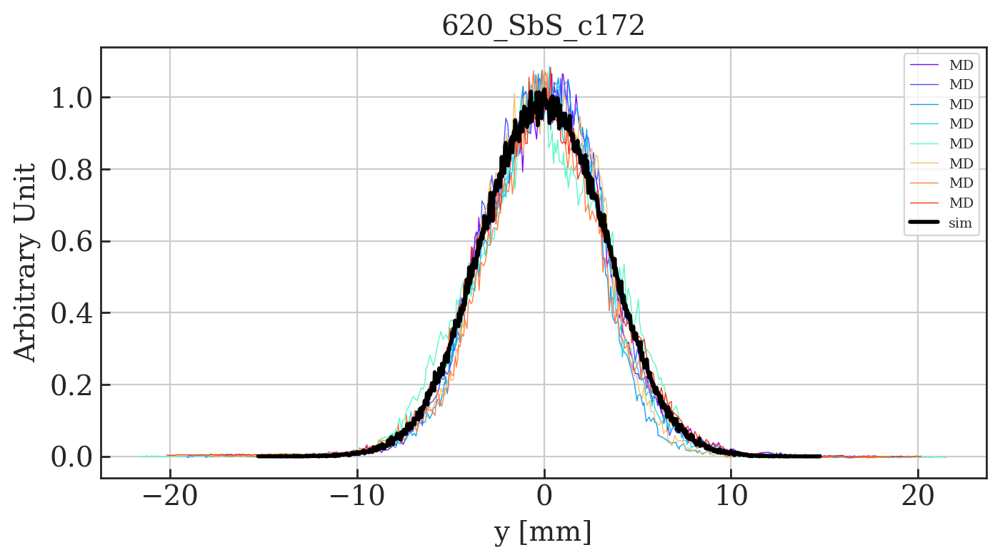

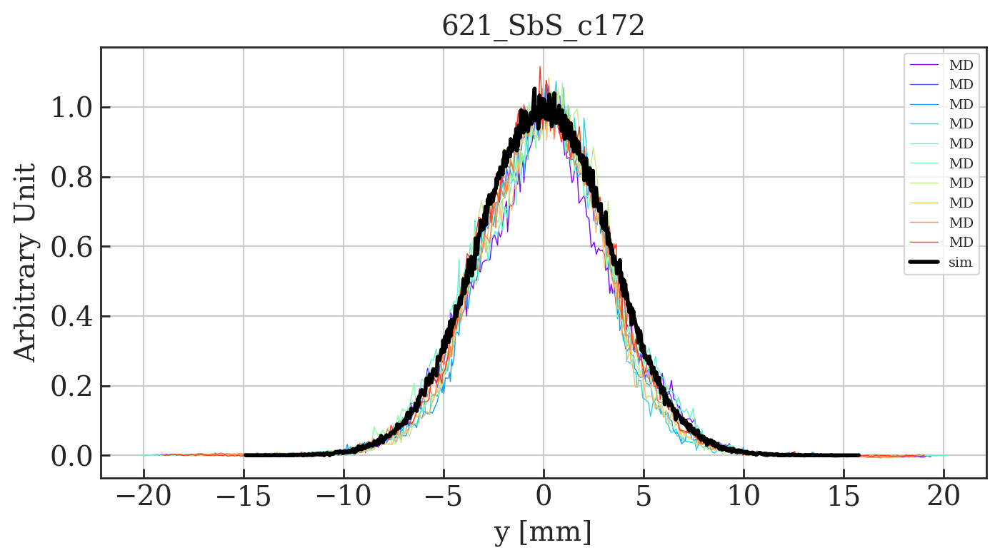

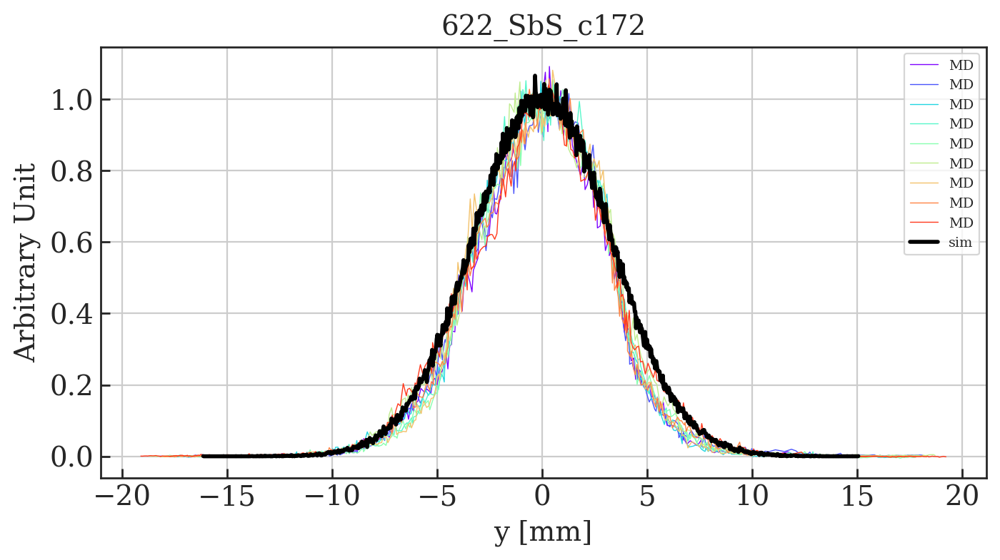

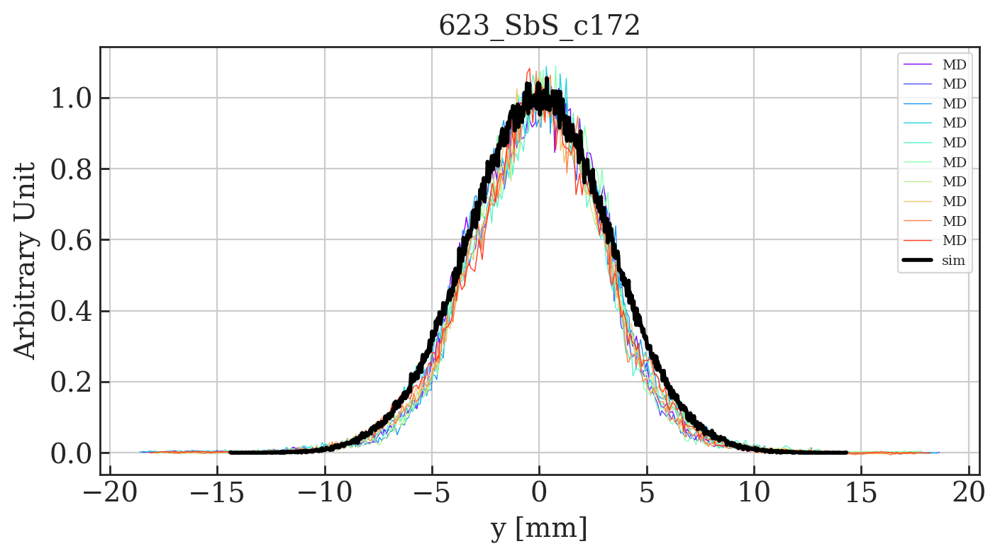

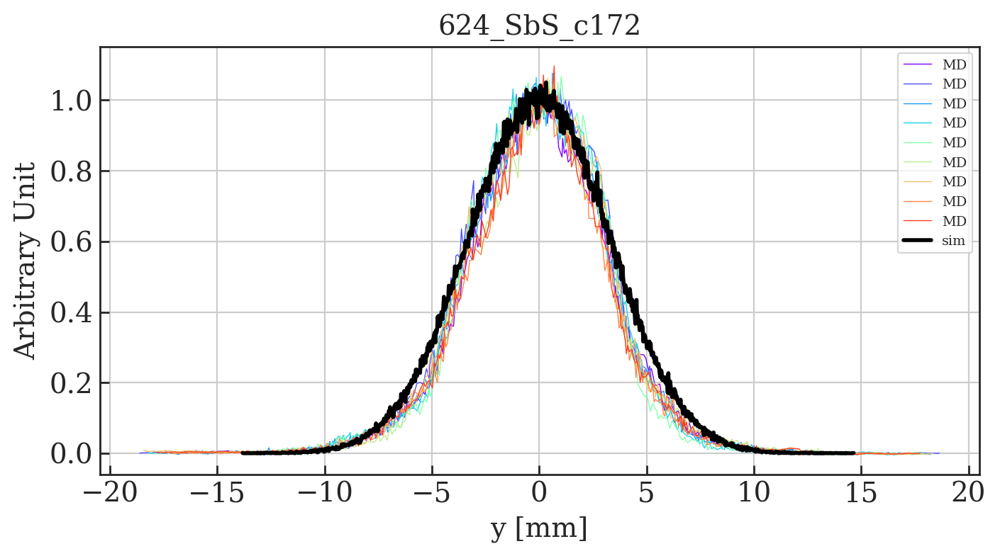

In [71]:
#Main function
verbose = True

for key, value in sorted(sims.iteritems()):
    if verbose: print '\nImporting simulation file:', key
    
    tune_y = float(key.split('_')[0])/100
    ctime = (key.split('_')[2])
    time = float(ctime.split('c')[1])
    if verbose: print 'Qy = ', tune_y, ', ctime =', time, '[ms]'
        
    d = particles_from_matfile(value)
        
    # Find MD data with same tune and ctime
    
    md_points = []
    for i in tune_points[tune_y]:
        if df0['PR.BWS.64.V_ROT:ACQ_DELAY'].iloc()[i] == time:
            md_points.append(i)
            
    if verbose: print md_points
        
    # Plot data
    main_label = key
    Plot_profiles_MD_cf_Sims(d, df0, md_points, main_label)  

In [72]:
def Plot_profiles_cf_sc_models(df, md_points, d1, d2=None, d3=None, main_label = '', bins=1000, sim_labels=None, md_label='MD', plot_md=False):
    fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
    multi = 1/1E-3
    
    if sim_labels is None:
        if d2 is not None:
            sim_labels = ['2.5D','nLK']
        elif d3 is not None:
            sim_labels = ['2.5D','nLK','SbS']            
        else:
            sim_labels = ['2.5D']
    
    plt.clf()
    x1, bins_1, p1 = plt.hist(d1['particles']['y'][0][0][0]*multi, bins = bins, density=True, histtype=u'step', lw=0, color='k')
    
    if d2 is not None:
        plt.clf()
        x2, bins_2, p2 = plt.hist(d2['particles']['y'][0][0][0]*multi, bins = bins, density=True, histtype=u'step', lw=0, color='r')
        
        if d3 is not None:
            plt.clf()
            x3, bins_3, p3 = plt.hist(d3['particles']['y'][0][0][0]*multi, bins = bins, density=True, histtype=u'step', lw=0, color='b')
   
        
    norm1 = 1/peakfinder(np.array(bins_1[:-1]), np.array(x1), verbose=True)
    if d2 is not None: norm2 = 1/peakfinder(np.array(bins_2[:-1]), np.array(x2), verbose=True)
    if d3 is not None: norm3 = 1/peakfinder(np.array(bins_3[:-1]), np.array(x3), verbose=True)
        
    if plot_md:
        for i in md_points:
            # Normalisation so all plots peak at y=1
            multi2 = 1/peakfinder(np.array(df0['position V'].iloc[i]), np.array(df0['profile V'].iloc[i]))
#             multi2 = 1/max(np.array(df0['profile V'].iloc[i]))

            lab = md_label + str(i)
            plt.plot(df0['position V'].iloc[i], np.array(df0['profile V'].iloc[i])*multi2, color=colors[i], label = md_label, lw=0.5)

    bins1 = np.array(bins_1[:-1]) + (abs(bins_1[0]-bins_1[1])/2)
    plt.plot(bins1, x1*norm1, lw=2, color='k', label=sim_labels[0])
    if d2 is not None: 
        bins2 = np.array(bins_2[:-1]) + (abs(bins_2[0]-bins_2[1])/2)
        plt.plot(bins2, x2*norm2, lw=2, color='r', label=sim_labels[1])
    if d3 is not None: 
        bins3 = np.array(bins_3[:-1]) + (abs(bins_3[0]-bins_3[1])/2)
        plt.plot(bins3, x3*norm3, lw=2, color='b', label=sim_labels[2])
    
    
    plt.xlim(-20, 20)
    plt.ylim(-0.05, 1.1)
    
    plt.ylabel('Arbitrary Unit')
    plt.xlabel('y [mm]')
    plt.legend(fontsize='x-small')
    plt.grid();
    plt.title(main_label)
    savename = main_label + '.png'
    fig.savefig(savename);

# Compare SC Models only


Importing simulation file: 610_SbS_c172
Qy =  6.1 , ctime = 172.0 [ms], label =  SbS
[13, 57, 99, 144, 186, 228, 272, 314, 356, 397]

	MAX(y_dat) =  0.06971558331814724
	x_dat[index] =  -0.9698441617733771
	index of x_dat =  -0.9698441617733771  is  471
	Mean of peak point +/- 3 points =  0.06580684350030676

Importing simulation file: 611_SbS_c172
Qy =  6.11 , ctime = 172.0 [ms], label =  SbS
[12, 56, 98, 143, 227, 271, 313, 396]

	MAX(y_dat) =  0.07761966927491563
	index from y_dat peak not within tolerance of 1 mm. 
	try manual search
	index =  0
	index of x_dat =  -18.289595560138082  is  0
	Mean of peak point +/- 3 points =  1.58068769524301e-05
	 using peak value

Importing simulation file: 612_SbS_c172
Qy =  6.12 , ctime = 172.0 [ms], label =  SbS
[55, 142, 185, 226, 270, 312]

	MAX(y_dat) =  0.08328735974665703
	x_dat[index] =  -0.3097148055762986
	index of x_dat =  -0.3097148055762986  is  500
	Mean of peak point +/- 3 points =  0.07818935559660765

Importing simulation file:

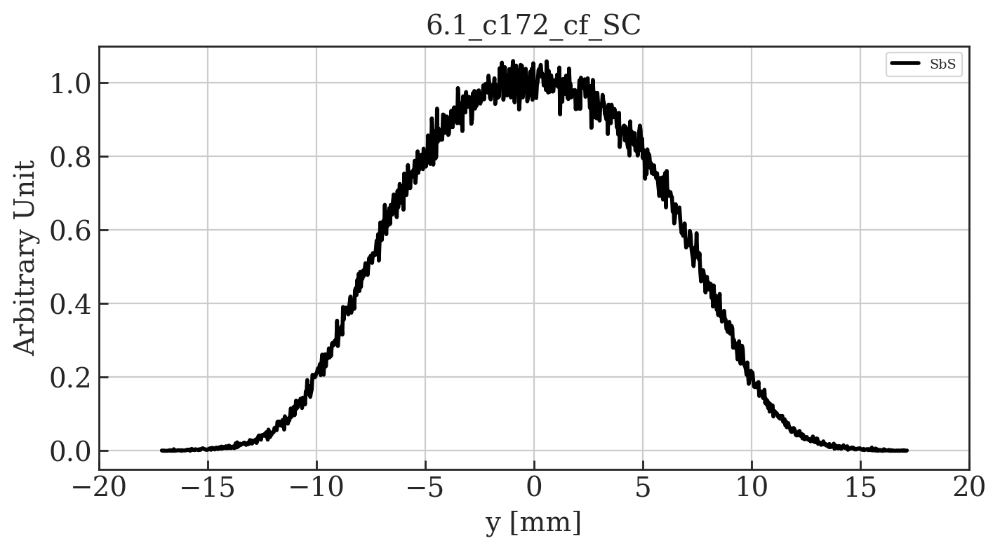

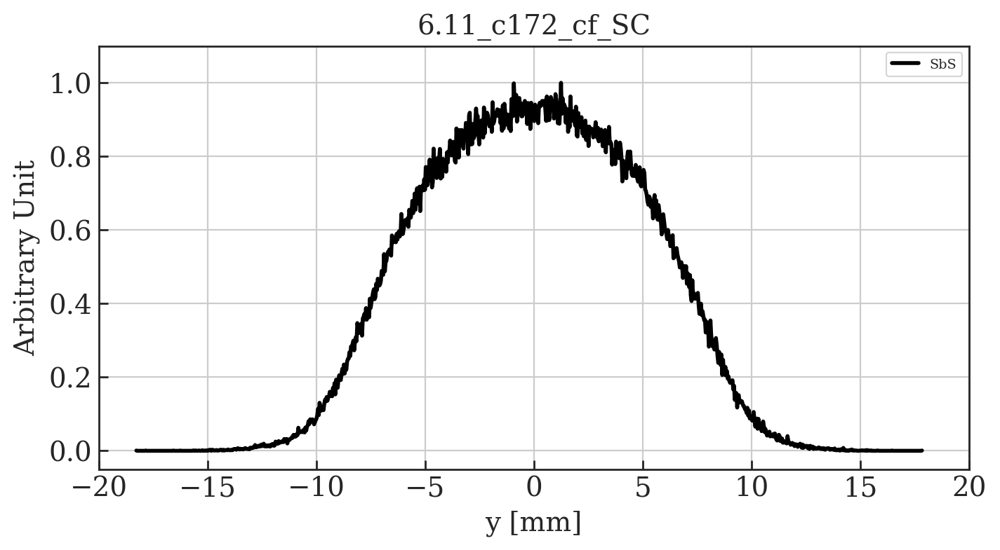

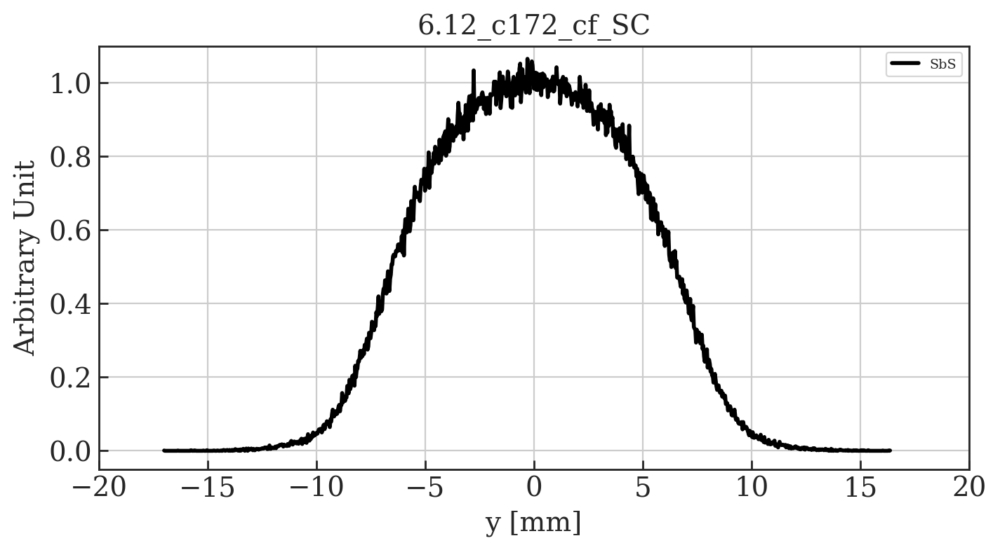

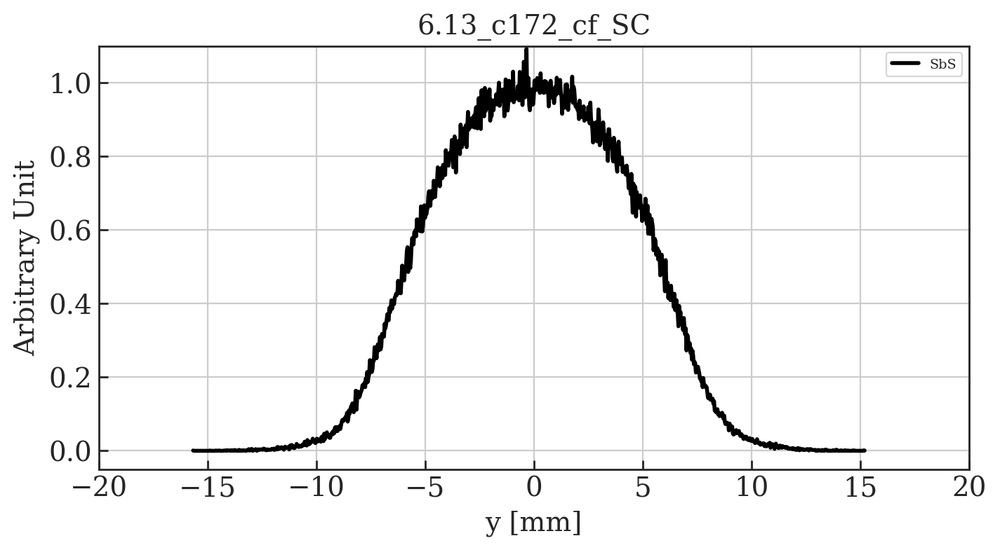

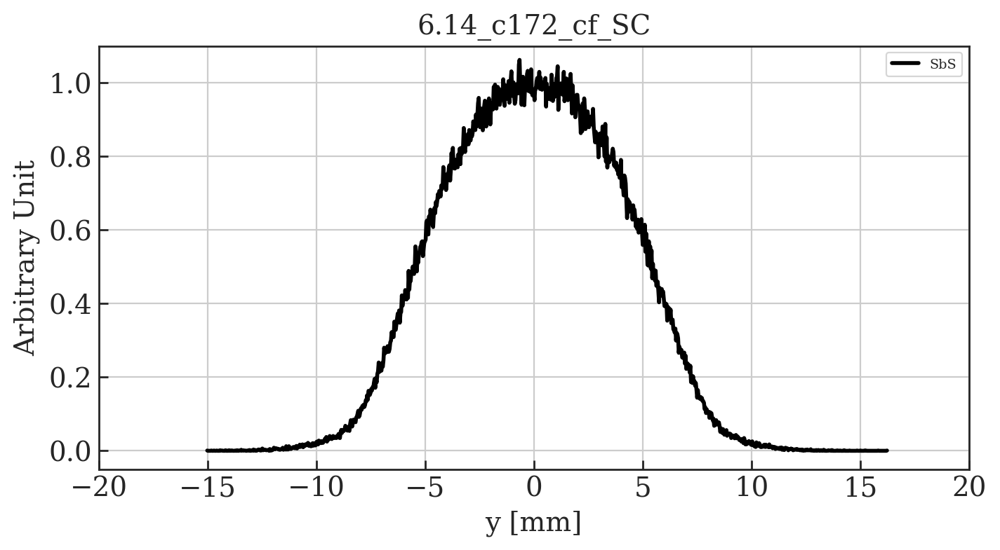

...

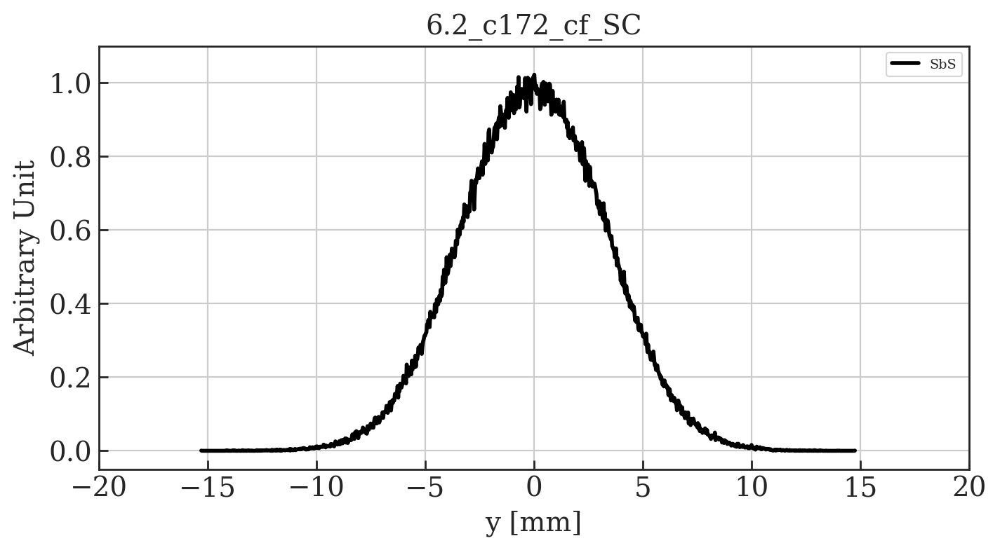

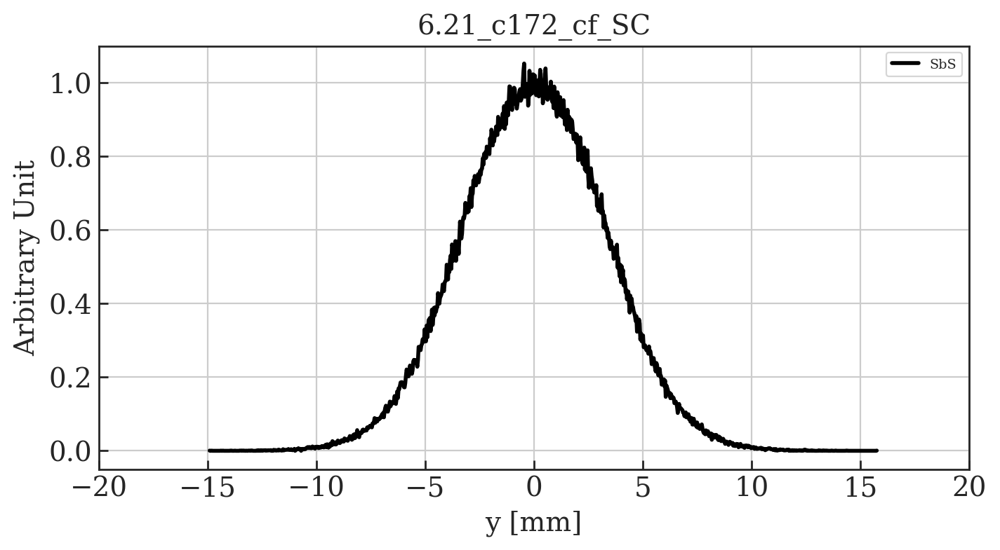

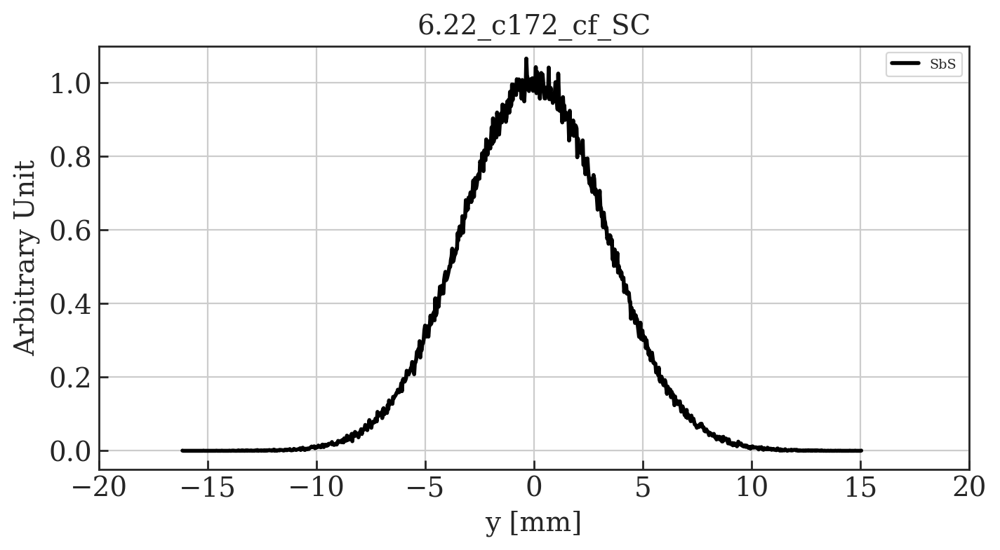

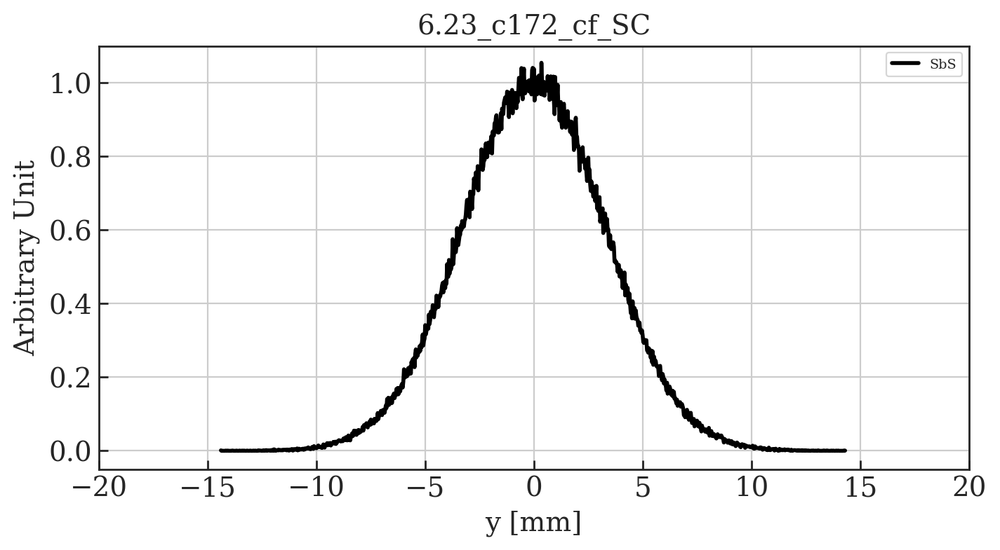

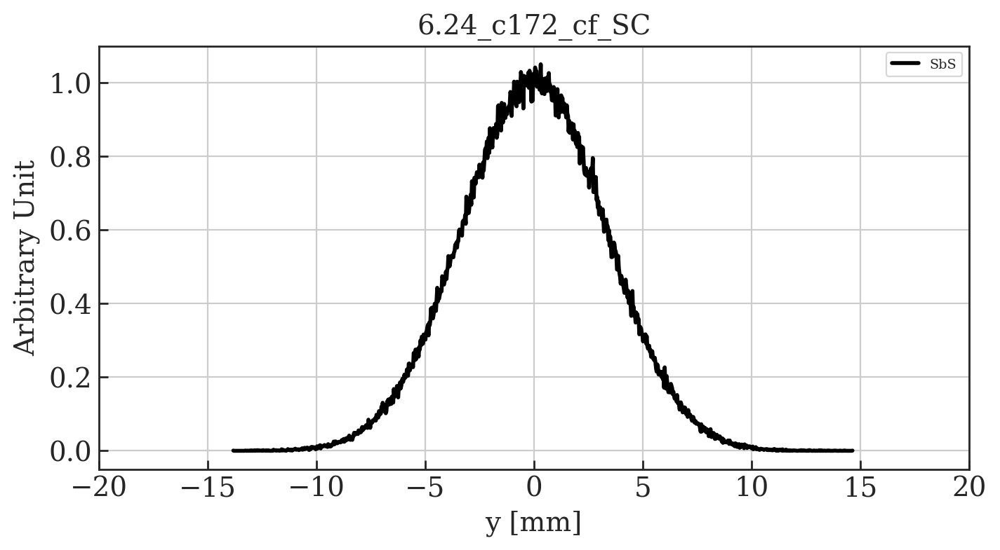

In [73]:
#Main function to plot comparison plots without MD data
verbose = True

plotted_names = []

for key, value in sorted(sims.iteritems()):
    if key not in plotted_names:        
        
        plotted_names.append(key)
        
        this_plot = []
        this_plot.append(value)
        if verbose: print '\nImporting simulation file:', key        

        tune_y = float(key.split('_')[0])/100
        ctime = (key.split('_')[2])
        time = float(ctime.split('c')[1])
        label = (key.split('_')[1])
        if verbose: print 'Qy = ', tune_y, ', ctime =', time, '[ms], label = ', label

        sim_labels=[label]
        
        # Find MD data with same tune and ctime    
        for key1, value1 in sorted(sims.iteritems()):
#             if verbose: print '\tChecking other files:', key1  
            tune_y1 = float(key1.split('_')[0])/100
            ctime1 = (key1.split('_')[2])
            time1 = float(ctime1.split('c')[1])
            label1 = (key1.split('_')[1])
#             if verbose: print '\tQy = ', tune_y1, ', ctime =', time1, '[ms], label = ', label1
            if (tune_y1 == tune_y) and (time1 == time):
                if (label1 != label):
                    print '\tMATCH FOUND' 
                    print '\tQy = ', tune_y1, ', ctime =', time1, '[ms]'
                    print '\tlab = ', label, ', lab1 =', label1

                    this_plot.append(value1)
                    plotted_names.append(key1)
                    sim_labels.append(label1)

        # Find rows in dataframe at correct tune and WS time
        md_points = []
        for i in tune_points[tune_y]:
            if df0['PR.BWS.64.V_ROT:ACQ_DELAY'].iloc()[i] == time:
                md_points.append(i)          

        if verbose: print md_points                 

        # Plot data
        main_label = str(tune_y) + '_' + str(ctime) + '_cf_SC'
        
        if len(this_plot) is 1:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), main_label=main_label, sim_labels=sim_labels, plot_md=False)  
        elif len(this_plot) is 2:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), particles_from_matfile(this_plot[1]), main_label=main_label, sim_labels=sim_labels, plot_md=False)  
        elif len(this_plot) is 3:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), particles_from_matfile(this_plot[1]), particles_from_matfile(this_plot[2]), main_label=main_label, sim_labels=sim_labels, plot_md=False)  
        else: print 'ERROR: More than 3 space charge methods found'
        


# Compare Sims and MD data


Importing simulation file: 610_SbS_c172
Qy =  6.1 , ctime = 172.0 [ms], label =  SbS
[13, 57, 99, 144, 186, 228, 272, 314, 356, 397]

	MAX(y_dat) =  0.06971558331814724
	x_dat[index] =  -0.9698441617733771
	index of x_dat =  -0.9698441617733771  is  471
	Mean of peak point +/- 3 points =  0.06580684350030676

Importing simulation file: 611_SbS_c172
Qy =  6.11 , ctime = 172.0 [ms], label =  SbS
[12, 56, 98, 143, 227, 271, 313, 396]

	MAX(y_dat) =  0.07761966927491563
	index from y_dat peak not within tolerance of 1 mm. 
	try manual search
	index =  0
	index of x_dat =  -18.289595560138082  is  0
	Mean of peak point +/- 3 points =  1.58068769524301e-05
	 using peak value

Importing simulation file: 612_SbS_c172
Qy =  6.12 , ctime = 172.0 [ms], label =  SbS
[55, 142, 185, 226, 270, 312]

	MAX(y_dat) =  0.08328735974665703
	x_dat[index] =  -0.3097148055762986
	index of x_dat =  -0.3097148055762986  is  500
	Mean of peak point +/- 3 points =  0.07818935559660765

Importing simulation file:

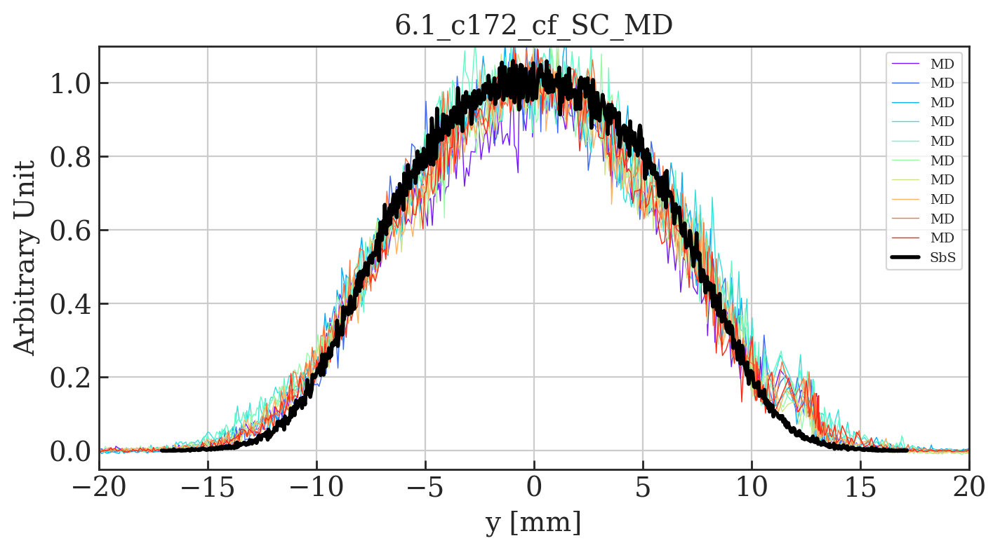

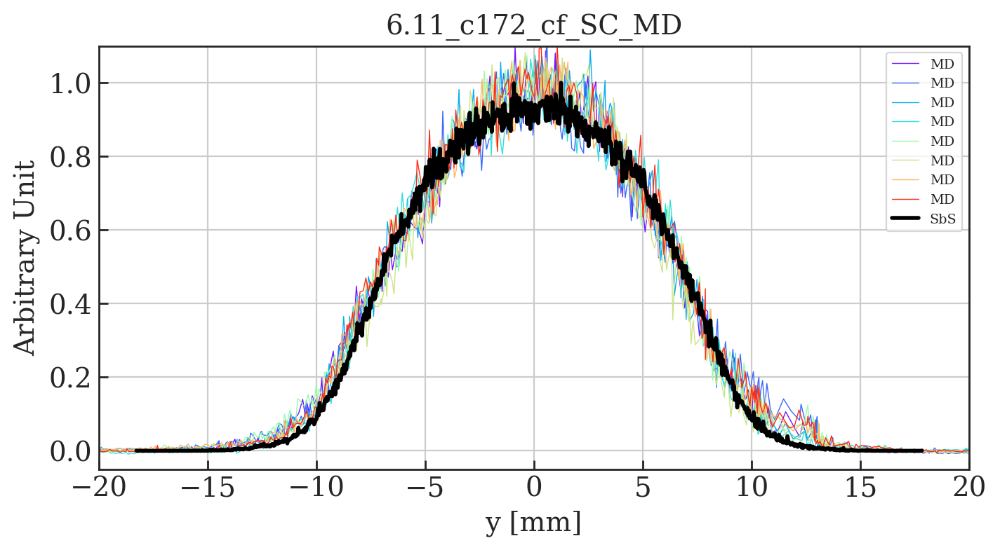

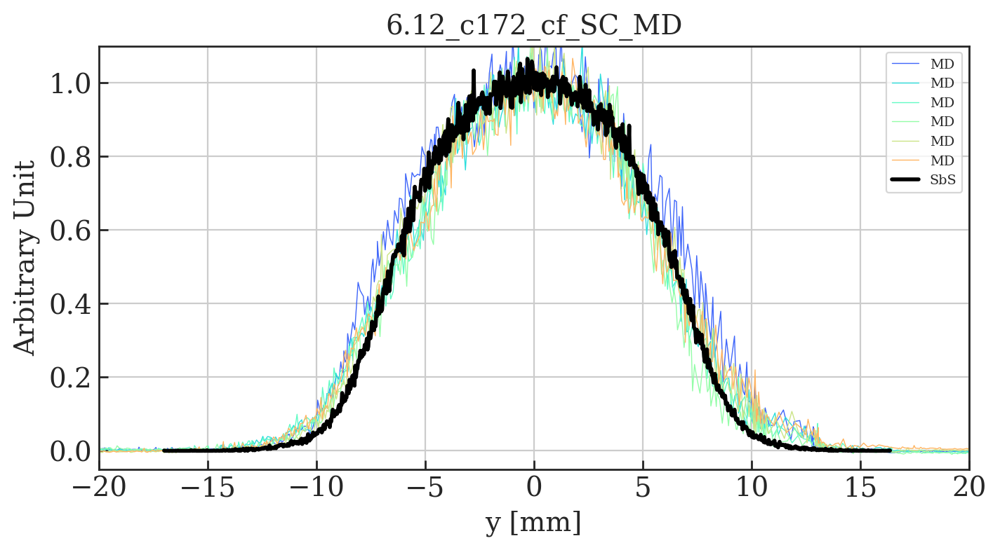

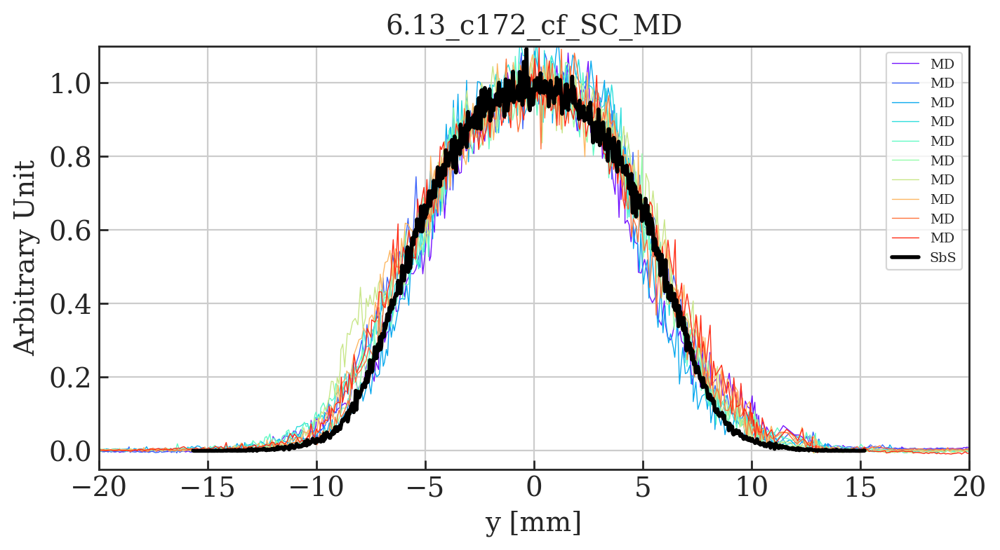

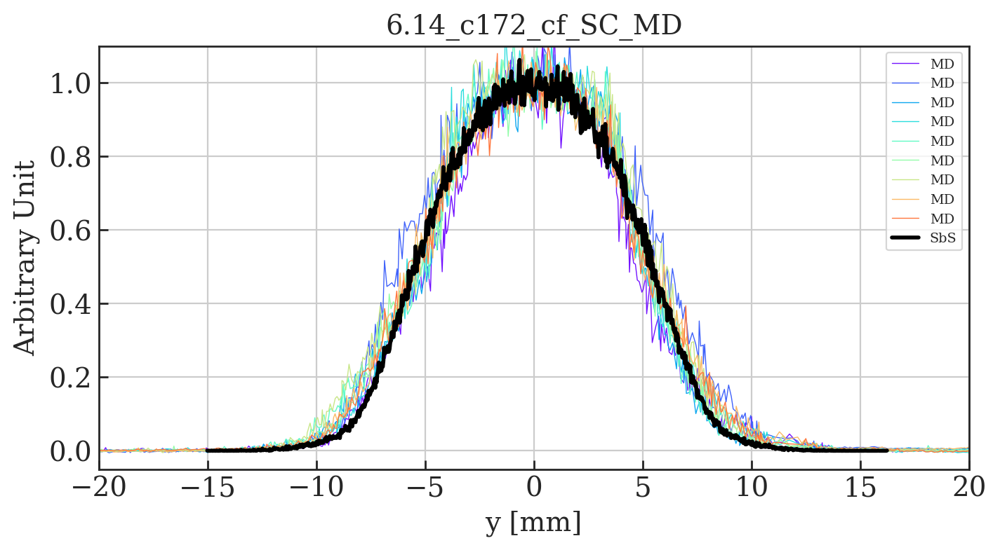

...

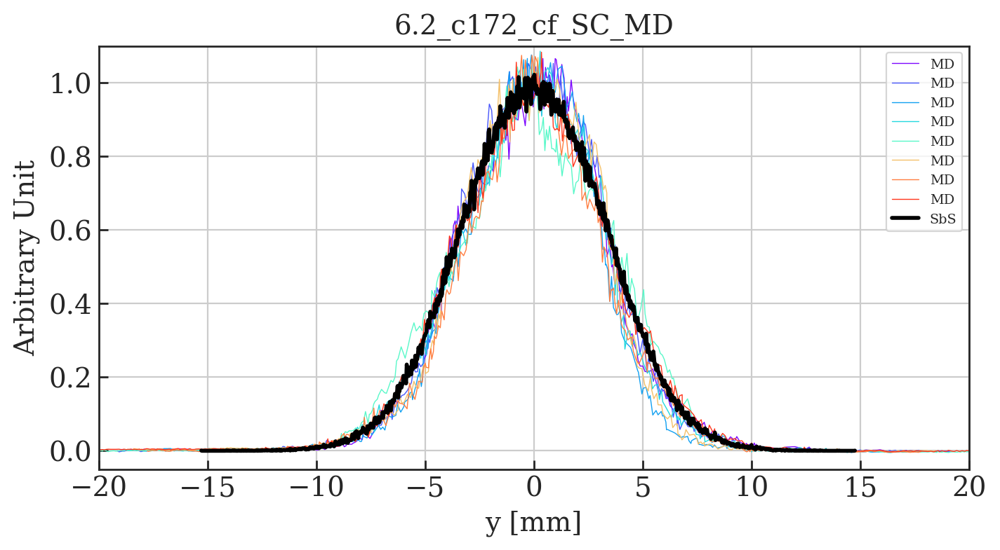

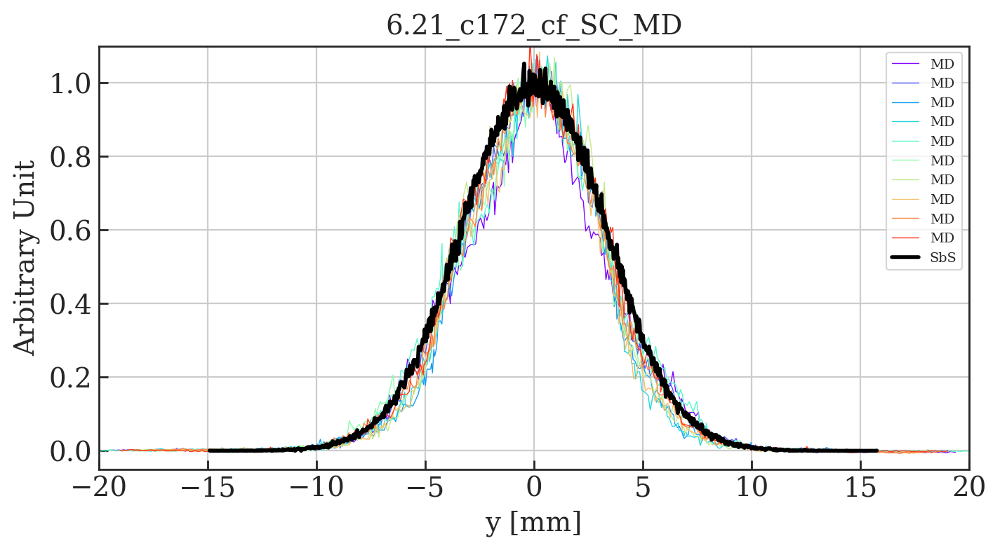

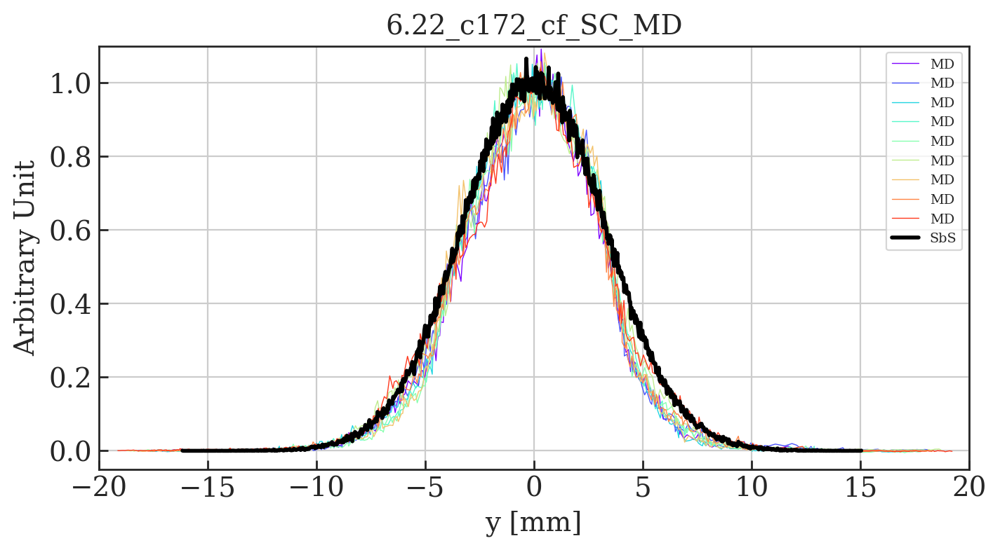

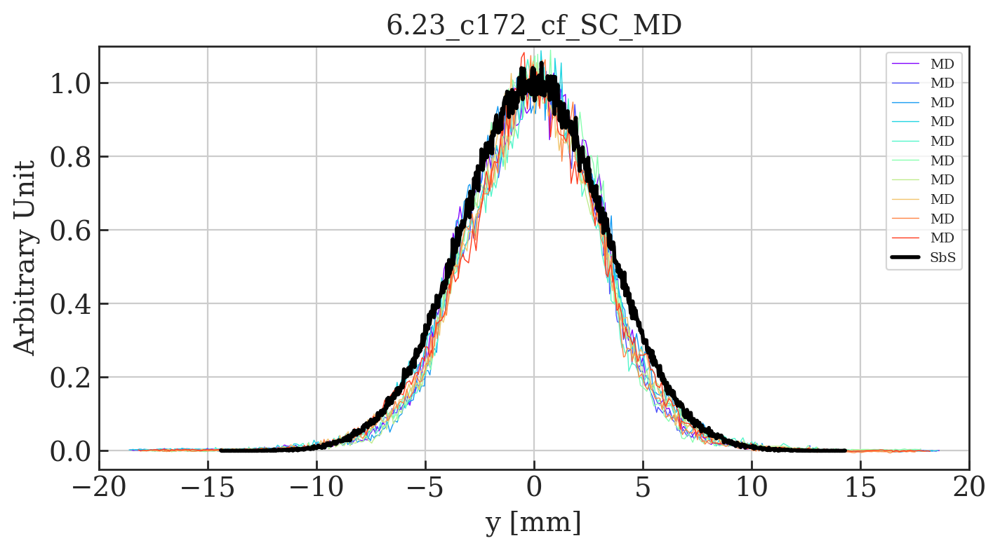

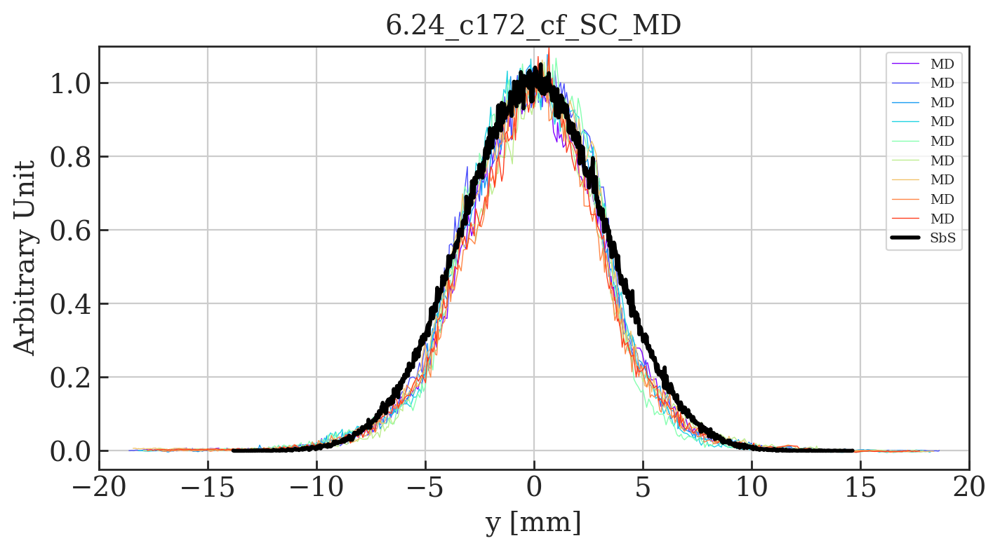

In [74]:
#Main function to plot comparison plots with MD data
verbose = True

plotted_names = []

for key, value in sorted(sims.iteritems()):
    if key not in plotted_names:        
        
        plotted_names.append(key)
        
        this_plot = []
        this_plot.append(value)
        if verbose: print '\nImporting simulation file:', key        

        tune_y = float(key.split('_')[0])/100
        ctime = (key.split('_')[2])
        time = float(ctime.split('c')[1])
        label = (key.split('_')[1])
        if verbose: print 'Qy = ', tune_y, ', ctime =', time, '[ms], label = ', label
        
        sim_labels=[label]

        # Find MD data with same tune and ctime    
        for key1, value1 in sorted(sims.iteritems()):
#             if verbose: print '\tChecking other files:', key1  
            tune_y1 = float(key1.split('_')[0])/100
            ctime1 = (key1.split('_')[2])
            time1 = float(ctime1.split('c')[1])
            label1 = (key1.split('_')[1])
#             if verbose: print '\tQy = ', tune_y1, ', ctime =', time1, '[ms], label = ', label1
            if (tune_y1 == tune_y) and (time1 == time):
                if (label1 != label):
                    print '\tMATCH FOUND' 
                    print '\tQy = ', tune_y1, ', ctime =', time1, '[ms]'
                    print '\tlab = ', label, ', lab1 =', label1

                    this_plot.append(value1)
                    plotted_names.append(key1)
                    sim_labels.append(label1)

        # Find rows in dataframe at correct tune and WS time
        md_points = []
        for i in tune_points[tune_y]:
            if df0['PR.BWS.64.V_ROT:ACQ_DELAY'].iloc()[i] == time:
                md_points.append(i)          

        if verbose: print md_points                 

        # Plot data
        main_label = str(tune_y) + '_' + str(ctime) + '_cf_SC_MD'
        
        if len(this_plot) is 1:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), main_label=main_label, sim_labels=sim_labels, plot_md=True)  
        elif len(this_plot) is 2:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), particles_from_matfile(this_plot[1]), main_label=main_label, sim_labels=sim_labels, plot_md=True)  
        elif len(this_plot) is 3:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), particles_from_matfile(this_plot[1]), particles_from_matfile(this_plot[2]), main_label=main_label, sim_labels=sim_labels, plot_md=True)  
        else: print 'ERROR: More than 3 space charge methods found'
        


# Calculate emittances for simulated bunches

Qy =  6.1 , ctime = 172.0 [ms]
Qy =  6.11 , ctime = 172.0 [ms]
Qy =  6.12 , ctime = 172.0 [ms]
Qy =  6.13 , ctime = 172.0 [ms]
Qy =  6.14 , ctime = 172.0 [ms]
Qy =  6.15 , ctime = 172.0 [ms]
Qy =  6.16 , ctime = 172.0 [ms]
Qy =  6.17 , ctime = 172.0 [ms]
Qy =  6.18 , ctime = 172.0 [ms]
Qy =  6.19 , ctime = 172.0 [ms]
Qy =  6.2 , ctime = 172.0 [ms]
Qy =  6.21 , ctime = 172.0 [ms]
Qy =  6.22 , ctime = 172.0 [ms]
Qy =  6.23 , ctime = 172.0 [ms]
Qy =  6.24 , ctime = 172.0 [ms]


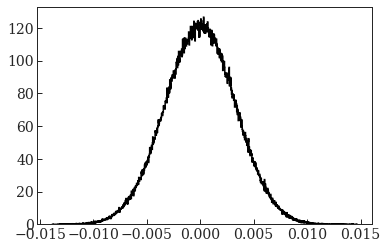

In [75]:
# Make dataframe with name, tunes, position V, profile V 
data = []

# Each row as a list
for key, value in sorted(sims.iteritems()):
    
    tune_y = float(key.split('_')[0])/100
    ctime = (key.split('_')[2])
    time = float(ctime.split('c')[1])
    if verbose: print 'Qy = ', tune_y, ', ctime =', time, '[ms]'

    d = particles_from_matfile(value)
    plt.clf()
    x1, bins_1, p1 = plt.hist(d['particles']['y'][0][0][0], bins = 1000, density=True, histtype=u'step', lw=1.5, color='k')
          
    qx = 6.21
    qy = tune_y
    pos = np.array(bins_1[:-1]) + (abs(bins_1[0]-bins_1[1])/2)
    prof = x1
    
    new_data = [qx, qy, pos, prof]
    
    data.append(new_data)    

# Create dataframe
df_sim = pd.DataFrame(data, columns = ['Qx', 'Qy', 'PR.BWS.64.V_ROT:PROF_POSITION_IN', 'PR.BWS.64.V_ROT:PROF_DATA_IN'])

In [76]:
df_sim

,Qx,Qy,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN
0,6.21,6.10,"[-0.017099595165482453, -0.017065313016696674,...","[0.05833940026622983, 0.0, 0.0, 0.058339400266..."
1,6.21,6.11,"[-0.01827152024478173, -0.01823536961406902, -...","[0.05532406933351312, 0.0, 0.0, 0.0, 0.0, 0.0,..."
2,6.21,6.12,"[-0.016994227368190312, -0.016960824940637532,...","[0.059875887668336895, 0.0, 0.0, 0.0, 0.0, 0.0..."
3,6.21,6.13,"[-0.015662908547876414, -0.015632009032812554,...","[0.06472593488494378, 0.0, 0.0, 0.0, 0.0, 0.0,..."
4,6.21,6.14,"[-0.015013218556770937, -0.014981939500537018,...","[0.0639405481112731, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
5,6.21,6.15,"[-0.015339487167486808, -0.015308849223535547,...","[0.06527853184866131, 0.0, 0.0, 0.0, 0.0, 0.0,..."
6,6.21,6.16,"[-0.014690916913205692, -0.014659924917875789,...","[0.06453279237785262, 0.0, 0.0, 0.0, 0.1290655..."
7,6.21,6.17,"[-0.015195683518371805, -0.015165529668479082,...","[0.0663265223881947, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
8,6.21,6.18,"[-0.016141716562407548, -0.016110813028961692,...","[0.06471751858097662, 0.0, 0.0, 0.0, 0.0, 0.0,..."
9,6.21,6.19,"[-0.017877498753180558, -0.01784486170522946, ...","[0.0612800521357514, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


In [77]:
def Multi_filter_sim(ndf, with_plot = False, WS = '65.H', sig_limit_mm=10, smooth = False):
    
    df = ndf.copy()
    
    position_label = 'PR.BWS.'+WS+'_ROT:PROF_POSITION_IN'
    profile_label = 'PR.BWS.'+WS+'_ROT:PROF_DATA_IN'
    
    window = 40    
    
    # Arrays to hold dataframe data. Appended to dataframe at the end of the loop.
    mu_5 = []
    sigma_5 = []
    A_5 = []
    m_5 = []
    c_5 = []
    sig_err_5 = []
    
    mu_3 = []
    sigma_3 = []
    A_3 = []
    sig_err_3 = []
    
    mom_2nd = []
    
    filtered_profiles = []
    filtered_positions = []
    
    failed_rows = []
    
    new_new_X=[]
    
    # Iterate over dataframe
    for j in range(0, len(df), 1):
        print '\nMulti_filter row ', j
        
# 5 parameter Gaussian fit to find mean and sigma
#------------------------------------------------

        data = []
        # Filter the data (scipy.signal.savgol_filter)
        if smooth: data = filtered(df[profile_label].iloc()[j])    
        else:data = df[profile_label].iloc()[j]
            
        #X = df[position_label].iloc()[j]/1000.
        X = df[position_label].iloc()[j]*1000
        Y = data
        indx_max = np.argmax(Y)
        mu0 = X[indx_max]
        x_tmp = X
        y_tmp = Y
        offs0 = min(y_tmp)
        ampl = max(y_tmp)-offs0
        x1 = x_tmp[np.searchsorted(y_tmp[:window], offs0+ampl/2)]
        x2 = x_tmp[np.searchsorted(-y_tmp[window:], -offs0+ampl/2)]
        FWHM = x2-x1
        sigma0 = np.abs(2*FWHM/2.355)
        #sigma0 = 5
        ampl *= np.sqrt(2*np.pi)*sigma0
        slope = 0
        
        ampl = peakfinder(np.array(bins_[:-1]), np.array(data))
                        
        print '\n\tinitial guess: mu0', mu0
        print '\tinitial guess: offs0', offs0
        print '\tinitial guess: ampl', ampl
        print '\tinitial guess: slope', slope
        print '\tinitial guess: sigma0', sigma0
        
        popt3 = []
        pcov3 = []   
        popt3, pcov3 = curve_fit(gaussian_3_parameters, X, Y, p0 =[ampl, mu0, sigma0])
        result3 = gaussian_3_parameters(X, popt3[0], popt3[1], popt3[2])

        fit_A_3 = popt3[0]
        fit_mean_3 = popt3[1]
        fit_sigma_3 = popt3[2]

        A_3.append(np.array(popt3[0]))
        mu_3.append(np.array(popt3[1]))
        sigma_3.append(np.array(abs(popt3[2])))
        sig_err_3.append(np.sqrt(np.diag(pcov3[2]))[2][2])     

        print '3 parameter fit sigma = ', popt3[2] , ' +/- ', np.sqrt(np.diag(pcov3[2]))[2][2]
                
# 2nd moment
#------------------------------------------------
        # Shift centre
        new_new_X = X - fit_mean_3
        print 'Removing centre shift of ', fit_mean_3
        
        filtered_positions.append(new_new_X)
        filtered_profiles.append(Y)    

        second_mom = second_moment(new_new_X, Y)

        mom_2nd.append(second_mom)

        print 'Second moment = ', second_mom     
        
        # Plot
#------------------------------------------------      
        if with_plot:
            fig, ax1 = plt.subplots(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');

            plt.plot(X, df[profile_label].iloc()[j], label='raw');
            plt.plot(new_new_X, result3, label='3 param fit' );
            plt.plot(new_new_X, Y, label='filtered');

            tit = 'WS profile & fit ' + str(j);
            savename = 'MD4224_HB_Vertical_Multifit_' + str(j);

            plt.title(tit);
            plt.ylabel('Profile [-]');
            plt.xlabel('Position [mm]');
            plt.legend();            
            plt.grid();
            fig.savefig(savename);
            plt.close();
             
    df['2ndMoment '+WS[-1]] = mom_2nd   
    
    df['sig '+WS[-1]] = sigma_3
    df['sig err'+WS[-1]] = sig_err_3
    df['A '+WS[-1]] = A_3
    df['mu '+WS[-1]] = mu_3
    
    df['position '+WS[-1]] = filtered_positions
    df['profile '+WS[-1]] = filtered_profiles
    
    print 'failed rows = ', failed_rows
    
    return df

In [78]:
# Gaussian and 2nd moment fits
df_sim_filtered = Multi_filter_sim(df_sim, with_plot = True, WS = '64.V', smooth=True)


Multi_filter row  0

	initial guess: mu0 0.4528650128364578
	initial guess: offs0 0.015557173404327955
	initial guess: ampl 66.86306445179348
	initial guess: slope 0
	initial guess: sigma0 26.785203297593878
3 parameter fit sigma =  5.817771719574362  +/-  0.022707644030153986
Removing centre shift of  0.0024614978827957566
Second moment =  5.215323650708703


/usr/local/bin/start_ipykernel.py:81: RuntimeWarning: invalid value encountered in sqrt
/usr/local/bin/start_ipykernel.py:83: RuntimeWarning: invalid value encountered in sqrt



Multi_filter row  1

	initial guess: mu0 0.9967659250910335
	initial guess: offs0 0.0
	initial guess: ampl 72.52880110443802
	initial guess: slope 0
	initial guess: sigma0 28.245078773410032
3 parameter fit sigma =  5.317157105708749  +/-  0.023770091289696586
Removing centre shift of  -0.008484167419346563
Second moment =  4.728958649296282

Multi_filter row  2

	initial guess: mu0 -0.0925990264832241
	initial guess: offs0 0.0
	initial guess: ampl 79.28422897111379
	initial guess: slope 0
	initial guess: sigma0 26.097862716397742
3 parameter fit sigma =  4.871800064234429  +/-  0.022075080835211158
Removing centre shift of  -0.005304672495188379
Second moment =  4.341586488506945

Multi_filter row  3

	initial guess: mu0 -0.5530456816475755
	initial guess: offs0 0.0
	initial guess: ampl 85.95604152720901
	initial guess: slope 0
	initial guess: sigma0 24.14229627070373
3 parameter fit sigma =  4.503954969346823  +/-  0.01851619147224999
Removing centre shift of  -0.002954810464098613


In [79]:
df_sim_filtered

,Qx,Qy,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,2ndMoment V,sig V,sig errV,A V,mu V,position V,profile V
0,6.21,6.10,"[-0.017099595165482453, -0.017065313016696674,...","[0.05833940026622983, 0.0, 0.0, 0.058339400266...",5.215324,5.817771719574362,0.022708,1031.1901508617536,0.0024614978827957566,"[-17.102056663365246, -17.06777451457947, -17....","[0.015557173404327955, 0.01722401341193452, 0...."
1,6.21,6.11,"[-0.01827152024478173, -0.01823536961406902, -...","[0.05532406933351312, 0.0, 0.0, 0.0, 0.0, 0.0,...",4.728959,5.317157105708749,0.023770,1033.5334751606251,-0.008484167419346563,"[-18.263036077362383, -18.22688544664967, -18....","[0.010142746044477714, 0.009747574120666812, 0..."
2,6.21,6.12,"[-0.016994227368190312, -0.016960824940637532,...","[0.059875887668336895, 0.0, 0.0, 0.0, 0.0, 0.0...",4.341586,4.871800064234429,0.022075,1033.1902449038778,-0.005304672495188379,"[-16.988922695695123, -16.955520268142344, -16...","[0.01447000618651475, 0.012973108994806328, 0...."
3,6.21,6.13,"[-0.015662908547876414, -0.015632009032812554,...","[0.06472593488494378, 0.0, 0.0, 0.0, 0.0, 0.0,...",4.049346,4.503954969346823,0.018516,1030.689877786509,-0.002954810464098613,"[-15.659953737412316, -15.629054222348454, -15...","[0.015642100930528077, 0.014023952558404483, 0..."
4,6.21,6.14,"[-0.015013218556770937, -0.014981939500537018,...","[0.0639405481112731, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3.823036,4.197300248142817,0.014832,1027.043332681334,-0.00014446228543845067,"[-15.013074094485498, -14.98179503825158, -14....","[0.013853785424109494, 0.01431050362490429, 0...."
5,6.21,6.15,"[-0.015339487167486808, -0.015308849223535547,...","[0.06527853184866131, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.616009,3.8668447923046614,0.008720,1019.2209283176079,-0.006432648342715943,"[-15.333054519144092, -15.302416575192831, -15...","[0.013599694135137773, 0.012900281293902116, 0..."
6,6.21,6.16,"[-0.014690916913205692, -0.014659924917875789,...","[0.06453279237785262, 0.0, 0.0, 0.0, 0.1290655...",3.481673,3.6692675225423033,0.006664,1015.1683955013541,-0.008098233943090683,"[-14.682818679262601, -14.651826683932697, -14...","[0.033879715998372625, 0.030883550637972327, 0..."
7,6.21,6.17,"[-0.015195683518371805, -0.015165529668479082,...","[0.0663265223881947, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3.388368,3.5255233539563897,0.004980,1011.5435064843596,0.005052968782141422,"[-15.200736487153947, -15.170582637261223, -15...","[0.01602890957714705, 0.014370746517442183, 0...."
8,6.21,6.18,"[-0.016141716562407548, -0.016110813028961692,...","[0.06471751858097662, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.329247,3.4323066095590216,0.004038,1009.0333776628489,0.0031441082665079998,"[-16.144860670674056, -16.1139571372282, -16.0...","[0.015640066990402678, 0.014022129025878263, 0..."
9,6.21,6.19,"[-0.017877498753180558, -0.01784486170522946, ...","[0.0612800521357514, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3.290178,3.3616323367877086,0.002929,1006.4682009566075,-0.005528289471227284,"[-17.87197046370933, -17.839333415758237, -17....","[0.014809345932806592, 0.013277344629412807, 0..."


# Calculate Emittance for simulated bunches

In [80]:
# Calculate emittances in Vertical
df_sim_emittance = emittance_df(df_sim_filtered, WS='64.V', verbose=True)

Emittance  0  =  2.6591350515406837
Emittance  1  =  2.289485653927617
Emittance  2  =  1.9706294478313873
Emittance  3  =  1.7261793461006802
Emittance  4  =  1.533880776671554
Emittance  5  =  1.3264594948488926
Emittance  6  =  1.2173643028142787
Emittance  7  =  1.1441304372556733
Emittance  8  =  1.1021650398756848
Emittance  9  =  1.0721949560572832
Emittance  10  =  1.047489201686155
Emittance  11  =  1.041836574311696
Emittance  12  =  1.049605801169192
Emittance  13  =  1.0685357022704527
Emittance  14  =  1.0823007251894199


In [81]:
df_sim_emittance

,Qx,Qy,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,2ndMoment V,sig V,sig errV,A V,mu V,position V,profile V,emittance V,betx,bety,dx
0,6.21,6.10,"[-0.017099595165482453, -0.017065313016696674,...","[0.05833940026622983, 0.0, 0.0, 0.058339400266...",5.215324,5.817771719574362,0.022708,1031.1901508617536,0.0024614978827957566,"[-17.102056663365246, -17.06777451457947, -17....","[0.015557173404327955, 0.01722401341193452, 0....",2.659135,11.497769,28.759416,2.723260
1,6.21,6.11,"[-0.01827152024478173, -0.01823536961406902, -...","[0.05532406933351312, 0.0, 0.0, 0.0, 0.0, 0.0,...",4.728959,5.317157105708749,0.023770,1033.5334751606251,-0.008484167419346563,"[-18.263036077362383, -18.22688544664967, -18....","[0.010142746044477714, 0.009747574120666812, 0...",2.289486,11.561220,27.901540,2.711618
2,6.21,6.12,"[-0.016994227368190312, -0.016960824940637532,...","[0.059875887668336895, 0.0, 0.0, 0.0, 0.0, 0.0...",4.341586,4.871800064234429,0.022075,1033.1902449038778,-0.005304672495188379,"[-16.988922695695123, -16.955520268142344, -16...","[0.01447000618651475, 0.012973108994806328, 0....",1.970629,11.621678,27.213290,2.699578
3,6.21,6.13,"[-0.015662908547876414, -0.015632009032812554,...","[0.06472593488494378, 0.0, 0.0, 0.0, 0.0, 0.0,...",4.049346,4.503954969346823,0.018516,1030.689877786509,-0.002954810464098613,"[-15.659953737412316, -15.629054222348454, -15...","[0.015642100930528077, 0.014023952558404483, 0...",1.726179,11.686152,26.552736,2.686666
4,6.21,6.14,"[-0.015013218556770937, -0.014981939500537018,...","[0.0639405481112731, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3.823036,4.197300248142817,0.014832,1027.043332681334,-0.00014446228543845067,"[-15.013074094485498, -14.98179503825158, -14....","[0.013853785424109494, 0.01431050362490429, 0....",1.533881,11.752091,25.951089,2.673333
5,6.21,6.15,"[-0.015339487167486808, -0.015308849223535547,...","[0.06527853184866131, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.616009,3.8668447923046614,0.008720,1019.2209283176079,-0.006432648342715943,"[-15.333054519144092, -15.302416575192831, -15...","[0.013599694135137773, 0.012900281293902116, 0...",1.326459,11.815070,25.469862,2.660010
6,6.21,6.16,"[-0.014690916913205692, -0.014659924917875789,...","[0.06453279237785262, 0.0, 0.0, 0.0, 0.1290655...",3.481673,3.6692675225423033,0.006664,1015.1683955013541,-0.008098233943090683,"[-14.682818679262601, -14.651826683932697, -14...","[0.033879715998372625, 0.030883550637972327, 0...",1.217364,11.881711,24.988794,2.645587
7,6.21,6.17,"[-0.015195683518371805, -0.015165529668479082,...","[0.0663265223881947, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3.388368,3.5255233539563897,0.004980,1011.5435064843596,0.005052968782141422,"[-15.200736487153947, -15.170582637261223, -15...","[0.01602890957714705, 0.014370746517442183, 0....",1.144130,11.949974,24.545889,2.630616
8,6.21,6.18,"[-0.016141716562407548, -0.016110813028961692,...","[0.06471751858097662, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.329247,3.4323066095590216,0.004038,1009.0333776628489,0.0031441082665079998,"[-16.144860670674056, -16.1139571372282, -16.0...","[0.015640066990402678, 0.014022129025878263, 0...",1.102165,12.019244,24.150862,2.615310
9,6.21,6.19,"[-0.017877498753180558, -0.01784486170522946, ...","[0.0612800521357514, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3.290178,3.3616323367877086,0.002929,1006.4682009566075,-0.005528289471227284,"[-17.87197046370933, -17.839333415758237, -17....","[0.014809345932806592, 0.013277344629412807, 0...",1.072195,12.088000,23.814078,2.599778


In [82]:
df_sim_emittance_2 = emittance_df_2(df_sim_emittance, WS='65.H', verbose=True)

Emittance  0  =  2.6591350515406837
Emittance  1  =  2.289485653927617
Emittance  2  =  1.9706294478313873
Emittance  3  =  1.7261793461006802
Emittance  4  =  1.533880776671554
Emittance  5  =  1.3264594948488926
Emittance  6  =  1.2173643028142787
Emittance  7  =  1.1441304372556733
Emittance  8  =  1.1021650398756848
Emittance  9  =  1.0721949560572832
Emittance  10  =  1.047489201686155
Emittance  11  =  1.041836574311696
Emittance  12  =  1.049605801169192
Emittance  13  =  1.0685357022704527
Emittance  14  =  1.0823007251894199


# Calculate Emittance using 2nd moment for simulated bunches

In [83]:
df_sim_emittance_2

,Qx,Qy,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,2ndMoment V,sig V,sig errV,A V,mu V,position V,profile V,emittance V,betx,bety,dx,emittance V 2ndMoment
0,6.21,6.10,"[-0.017099595165482453, -0.017065313016696674,...","[0.05833940026622983, 0.0, 0.0, 0.058339400266...",5.215324,5.817771719574362,0.022708,1031.1901508617536,0.0024614978827957566,"[-17.102056663365246, -17.06777451457947, -17....","[0.015557173404327955, 0.01722401341193452, 0....",2.659135,11.497769,28.759416,2.723260,2.136926
1,6.21,6.11,"[-0.01827152024478173, -0.01823536961406902, -...","[0.05532406933351312, 0.0, 0.0, 0.0, 0.0, 0.0,...",4.728959,5.317157105708749,0.023770,1033.5334751606251,-0.008484167419346563,"[-18.263036077362383, -18.22688544664967, -18....","[0.010142746044477714, 0.009747574120666812, 0...",2.289486,11.561220,27.901540,2.711618,1.810965
2,6.21,6.12,"[-0.016994227368190312, -0.016960824940637532,...","[0.059875887668336895, 0.0, 0.0, 0.0, 0.0, 0.0...",4.341586,4.871800064234429,0.022075,1033.1902449038778,-0.005304672495188379,"[-16.988922695695123, -16.955520268142344, -16...","[0.01447000618651475, 0.012973108994806328, 0....",1.970629,11.621678,27.213290,2.699578,1.565031
3,6.21,6.13,"[-0.015662908547876414, -0.015632009032812554,...","[0.06472593488494378, 0.0, 0.0, 0.0, 0.0, 0.0,...",4.049346,4.503954969346823,0.018516,1030.689877786509,-0.002954810464098613,"[-15.659953737412316, -15.629054222348454, -15...","[0.015642100930528077, 0.014023952558404483, 0...",1.726179,11.686152,26.552736,2.686666,1.395300
4,6.21,6.14,"[-0.015013218556770937, -0.014981939500537018,...","[0.0639405481112731, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3.823036,4.197300248142817,0.014832,1027.043332681334,-0.00014446228543845067,"[-15.013074094485498, -14.98179503825158, -14....","[0.013853785424109494, 0.01431050362490429, 0....",1.533881,11.752091,25.951089,2.673333,1.272531
5,6.21,6.15,"[-0.015339487167486808, -0.015308849223535547,...","[0.06527853184866131, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.616009,3.8668447923046614,0.008720,1019.2209283176079,-0.006432648342715943,"[-15.333054519144092, -15.302416575192831, -15...","[0.013599694135137773, 0.012900281293902116, 0...",1.326459,11.815070,25.469862,2.660010,1.159950
6,6.21,6.16,"[-0.014690916913205692, -0.014659924917875789,...","[0.06453279237785262, 0.0, 0.0, 0.0, 0.1290655...",3.481673,3.6692675225423033,0.006664,1015.1683955013541,-0.008098233943090683,"[-14.682818679262601, -14.651826683932697, -14...","[0.033879715998372625, 0.030883550637972327, 0...",1.217364,11.881711,24.988794,2.645587,1.096069
7,6.21,6.17,"[-0.015195683518371805, -0.015165529668479082,...","[0.0663265223881947, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3.388368,3.5255233539563897,0.004980,1011.5435064843596,0.005052968782141422,"[-15.200736487153947, -15.170582637261223, -15...","[0.01602890957714705, 0.014370746517442183, 0....",1.144130,11.949974,24.545889,2.630616,1.056841
8,6.21,6.18,"[-0.016141716562407548, -0.016110813028961692,...","[0.06471751858097662, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.329247,3.4323066095590216,0.004038,1009.0333776628489,0.0031441082665079998,"[-16.144860670674056, -16.1139571372282, -16.0...","[0.015640066990402678, 0.014022129025878263, 0...",1.102165,12.019244,24.150862,2.615310,1.036971
9,6.21,6.19,"[-0.017877498753180558, -0.01784486170522946, ...","[0.0612800521357514, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3.290178,3.3616323367877086,0.002929,1006.4682009566075,-0.005528289471227284,"[-17.87197046370933, -17.839333415758237, -17....","[0.014809345932806592, 0.013277344629412807, 0...",1.072195,12.088000,23.814078,2.599778,1.027099


# Save simulation dataframe to pickle file

In [84]:
df_sim_emittance_2.to_pickle('MD4224_HighBrightness_Vertical_Using_Sim_Optics_Complete_simulation_data')

In [85]:
df0_sim = pnd.read_pickle('MD4224_HighBrightness_Vertical_Using_Sim_Optics_Complete_simulation_data')

# Plots

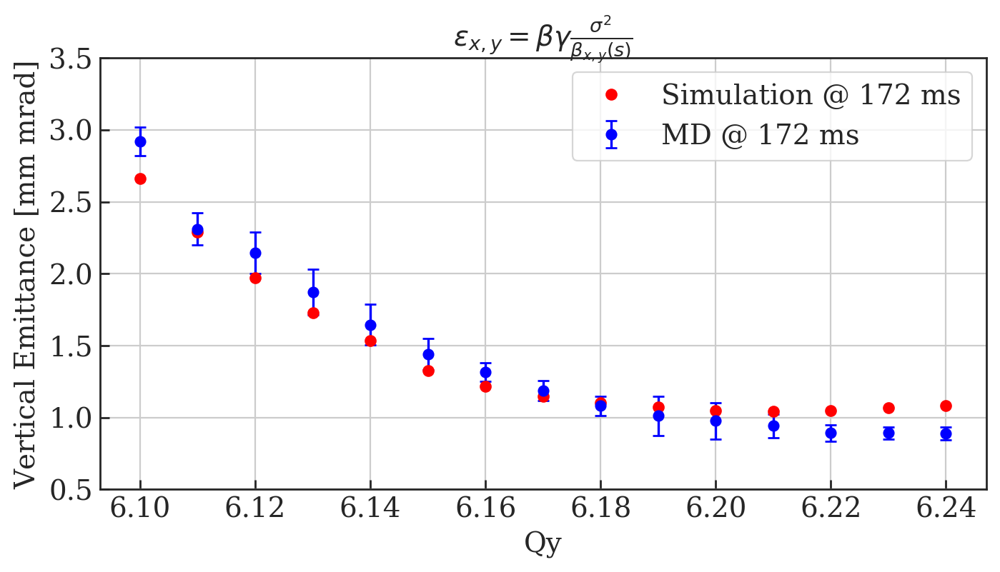

In [86]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_error_172 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_172.append( np.std( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
plt.errorbar(x_data, y_data_172, y_error_172, label='MD @ 172 ms', linestyle='None', marker='o', capsize=3, color='b')

plt.plot(df0_sim['Qy'], df0_sim['emittance V'], label='Simulation @ 172 ms', linestyle='None', marker='o', color='r', markersize=5)

plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');

plt.title(r'$\epsilon_{x,y} = \beta\gamma \frac{\sigma^2}{\beta_{x,y}(s)}$')

plt.ylim(0.5, 3.5)

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Emittance_Errors_Using_Sim_Optics_Sim_172.png');

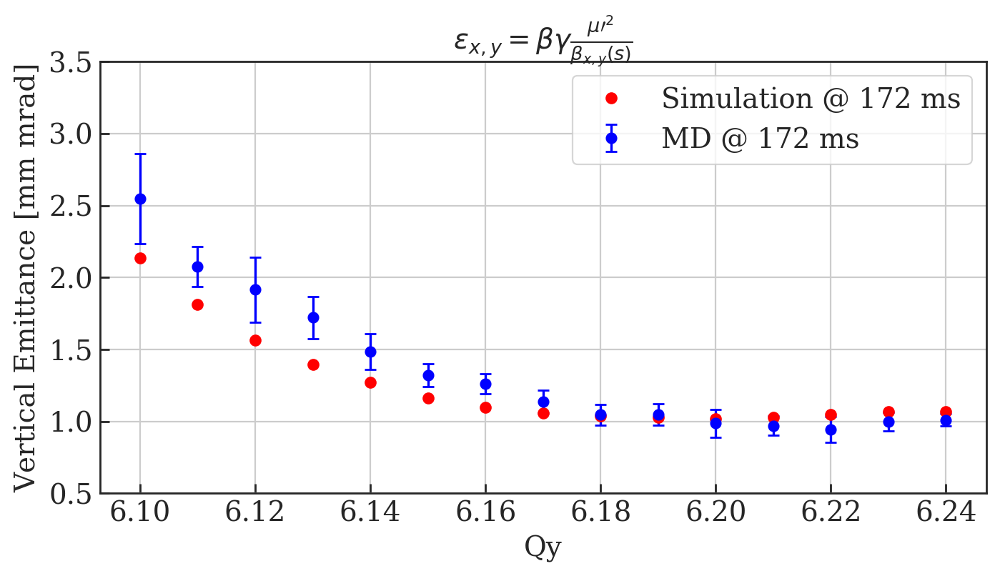

In [87]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_error_172 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_172.append( np.std( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
plt.errorbar(x_data, y_data_172, y_error_172, label='MD @ 172 ms', linestyle='None', marker='o', capsize=3, color='b')

plt.plot(df0_sim['Qy'], df0_sim['emittance V 2ndMoment'], label='Simulation @ 172 ms', linestyle='None', marker='o', color='r', markersize=5)

plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');

plt.title(r'$\epsilon_{x,y} = \beta\gamma \frac{\mu\prime^2}{\beta_{x,y}(s)}$')

plt.ylim(0.5, 3.5)

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Emittance_2nd_Errors_Using_Sim_Optics_Sim_172.png');

# Core Fit

In [88]:
df0

,PR.BWS.64.V_ROT:ACQ_DELAY,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,cycleStamp,2ndMoment V,sig V,sig errV,A V,mu V,position V,...,Qx,Qy,intensity,losses,ratio,emittance V,betx,bety,dx,emittance V 2ndMoment
2018-09-05 10:20:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.17229545882224, 0.17229545882224, 0.1735024...",1.536143e+09,3.281589,2.9994494508823175,0.011036,4.674117219845751,1.194792438636508,"[17.99320756136349, 17.913207561363492, 17.750...",...,0.208899,0.239078,7.548161e+11,1.698342,0.983017,0.892504,12.411288,22.776124,2.521881,1.068306
2018-09-05 10:21:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173300683154985, 0.17289...",1.536143e+09,3.203431,3.1059290861276785,0.017218,4.735926944681591,1.0613386155296278,"[18.633661384470372, 18.52566138447037, 18.498...",...,0.208694,0.229331,7.327544e+11,2.203742,0.977963,0.951445,12.347425,22.909011,2.537551,1.012119
2018-09-05 10:21:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173704413116415, 0.17471...",1.536143e+09,3.013625,2.877569760386751,0.013372,4.210207115773017,1.1427805475505157,"[17.169219452449486, 17.089219452449484, 16.95...",...,0.208412,0.219715,6.951734e+11,2.985061,0.970149,0.810871,12.284674,23.073146,2.552849,0.889362
2018-09-05 10:22:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172095114732879, 0.17129606525681, 0.171096...",1.536143e+09,3.192118,3.240216833707556,0.019804,4.449373960361013,1.0897481518960797,"[19.37725184810392, 19.26125184810392, 19.1432...",...,0.208581,0.209510,7.361018e+11,3.982576,0.960174,1.018467,12.218438,23.292082,2.569060,0.988454
2018-09-05 10:22:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173099170197014, 0.17330...",1.536143e+09,3.275086,3.180944840805123,0.017962,4.441083033668285,0.9197659734003868,"[19.080234026599612, 18.99523402659961, 18.911...",...,0.208356,0.199719,7.079539e+11,2.690493,0.973095,0.971323,12.153815,23.537250,2.584562,1.029667
2018-09-05 10:23:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.174311772273524, 0.17350...",1.536143e+09,3.432943,3.300061990218307,0.014947,4.565909315671348,0.9676094983024153,"[19.781390501697583, 19.699390501697586, 19.61...",...,0.208183,0.189839,7.265163e+11,1.429472,0.985705,1.033064,12.086896,23.819028,2.600027,1.117934
2018-09-05 10:24:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.174109083627406, 0.173502430703752, 0.17451...",1.536143e+09,3.393933,3.319619663513618,0.015588,4.512798604860301,1.06952690260444,"[19.88347309739556, 19.80947309739556, 19.7584...",...,0.208225,0.179881,7.214954e+11,0.909661,0.990903,1.030796,12.018420,24.155232,2.615492,1.077463
2018-09-05 10:24:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172095114732879, 0.171695125159864, 0.17209...",1.536143e+09,3.413773,3.4922039286292734,0.019307,4.490249394766745,1.1695269372034072,"[20.91047306279659, 20.68447306279659, 20.5274...",...,0.208439,0.170431,7.035416e+11,1.409083,0.985909,1.123431,11.952957,24.527882,2.629957,1.073535
2018-09-05 10:25:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173502430703752, 0.173300683154985, 0.17492...",1.536143e+09,3.655397,3.5763442350211503,0.018213,4.275558516238426,0.8637397442678284,"[21.43426025573217, 21.25826025573217, 21.1752...",...,0.208975,0.160332,7.135835e+11,1.263647,0.987364,1.157208,11.883979,24.973197,2.645090,1.208932
2018-09-05 10:25:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.174109083627406, 0.173502430703752, 0.17350...",1.536143e+09,3.603658,3.7317135567106865,0.017619,4.170178518144004,0.6838646886356207,"[22.31613531136438, 22.17913531136438, 21.9911...",...,0.208829,0.150752,7.117577e+11,1.797561,0.982024,1.237099,11.820084,25.434261,2.658925,1.153653


In [89]:
df0_sim

,Qx,Qy,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,2ndMoment V,sig V,sig errV,A V,mu V,position V,profile V,emittance V,betx,bety,dx,emittance V 2ndMoment
0,6.21,6.10,"[-0.017099595165482453, -0.017065313016696674,...","[0.05833940026622983, 0.0, 0.0, 0.058339400266...",5.215324,5.817771719574362,0.022708,1031.1901508617536,0.0024614978827957566,"[-17.102056663365246, -17.06777451457947, -17....","[0.015557173404327955, 0.01722401341193452, 0....",2.659135,11.497769,28.759416,2.723260,2.136926
1,6.21,6.11,"[-0.01827152024478173, -0.01823536961406902, -...","[0.05532406933351312, 0.0, 0.0, 0.0, 0.0, 0.0,...",4.728959,5.317157105708749,0.023770,1033.5334751606251,-0.008484167419346563,"[-18.263036077362383, -18.22688544664967, -18....","[0.010142746044477714, 0.009747574120666812, 0...",2.289486,11.561220,27.901540,2.711618,1.810965
2,6.21,6.12,"[-0.016994227368190312, -0.016960824940637532,...","[0.059875887668336895, 0.0, 0.0, 0.0, 0.0, 0.0...",4.341586,4.871800064234429,0.022075,1033.1902449038778,-0.005304672495188379,"[-16.988922695695123, -16.955520268142344, -16...","[0.01447000618651475, 0.012973108994806328, 0....",1.970629,11.621678,27.213290,2.699578,1.565031
3,6.21,6.13,"[-0.015662908547876414, -0.015632009032812554,...","[0.06472593488494378, 0.0, 0.0, 0.0, 0.0, 0.0,...",4.049346,4.503954969346823,0.018516,1030.689877786509,-0.002954810464098613,"[-15.659953737412316, -15.629054222348454, -15...","[0.015642100930528077, 0.014023952558404483, 0...",1.726179,11.686152,26.552736,2.686666,1.395300
4,6.21,6.14,"[-0.015013218556770937, -0.014981939500537018,...","[0.0639405481112731, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3.823036,4.197300248142817,0.014832,1027.043332681334,-0.00014446228543845067,"[-15.013074094485498, -14.98179503825158, -14....","[0.013853785424109494, 0.01431050362490429, 0....",1.533881,11.752091,25.951089,2.673333,1.272531
5,6.21,6.15,"[-0.015339487167486808, -0.015308849223535547,...","[0.06527853184866131, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.616009,3.8668447923046614,0.008720,1019.2209283176079,-0.006432648342715943,"[-15.333054519144092, -15.302416575192831, -15...","[0.013599694135137773, 0.012900281293902116, 0...",1.326459,11.815070,25.469862,2.660010,1.159950
6,6.21,6.16,"[-0.014690916913205692, -0.014659924917875789,...","[0.06453279237785262, 0.0, 0.0, 0.0, 0.1290655...",3.481673,3.6692675225423033,0.006664,1015.1683955013541,-0.008098233943090683,"[-14.682818679262601, -14.651826683932697, -14...","[0.033879715998372625, 0.030883550637972327, 0...",1.217364,11.881711,24.988794,2.645587,1.096069
7,6.21,6.17,"[-0.015195683518371805, -0.015165529668479082,...","[0.0663265223881947, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3.388368,3.5255233539563897,0.004980,1011.5435064843596,0.005052968782141422,"[-15.200736487153947, -15.170582637261223, -15...","[0.01602890957714705, 0.014370746517442183, 0....",1.144130,11.949974,24.545889,2.630616,1.056841
8,6.21,6.18,"[-0.016141716562407548, -0.016110813028961692,...","[0.06471751858097662, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.329247,3.4323066095590216,0.004038,1009.0333776628489,0.0031441082665079998,"[-16.144860670674056, -16.1139571372282, -16.0...","[0.015640066990402678, 0.014022129025878263, 0...",1.102165,12.019244,24.150862,2.615310,1.036971
9,6.21,6.19,"[-0.017877498753180558, -0.01784486170522946, ...","[0.0612800521357514, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3.290178,3.3616323367877086,0.002929,1006.4682009566075,-0.005528289471227284,"[-17.87197046370933, -17.839333415758237, -17....","[0.014809345932806592, 0.013277344629412807, 0...",1.072195,12.088000,23.814078,2.599778,1.027099


# Test some stuff

In [90]:
# Check cutting of data
x_data = df0['position V'].iloc()[0]
y_data = df0['profile V'].iloc()[0]

In [91]:
len(x_data)

407

In [92]:
len(y_data)

407

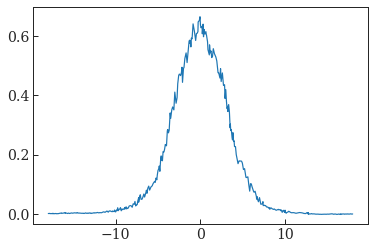

In [93]:
plt.plot(x_data, y_data)

In [94]:
indx_max = np.argmax(y_data)
indx_max

192

In [95]:
quart_len_x_dat = int(len(x_data)/4)
quart_len_x_dat

101

In [96]:
X = x_data[int(indx_max-quart_len_x_dat) : int(indx_max+quart_len_x_dat)]
Y = y_data[int(indx_max-quart_len_x_dat) : int(indx_max+quart_len_x_dat)]

In [97]:
len(X)

202

In [98]:
len(Y)

202

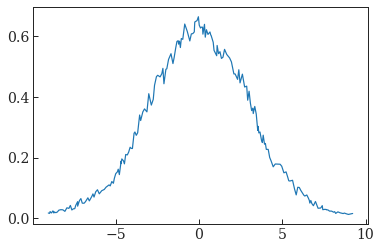

In [99]:
plt.plot(X, Y)

## Current method doesn't work, have to manually find half-peak x axis index

In [100]:
indx_max = np.argmax(y_data)
peak = y_data[indx_max]

print 'peak of ', peak, ' found at index ', indx_max

first = int(0)

for i in xrange(len(y_data)):
    if y_data[i] > peak/2:
        print 'half peak of ', y_data[i] , ' found at index ', i
        first = i
        break
        
for i in reversed(xrange(len(y_data))):
    if y_data[i] > peak/2:
        print 'half peak of ', y_data[i] , ' found at index ', i
        second = i
        break

X = x_data[int(first) : int(second)]
Y = y_data[int(first) : int(second)]



peak of  0.6638534591783954  found at index  192
half peak of  0.34312616556205056  found at index  152
half peak of  0.34014095682108453  found at index  229


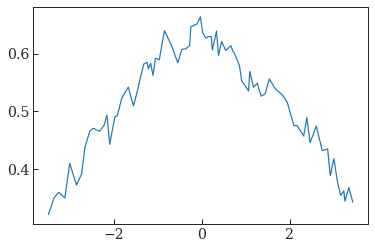

In [101]:
plt.plot(X, Y)

In [102]:
def gaussian_3_parameters(x, A, mu, sig):
    """gaussian_3_parameter(x, m, A, mu, sig)"""
    return A/np.sqrt(2*np.pi)/sig*np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))


ampl = max(Y)
sigma0 = 1
mu0 = 0

popt3, pcov3 = curve_fit(gaussian_3_parameters, X, Y, p0 =[ampl, mu0, sigma0])
result3 = gaussian_3_parameters(X, popt3[0], popt3[1], popt3[2])
print 'found sigma to be :', popt3[2]

found sigma to be : 3.1153220873265624


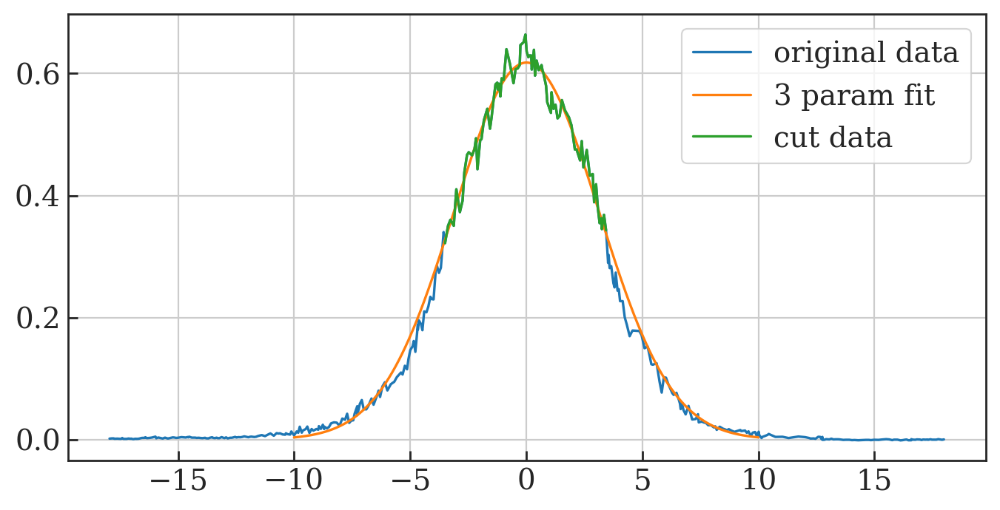

In [103]:
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');

x_dat = np.linspace(-10, 10, 1000)
result3 = gaussian_3_parameters(x_dat, popt3[0], popt3[1], popt3[2])
plt.plot(x_data, y_data, label='original data')
plt.plot(x_dat, result3, label='3 param fit');
plt.plot(X, Y, label='cut data')
plt.grid()
plt.legend()

In [104]:
def find_factor_of_peak_indices(x_data, y_data, fac, verbose = False):
    indices = []
    first = int(0)
    second = int(0)    
    
    indx_max = np.argmax(y_data)
    peak = y_data[indx_max]
    
    for i in xrange(len(y_data)):
        if y_data[i] > peak*fac:
            if verbose: print 'half peak of ', y_data[i] , ' found at index ', i
            first = i
            break
        
    for i in reversed(xrange(len(y_data))):
        if y_data[i] > peak*fac:
            if verbose: print 'half peak of ', y_data[i] , ' found at index ', i
            second = i
            break
            
    
    
    indices.append(first)
    indices.append(second)
    
    return indices

def find_half_peak_indices(x_data, y_data, verbose = False):
    indices = []
    first = int(0)
    second = int(0)    
    
    indx_max = np.argmax(y_data)
    peak = y_data[indx_max]
    
    for i in xrange(len(y_data)):
        if y_data[i] > peak/2:
            if verbose: print 'half peak of ', y_data[i] , ' found at index ', i
            first = i
            break
        
    for i in reversed(xrange(len(y_data))):
        if y_data[i] > peak/2:
            if verbose: print 'half peak of ', y_data[i] , ' found at index ', i
            second = i
            break
    
    indices.append(first)
    indices.append(second)
    
    return indices

def gaussian_3_parameters(x, A, mu, sig):
    """gaussian_3_parameter(x, m, A, mu, sig)"""
    return A/np.sqrt(2*np.pi)/sig*np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))

def second_moment(values, weights):
    weighted_average = np.average(values, weights=weights)
    second_moment = np.sqrt(np.average((values-weighted_average)**2, weights=weights))
    return (second_moment)

def Core_filter(ndf, with_plot = True, WS = '64.V', sig_limit_mm=10, smooth = False):
    
    df = ndf.copy()
    
    position_label = 'position V'
    profile_label = 'profile V'
    window = 40
    
    
    mu_3 = []
    sigma_3 = []
    A_3 = []
    sig_err_3 = []
    
    mom_2nd = []
    
    # Iterate over dataframe
    for j in range(0, len(df), 1):
        print '\nCore_filter row ', j    
    
        y_data = df[profile_label].iloc()[j]
        x_data = df[position_label].iloc()[j]
        indx_max = np.argmax(y_data)  
        peak = y_data[indx_max]
        
#         print '\nPeak magnitude ', peak, 'found at index ', indx_max
        
        quart_len_x_dat = int(len(x_data)/4)
        
#         print '\nUsing indices', int(indx_max-quart_len_x_dat), ' to ', int(indx_max+quart_len_x_dat)
        
        # Use only half of the data, around the peak        
#         half_peak_indices = find_half_peak_indices(x_data, y_data)
        # equivalent
        half_peak_indices = find_factor_of_peak_indices(x_data, y_data, 0.5, verbose=True)
        
        X = x_data[half_peak_indices[0] : half_peak_indices[1]]
#         X = X/1000
        Y = y_data[half_peak_indices[0] : half_peak_indices[1]]
        
        indx_max = np.argmax(Y)        
        mu0 = X[indx_max]
        x_tmp = X
        y_tmp = Y
        offs0 = min(y_tmp)
        ampl = max(y_tmp)-offs0
#         x1 = x_tmp[np.searchsorted(y_tmp[:window], offs0+ampl/2)]
#         x2 = x_tmp[np.searchsorted(-y_tmp[window:], -offs0+ampl/2)]
#         FWHM = x2-x1
        #sigma0 = np.abs(2*FWHM/2.355)
        sigma0 = 1
        ampl *= np.sqrt(2*np.pi)*sigma0
        slope = 0
    
        popt3 = []
        pcov3 = []   
        
        try:
            popt3, pcov3 = curve_fit(gaussian_3_parameters, X, Y, p0 =[ampl, mu0, sigma0])

            fit_A_3 = popt3[0]
            fit_mean_3 = popt3[1]
            fit_sigma_3 = popt3[2]

            A_3.append(np.array(popt3[0]))
            mu_3.append(np.array(popt3[1]))
            sigma_3.append(np.array(abs(popt3[2])))
            sig_err_3.append(np.sqrt(np.diag(pcov3[2]))[2][2])   
            
            print '3 parameter fit sigma = ', popt3[2] , ' +/- ', np.sqrt(np.diag(pcov3[2]))[2][2]
# Plot
#------------------------------------------------      
            if with_plot:
                fig, ax1 = plt.subplots(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');

                x_dat = np.linspace(-20, 20, 1000)
                result3 = gaussian_3_parameters(x_dat, popt3[0], popt3[1], popt3[2])

                plt.plot(df[position_label].iloc()[j], df[profile_label].iloc()[j], label='filtered data');
                plt.plot(X, Y, label='raw core data');
                plt.plot(x_dat, result3, label='3 param core fit' );

                tit = 'WS profile & fit ' + str(j);
                savename = 'MD4224_HB_Vertical_Corefit_' + str(j);

                plt.title(tit);
                plt.ylabel('Profile [-]');
                plt.xlabel('Position [mm]');
                plt.legend();            
                plt.grid();
                fig.savefig(savename);
                plt.close();            
            
        except:            
            
            print '3 parameter fit not found'
                        
            result3 = 'NaN'

            fit_A_3 = 'NaN'
            fit_mean_3 = 'NaN'
            fit_sigma_3 = 'NaN'

            A_3.append('NaN')
            mu_3.append('NaN')
            sigma_3.append('NaN')
            sig_err_3.append('NaN')   
        
        second_mom = second_moment(X, Y)

        mom_2nd.append(second_mom)
    
    df['Core 2ndMoment '+WS[-1]] = mom_2nd   
    
    df['Core sig '+WS[-1]] = sigma_3
    df['Core sig err'+WS[-1]] = sig_err_3
    df['Core A '+WS[-1]] = A_3
    df['Core mu '+WS[-1]] = mu_3
    
    return df

In [105]:
df0_core = Core_filter(df0)


Core_filter row  0
half peak of  0.34312616556205056  found at index  152
half peak of  0.34014095682108453  found at index  229
3 parameter fit sigma =  3.1153221236135034  +/-  0.04469013465596554


/usr/local/bin/start_ipykernel.py:129: RuntimeWarning: invalid value encountered in sqrt
/usr/local/bin/start_ipykernel.py:131: RuntimeWarning: invalid value encountered in sqrt



Core_filter row  1
half peak of  0.3494602863317584  found at index  159
half peak of  0.361790927856525  found at index  239
3 parameter fit sigma =  3.5433838997184575  +/-  0.07409591372090188

Core_filter row  2
half peak of  0.319849632035197  found at index  144
half peak of  0.3210196088348243  found at index  215
3 parameter fit sigma =  2.8790524968237077  +/-  0.052397597851963136

Core_filter row  3
half peak of  0.3255894264648742  found at index  172
half peak of  0.3209840705167232  found at index  242
3 parameter fit sigma =  2.6788557414744423  +/-  0.054223833941871136

Core_filter row  4
half peak of  0.30862725134405455  found at index  166
half peak of  0.2964785916481931  found at index  248
3 parameter fit sigma =  3.4878394774488757  +/-  0.08298362820320936

Core_filter row  5
half peak of  0.32587573126936276  found at index  171
half peak of  0.3121638453720792  found at index  255
3 parameter fit sigma =  3.480941795710534  +/-  0.06408110852420859

Core_fil


Core_filter row  43
half peak of  0.3310030219268555  found at index  158
half peak of  0.3399065488205566  found at index  241
3 parameter fit sigma =  3.60603944402545  +/-  0.0696246806479484

Core_filter row  44
half peak of  0.33325322001624047  found at index  149
half peak of  0.3356252749982794  found at index  224
3 parameter fit sigma =  2.98569061284806  +/-  0.048686605865529246

Core_filter row  45
half peak of  0.32800191846553284  found at index  153
half peak of  0.31876884812656625  found at index  230
3 parameter fit sigma =  3.223713384785238  +/-  0.06516350838514187

Core_filter row  46
half peak of  0.32685891278925505  found at index  166
half peak of  0.3333303588760701  found at index  245
3 parameter fit sigma =  3.3018379408754557  +/-  0.056161455986887904

Core_filter row  47
half peak of  0.31985448785314263  found at index  161
half peak of  0.3130331674977407  found at index  246
3 parameter fit sigma =  3.533285390282038  +/-  0.06315910543302186

Core


Core_filter row  85
half peak of  0.21388071652703403  found at index  234
half peak of  0.21887656305655231  found at index  368
3 parameter fit sigma =  5.725492222818863  +/-  0.11374184630689417

Core_filter row  86
half peak of  0.20148404489198815  found at index  256
half peak of  0.21617529583307074  found at index  399
3 parameter fit sigma =  5.512753382776311  +/-  0.0783647757270535

Core_filter row  87
half peak of  0.31594543362439204  found at index  151
half peak of  0.3193825169537936  found at index  227
3 parameter fit sigma =  3.136113086497779  +/-  0.05256616917095694

Core_filter row  88
half peak of  0.3291917166283197  found at index  153
half peak of  0.3446495110667015  found at index  235
3 parameter fit sigma =  3.468253167423315  +/-  0.050677717036074814

Core_filter row  89
half peak of  0.3420537704877941  found at index  146
half peak of  0.31294286850856756  found at index  221
3 parameter fit sigma =  3.08017890138041  +/-  0.04632190019793478

Core


Core_filter row  126
half peak of  0.22836307800543626  found at index  223
half peak of  0.2407086894959227  found at index  346
3 parameter fit sigma =  5.355243494526514  +/-  0.11464097219047761

Core_filter row  127
half peak of  0.2465662346162348  found at index  241
half peak of  0.22979878158233571  found at index  368
3 parameter fit sigma =  5.4401338530416785  +/-  0.0939483160323377

Core_filter row  128
half peak of  0.20690172422532785  found at index  257
half peak of  0.20250861697866407  found at index  397
3 parameter fit sigma =  5.634749360426365  +/-  0.09511896272083685

Core_filter row  129
half peak of  0.17736804087439334  found at index  284
half peak of  0.18024014365698315  found at index  437
3 parameter fit sigma =  6.471167370358328  +/-  0.09914296304563554

Core_filter row  130
half peak of  0.3324007497152204  found at index  152
half peak of  0.33418234483869186  found at index  232
3 parameter fit sigma =  3.517350959401252  +/-  0.0619931688555268


Core_filter row  167
half peak of  0.29627753957957825  found at index  179
half peak of  0.30233677611965415  found at index  270
3 parameter fit sigma =  4.137411044946849  +/-  0.09260978974522192

Core_filter row  168
half peak of  0.268691326316745  found at index  195
half peak of  0.2833429234072875  found at index  292
3 parameter fit sigma =  4.461621118429469  +/-  0.09919224261015937

Core_filter row  169
half peak of  0.22278167267721546  found at index  216
half peak of  0.22555114186663114  found at index  343
3 parameter fit sigma =  5.0595920665967204  +/-  0.09418116635565148

Core_filter row  170
half peak of  0.21460588820506535  found at index  234
half peak of  0.21551033312355145  found at index  372
3 parameter fit sigma =  5.578075262170229  +/-  0.0979266707924343

Core_filter row  171
half peak of  0.21640016534636927  found at index  262
half peak of  0.2137111162122306  found at index  404
3 parameter fit sigma =  6.081168154684258  +/-  0.10691336435078441


Core_filter row  208
half peak of  0.28224445848482743  found at index  187
half peak of  0.26052332843481774  found at index  281
3 parameter fit sigma =  3.9471943277970296  +/-  0.06608979894585938

Core_filter row  209
half peak of  0.2550521459945883  found at index  195
half peak of  0.2505908648471874  found at index  300
3 parameter fit sigma =  4.294841495270403  +/-  0.06804583047618004

Core_filter row  210
half peak of  0.24038691252067895  found at index  215
half peak of  0.2394369232548232  found at index  338
3 parameter fit sigma =  4.933074576155784  +/-  0.08318057786590653

Core_filter row  211
half peak of  0.23408005042975133  found at index  220
half peak of  0.23171224816773933  found at index  334
3 parameter fit sigma =  5.214987147955204  +/-  0.11490639510054694

Core_filter row  212
half peak of  0.2125768436793992  found at index  244
half peak of  0.2143833876565878  found at index  391
3 parameter fit sigma =  5.813535893492368  +/-  0.08056452682087663


Core_filter row  249
half peak of  0.29576399402450004  found at index  180
half peak of  0.3007056306311489  found at index  268
3 parameter fit sigma =  3.6727744996269887  +/-  0.06038112308205572

Core_filter row  250
half peak of  0.2802591012589417  found at index  182
half peak of  0.3124910223687303  found at index  269
3 parameter fit sigma =  3.690559416692785  +/-  0.05986587012324784

Core_filter row  251
half peak of  0.28079680657471656  found at index  185
half peak of  0.27189976162519347  found at index  279
3 parameter fit sigma =  4.18865692692702  +/-  0.08058262743669292

Core_filter row  252
half peak of  0.26985708030075284  found at index  187
half peak of  0.26269201745190424  found at index  284
3 parameter fit sigma =  4.166720251463708  +/-  0.07255437920110942

Core_filter row  253
half peak of  0.24097908143887528  found at index  209
half peak of  0.2567072592498365  found at index  322
3 parameter fit sigma =  4.676525930007705  +/-  0.07351335957906549


Core_filter row  290
half peak of  0.3313424492628735  found at index  160
half peak of  0.32204224523084507  found at index  243
3 parameter fit sigma =  3.441072638030538  +/-  0.052443610331944335

Core_filter row  291
half peak of  0.30499457554005255  found at index  166
half peak of  0.3248903029070357  found at index  246
3 parameter fit sigma =  3.350734547278079  +/-  0.06850064699645074

Core_filter row  292
half peak of  0.30893556821590024  found at index  171
half peak of  0.2838096642912795  found at index  254
3 parameter fit sigma =  3.621465250639977  +/-  0.07102404444107616

Core_filter row  293
half peak of  0.2620225013931041  found at index  179
half peak of  0.26253175344788016  found at index  277
3 parameter fit sigma =  3.919983453569165  +/-  0.059864166026811605

Core_filter row  294
half peak of  0.25086642835879636  found at index  199
half peak of  0.2815757871758401  found at index  307
3 parameter fit sigma =  4.194734437300154  +/-  0.0582473968395955


Core_filter row  331
half peak of  0.329224078954605  found at index  150
half peak of  0.3321638816446275  found at index  226
3 parameter fit sigma =  3.0102799738774655  +/-  0.04813659415119318

Core_filter row  332
half peak of  0.3441262200406251  found at index  154
half peak of  0.30920430653278186  found at index  223
3 parameter fit sigma =  2.976185271234128  +/-  0.057476036833331766

Core_filter row  333
half peak of  0.3127380774681654  found at index  165
half peak of  0.30824811350186887  found at index  250
3 parameter fit sigma =  3.3101481728242135  +/-  0.05468952495354786

Core_filter row  334
half peak of  0.2803337939130127  found at index  168
half peak of  0.2777067790089828  found at index  254
3 parameter fit sigma =  3.347264638490424  +/-  0.05084415199401659

Core_filter row  335
half peak of  0.2794782036926664  found at index  178
half peak of  0.3005201783014425  found at index  277
3 parameter fit sigma =  3.8907935266304015  +/-  0.055540665329039306


Core_filter row  372
half peak of  0.3200066991308196  found at index  156
half peak of  0.3357684222187234  found at index  228
3 parameter fit sigma =  2.8911207077620524  +/-  0.059205878511347315

Core_filter row  373
half peak of  0.30719849860386067  found at index  150
half peak of  0.3072139710318255  found at index  223
3 parameter fit sigma =  3.1276991994057974  +/-  0.07185159591947833

Core_filter row  374
half peak of  0.31150373426552164  found at index  156
half peak of  0.3036699965208781  found at index  235
3 parameter fit sigma =  3.136703459977321  +/-  0.04645609637943021

Core_filter row  375
half peak of  0.3072219003487794  found at index  163
half peak of  0.31627403364589096  found at index  245
3 parameter fit sigma =  3.3716385491080296  +/-  0.05739196845739618

Core_filter row  376
half peak of  0.32011231654743577  found at index  179
half peak of  0.2982146963857927  found at index  265
3 parameter fit sigma =  3.4039761375409694  +/-  0.05175221448474


Core_filter row  413
half peak of  0.3040567987306185  found at index  160
half peak of  0.31134221841302623  found at index  235
3 parameter fit sigma =  2.941926850385596  +/-  0.07010496915263165

Core_filter row  414
half peak of  0.317711429286929  found at index  157
half peak of  0.31034853952234376  found at index  228
3 parameter fit sigma =  2.9245749188175556  +/-  0.06152652019551771

Core_filter row  415
half peak of  0.31774073333625663  found at index  157
half peak of  0.3281643513414315  found at index  235
3 parameter fit sigma =  3.352527582281661  +/-  0.05809506752960213

Core_filter row  416
half peak of  0.30486094998871804  found at index  174
half peak of  0.28524637412805975  found at index  257
3 parameter fit sigma =  3.520238449325299  +/-  0.06336913847383917

Core_filter row  417
half peak of  0.2778277387823787  found at index  185
half peak of  0.27889868222937486  found at index  278
3 parameter fit sigma =  3.8094267190243456  +/-  0.0538346879528961

In [106]:
df0_core

,PR.BWS.64.V_ROT:ACQ_DELAY,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,cycleStamp,2ndMoment V,sig V,sig errV,A V,mu V,position V,...,emittance V,betx,bety,dx,emittance V 2ndMoment,Core 2ndMoment V,Core sig V,Core sig errV,Core A V,Core mu V
2018-09-05 10:20:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.17229545882224, 0.17229545882224, 0.1735024...",1.536143e+09,3.281589,2.9994494508823175,0.011036,4.674117219845751,1.194792438636508,"[17.99320756136349, 17.913207561363492, 17.750...",...,0.892504,12.411288,22.776124,2.521881,1.068306,1.783541,3.1153221236135034,0.044690,4.825363235602487,0.012463267110845057
2018-09-05 10:21:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173300683154985, 0.17289...",1.536143e+09,3.203431,3.1059290861276785,0.017218,4.735926944681591,1.0613386155296278,"[18.633661384470372, 18.52566138447037, 18.498...",...,0.951445,12.347425,22.909011,2.537551,1.012119,1.882235,3.5433838997184575,0.074096,5.250472484086207,0.1573268859846897
2018-09-05 10:21:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173704413116415, 0.17471...",1.536143e+09,3.013625,2.877569760386751,0.013372,4.210207115773017,1.1427805475505157,"[17.169219452449486, 17.089219452449484, 16.95...",...,0.810871,12.284674,23.073146,2.552849,0.889362,1.628977,2.8790524968237077,0.052398,4.21542657349642,0.11606248690242002
2018-09-05 10:22:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172095114732879, 0.17129606525681, 0.171096...",1.536143e+09,3.192118,3.240216833707556,0.019804,4.449373960361013,1.0897481518960797,"[19.37725184810392, 19.26125184810392, 19.1432...",...,1.018467,12.218438,23.292082,2.569060,0.988454,1.590686,2.6788557414744423,0.054224,3.864154204467434,0.1485523261373812
2018-09-05 10:22:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173099170197014, 0.17330...",1.536143e+09,3.275086,3.180944840805123,0.017962,4.441083033668285,0.9197659734003868,"[19.080234026599612, 18.99523402659961, 18.911...",...,0.971323,12.153815,23.537250,2.584562,1.029667,1.932534,3.4878394774488757,0.082984,4.789308476316353,0.19146596547197545
2018-09-05 10:23:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.174311772273524, 0.17350...",1.536143e+09,3.432943,3.300061990218307,0.014947,4.565909315671348,0.9676094983024153,"[19.781390501697583, 19.699390501697586, 19.61...",...,1.033064,12.086896,23.819028,2.600027,1.117934,1.969635,3.480941795710534,0.064081,4.766162458538799,0.07149618618057346
2018-09-05 10:24:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.174109083627406, 0.173502430703752, 0.17451...",1.536143e+09,3.393933,3.319619663513618,0.015588,4.512798604860301,1.06952690260444,"[19.88347309739556, 19.80947309739556, 19.7584...",...,1.030796,12.018420,24.155232,2.615492,1.077463,2.135088,3.7218894594319036,0.054858,4.928850204649218,0.03536402260873091
2018-09-05 10:24:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172095114732879, 0.171695125159864, 0.17209...",1.536143e+09,3.413773,3.4922039286292734,0.019307,4.490249394766745,1.1695269372034072,"[20.91047306279659, 20.68447306279659, 20.5274...",...,1.123431,11.952957,24.527882,2.629957,1.073535,2.201825,3.9814498477417244,0.080735,4.975840081950834,0.11520579822002931
2018-09-05 10:25:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173502430703752, 0.173300683154985, 0.17492...",1.536143e+09,3.655397,3.5763442350211503,0.018213,4.275558516238426,0.8637397442678284,"[21.43426025573217, 21.25826025573217, 21.1752...",...,1.157208,11.883979,24.973197,2.645090,1.208932,2.302396,4.032612987576035,0.074822,4.68933244142025,0.09432146835772359
2018-09-05 10:25:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.174109083627406, 0.173502430703752, 0.17350...",1.536143e+09,3.603658,3.73171

In [107]:
df0_sim_core = Core_filter(df0_sim)


Core_filter row  0
half peak of  33.568490913188406  found at index  278
half peak of  33.70850547382736  found at index  721
3 parameter fit sigma =  6.8854981320467  +/-  0.021311358299167478


/usr/local/bin/start_ipykernel.py:129: RuntimeWarning: invalid value encountered in sqrt
/usr/local/bin/start_ipykernel.py:131: RuntimeWarning: invalid value encountered in sqrt



Core_filter row  1
half peak of  36.764688207763456  found at index  311
half peak of  36.6134690849185  found at index  700
3 parameter fit sigma =  6.469244907069485  +/-  0.02373541248754898

Core_filter row  2
half peak of  39.83343220282088  found at index  315
half peak of  40.19268752883091  found at index  701
3 parameter fit sigma =  5.945994738218221  +/-  0.0253643508670068

Core_filter row  3
half peak of  43.254184752447046  found at index  317
half peak of  43.236924503144095  found at index  698
3 parameter fit sigma =  5.413800241368333  +/-  0.018334579737174676

Core_filter row  4
half peak of  46.35689738067403  found at index  305
half peak of  46.651023901986065  found at index  653
3 parameter fit sigma =  4.892482649583158  +/-  0.015712119183151876

Core_filter row  5
half peak of  51.31762983729522  found at index  341
half peak of  51.77893146235954  found at index  658
3 parameter fit sigma =  4.238999600132762  +/-  0.004953769904355383

Core_filter row  6


In [108]:
df0_sim_core

,Qx,Qy,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,2ndMoment V,sig V,sig errV,A V,mu V,position V,...,emittance V,betx,bety,dx,emittance V 2ndMoment,Core 2ndMoment V,Core sig V,Core sig errV,Core A V,Core mu V
0,6.21,6.10,"[-0.017099595165482453, -0.017065313016696674,...","[0.05833940026622983, 0.0, 0.0, 0.058339400266...",5.215324,5.817771719574362,0.022708,1031.1901508617536,0.0024614978827957566,"[-17.102056663365246, -17.06777451457947, -17....",...,2.659135,11.497769,28.759416,2.723260,2.136926,4.030407,6.8854981320467,0.021311,1163.844659980689,-0.0008737426826138753
1,6.21,6.11,"[-0.01827152024478173, -0.01823536961406902, -...","[0.05532406933351312, 0.0, 0.0, 0.0, 0.0, 0.0,...",4.728959,5.317157105708749,0.023770,1033.5334751606251,-0.008484167419346563,"[-18.263036077362383, -18.22688544664967, -18....",...,2.289486,11.561220,27.901540,2.711618,1.810965,3.740712,6.469244907069485,0.023735,1191.14707661736,-0.01214136698181954
2,6.21,6.12,"[-0.016994227368190312, -0.016960824940637532,...","[0.059875887668336895, 0.0, 0.0, 0.0, 0.0, 0.0...",4.341586,4.871800064234429,0.022075,1033.1902449038778,-0.005304672495188379,"[-16.988922695695123, -16.955520268142344, -16...",...,1.970629,11.621678,27.213290,2.699578,1.565031,3.429988,5.945994738218221,0.025364,1193.929719936554,-0.00658027867259963
3,6.21,6.13,"[-0.015662908547876414, -0.015632009032812554,...","[0.06472593488494378, 0.0, 0.0, 0.0, 0.0, 0.0,...",4.049346,4.503954969346823,0.018516,1030.689877786509,-0.002954810464098613,"[-15.659953737412316, -15.629054222348454, -15...",...,1.726179,11.686152,26.552736,2.686666,1.395300,3.131917,5.413800241368333,0.018335,1177.418526175436,-0.009114097799269985
4,6.21,6.14,"[-0.015013218556770937, -0.014981939500537018,...","[0.0639405481112731, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3.823036,4.197300248142817,0.014832,1027.043332681334,-0.00014446228543845067,"[-15.013074094485498, -14.98179503825158, -14....",...,1.533881,11.752091,25.951089,2.673333,1.272531,2.884879,4.892482649583158,0.015712,1146.12465042938,-0.0009917038937416738
5,6.21,6.15,"[-0.015339487167486808, -0.015308849223535547,...","[0.06527853184866131, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.616009,3.8668447923046614,0.008720,1019.2209283176079,-0.006432648342715943,"[-15.333054519144092, -15.302416575192831, -15...",...,1.326459,11.815070,25.469862,2.660010,1.159950,2.563698,4.238999600132762,0.004954,1086.5772566369017,0.0015289477266095268
6,6.21,6.16,"[-0.014690916913205692, -0.014659924917875789,...","[0.06453279237785262, 0.0, 0.0, 0.0, 0.1290655...",3.481673,3.6692675225423033,0.006664,1015.1683955013541,-0.008098233943090683,"[-14.682818679262601, -14.651826683932697, -14...",...,1.217364,11.881711,24.988794,2.645587,1.096069,2.389296,3.9496284014657768,0.006163,1068.4440204212756,-0.01024980083028757
7,6.21,6.17,"[-0.015195683518371805, -0.015165529668479082,...","[0.0663265223881947, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3.388368,3.5255233539563897,0.004980,1011.5435064843596,0.005052968782141422,"[-15.200736487153947, -15.170582637261223, -15...",...,1.144130,11.949974,24.545889,2.630616,1.056841,2.292687,3.732193514954452,0.005151,1052.1674677032458,-0.002514274715058168
8,6.21,6.18,"[-0.016141716562407548, -0.016110813028961692,...","[0.06471751858097662, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.329247,3.4323066095590216,0.004038,1009.0333776628489,0.0031441082665079998,"[-16.144860670674056, -16.1139571372282, -16.0...",...,1.102165,12.019244,24.150862,2.615310,1.036971,2.174833,3.6311842299097274,0.005169,1050.2064417178487,-0.0017710461419151416
9,6.21,6.19,"[-0.017877498753180558, -0.01784486170522946, ...","[0.0612800521357514, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3.290178,3.3616323367877086,0.002929,1006.4682009566075,-0.005528289471227284,"[-17.87197046370933, -17.839333415758237, -17....",...,1.072195,12.088000,23.814078,2.599778,1.027099,2.111603,3.4995681065862407,0.005440,1035.5468165151228,0.0038626671890144245


# Emittance from Core sigma and second moment

In [109]:
# from scipy.interpolate import interp1d
# def PS_WSoptics(tunex, tuney, WS='65', verbose=False):
        
#     ptc_optics = dict()
#     #ptc_optics[float(tune)] = [(all floats) beta_x, beta_y, alpha_x, alpha_y, D_x, D_y]
#     ptc_optics[6.10] = [11.835, 24.924, 0.0115, -0.016, 2.86, 0.]
#     ptc_optics[6.12] = [11.917, 24.029, 0.0099, 0.0028, 2.83, 0.]
#     ptc_optics[6.14] = [12, 23.44, 0.0082, 0.0157, 2.8, 0.]
#     ptc_optics[6.16] = [12.083, 23.031, 0.0065, 0.0251, 2.77, 0.]
#     ptc_optics[6.18] = [12.165, 22.735, 0.0047, 0.0322, 2.74, 0.]
#     ptc_optics[6.20] = [12.247, 22.513, 0.0029, 0.0377, 2.71, 0.]
#     ptc_optics[6.22] = [12.328, 22.34, 0.0012, 0.0421, 2.68, 0.]
#     ptc_optics[6.24] = [12.409, 22.202, -0.00055, 0.0457, 2.65, 0.]
    
#     # interpolated data
    
#     Qy = [6.1, 6.12, 6.14, 6.16, 6.18, 6.2, 6.22, 6.24]
#     beta_x_ptc = [11.835, 11.917, 12, 12.083, 12.165, 12.247, 12.328, 12.409]
#     beta_x = [11.496287799470704, 11.622348183114314, 11.752791012666949, 11.882235857048215, 12.017876534237434, 12.155717432086707, 12.286640418239848, 12.418697362251356]
#     beta_x_eff = [15.71937930751325, 15.769989166689998, 15.846834580765128, 15.914760535085426, 16.012224151123437, 16.067729573281675, 16.265895421362465, 16.287392480720673]
#     beta_y_ptc = [24.924, 24.029, 23.44, 23.031, 22.735, 22.513, 22.34, 22.202]
#     beta_y = [28.784027286342415, 27.207938015726914, 25.95396311972594, 24.996666601561824, 24.16981199942386, 23.532576507285963, 23.068468704478313, 22.76306463960286]
#     beta_y_eff = [28.784021415243977, 27.20793652234759, 25.953962447008042, 24.996665150525683, 24.1698108711869, 23.532575659545216, 23.06846817340586, 22.763064622584743]
#     alpha_x_ptc = [0.0115, 0.0099, 0.0082, 0.0065, 0.0047, 0.0029, 0.0012, -0.00055]
#     alpha_x = [0.020196943327589586, 0.017627598679308795, 0.014994645269010886, 0.012378157613604897, 0.009604465728624582, 0.006771094434762246, 0.004103420240249408, 0.0014042139169805218]
#     alpha_x_eff = [0.012644756543632252, 0.010999606000298172, 0.009279390671409909, 0.007565427145992475, 0.005761468634033717, 0.0038912356469907898, 0.002097495908152698, 0.00041000161249536634]
#     alpha_y_ptc = [-0.016, 0.0028, 0.0157, 0.0251, 0.0322, 0.0377, 0.0421, 0.0457]
#     alpha_y = [-0.07633339839729839, -0.04694770375188252, -0.022726415517094378, -0.0032576706141040795, 0.013524545703849094, 0.026632494806317433, 0.03620287285371853, 0.04286149340139552]
#     alpha_y_eff = [-0.07633353873159593, -0.04694768168864276, -0.022726376530043065, -0.0032576498736779915, 0.013524555750239533, 0.026632507622584966, 0.03620287711554266, 0.04286150380905749]
#     D_x_ptc = [2.86, 2.83, 2.8, 2.77, 2.74, 2.71, 2.68, 2.65]
#     D_x = [2.7232998132262445, 2.6998500131457344, 2.6737571779004394, 2.645956067783495, 2.615602483750087, 2.5843844615942437, 2.5525948394197817, 2.5209695063465576]
#     D_y_ptc = [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
#     D_y = [0.0008237864638082594, -2.8364867400863136e-05, 0.0005038574946213577, -0.00010499875711448806, 3.6980491474269093e-05, -1.014483389421703e-05, -2.01627560923344e-05, -5.804429820819794e-05]
# #     alpha_x_int = interp1d(Qy, alpha_x)
# #     alpha_y_int = interp1d(Qy, alpha_y)

# #     alpha_x_eff_int = interp1d(Qy, alpha_x_eff)
# #     alpha_y_eff_int = interp1d(Qy, alpha_y_eff)

# #     beta_x_int = interp1d(Qy, beta_x)
# #     beta_y_int = interp1d(Qy, beta_y, kind='cubic')

#     beta_x_int = interp1d(Qy, beta_x)
#     beta_y_int = interp1d(Qy, beta_y, kind='cubic')

#     D_x_int = interp1d(Qy, D_x)
# #     D_y_int = interp1d(Qy, D_y)

#     if tuney < 1:
#         tuney = 6 + tuney
    
#     if tuney > 6.24:
#         result = {'Beta_x':beta_x_int(6.24), 'Beta_y':beta_y_int(6.24),'D_x': D_x_int(6.24)}
#     elif tuney < 6.10:
#         result = {'Beta_x':beta_x_int(6.10), 'Beta_y':beta_y_int(6.10),'D_x': D_x_int(6.10)}
#     else:
#         result = {'Beta_x':beta_x_int(tuney), 'Beta_y':beta_y_int(tuney),'D_x': D_x_int(tuney)}
#     return result

# def profiles(ndf,WS='64.V',myFiles=None, lim=40):
#     df=ndf.copy()
#     # play with these limits
#     #x=np.linspace(-40,40,1000)
#     x=np.linspace(-lim,lim,1000)
#     a=df.columns
#     if 'profile '+WS[-1] not in a:
#         df['profile '+WS[-1]]=df['PR.BWS.{}_ROT:PROF_DATA_IN'.format(WS)].apply(filtered)
#         df['position '+WS[-1]]=df['PR.BWS.{}_ROT:PROF_POSITION_IN'.format(WS)].values/1000.
#     if 'sig '+WS[-1] not in a:
#         df['sig '+WS[-1]]=np.nan
#         df['mu '+WS[-1]]=np.nan
#         df['c '+WS[-1]]=np.nan
#         df['A '+WS[-1]]=np.nan

#     span=span_range(df,myFiles=myFiles)
#     if np.isnan(df['sig '+WS[-1]].iloc[span]).all():
#         for i in span:
#             df['A '+WS[-1]].iloc[i], df['c '+WS[-1]].iloc[i], df['mu '+WS[-1]].iloc[i], df['sig '+WS[-1]].iloc[i] = makeGaussianFit_5_parameters(df['position '+WS[-1]].iloc[i], df['profile '+WS[-1]].iloc[i], for_df=True, window=lim)
#             try:
#                 yz=scipy.interpolate.interp1d(df['position '+WS[-1]].iloc[i] - df['mu '+WS[-1]].iloc[i], df['profile '+WS[-1]].iloc[i] - df['c '+WS[-1]].iloc[i])(x)
#                 if np.isnan(yz[0]):
#                     yz=np.nan
#             except:
#                 yz = np.nan
#             df['profile '+WS[-1]].iloc[i]=yz
#             df['position '+WS[-1]].iloc[i]=x
#     return df

# def twiss(ndf,WS='65.H',myFiles=None, verbose=False):
#     df=ndf.copy()
#     a=df.columns
#     if 'betx' not in a:
#         df['betx']=np.nan
#     if 'bety' not in a:
#          df['bety']=np.nan
#     if 'dx' not in a:
#          df['dx']=np.nan
#     span=span_range(df,myFiles=myFiles)
#     for i in span:
#             df.loc[df.index[i],'betx']=PS_WSoptics( df['Qx'].iloc[i], df['Qy'].iloc[i], WS=WS[:-2], verbose=verbose )['Beta_x']
#             df.loc[df.index[i],'dx']=PS_WSoptics( df['Qx'].iloc[i], df['Qy'].iloc[i], WS=WS[:-2], verbose=verbose )['D_x']
#             df.loc[df.index[i],'bety']=PS_WSoptics( df['Qx'].iloc[i], df['Qy'].iloc[i], WS=WS[:-2], verbose=verbose )['Beta_y']
#     return df

def core_emittance_df(ndf, WS='64.V', myFiles=None, beta=0.91444281513833, gamma=2.4708737618826, dp=8.7e-4, verbose=False):
    df=ndf.copy()
    a=df.columns
    if 'Core emittance V' not in a:
        df['Core emittance V']=np.nan
    span=span_range(df,myFiles=myFiles)
    if 'bety' not in a:
        df=twiss(df, WS=WS, verbose=verbose)
    for i in span:
        df.loc[df.index[i],'Core emittance V']=beta*gamma*(df['Core sig V'].iloc[i]**2)/df['bety'].iloc[i]
        print 'Emittance ', i, ' = ', beta*gamma*(df['Core sig V'].iloc[i]**2)/df['bety'].iloc[i]
    return df

# Override original due to a bug?
def core_emittance_df_2(ndf, WS='64.V', myFiles=None, beta=0.91444281513833, gamma=2.4708737618826, dp=8.7e-4, verbose=False):
    df=ndf.copy()
    a=df.columns
    span=span_range(df,myFiles=myFiles)
    if 'bety' not in a:
        df=twiss(df, WS=WS, verbose=verbose)
    for i in span:
        df.loc[df.index[i],'Core emittance V 2ndMoment']=beta*gamma*(df['Core 2ndMoment V'].iloc[i]**2)/df['bety'].iloc[i]
        print 'Emittance ', i, ' = ', beta*gamma*(df['sig V'].iloc[i]**2)/df['bety'].iloc[i]
    return df

In [110]:
final_md_df = core_emittance_df(df0_core)
final_md_df = core_emittance_df_2(final_md_df)

Emittance  0  =  0.9627936309570524
Emittance  1  =  1.2383322735451947
Emittance  2  =  0.8117073220989331
Emittance  3  =  0.6961413987629207
Emittance  4  =  1.1677889581554737
Emittance  5  =  1.1494143093332163
Emittance  6  =  1.295754835172323
Emittance  7  =  1.46025786454662
Emittance  8  =  1.4713163130368567
Emittance  9  =  1.584305266923513
Emittance  10  =  1.6350944396961138
Emittance  11  =  1.9556435841861188
Emittance  12  =  2.6983438320726743
Emittance  13  =  3.315899570566955
Emittance  14  =  0.994183745556126
Emittance  15  =  1.0481584178918257
Emittance  16  =  1.0779763648791314
Emittance  17  =  0.9070790093784055
Emittance  18  =  0.7453767952486449
Emittance  19  =  1.211405457220549
Emittance  20  =  1.4268207417522023
Emittance  21  =  1.287165312729587
Emittance  22  =  1.3265986735747262
Emittance  23  =  1.6975815426174201
Emittance  24  =  2.3691733269723354
Emittance  25  =  2.2629016158804287
Emittance  26  =  2.533031785750249
Emittance  27  =  2.

Emittance  338  =  1.7907315268924053
Emittance  339  =  1.9212165300078712
Emittance  340  =  2.2847444088931326
Emittance  341  =  2.4335279796072244
Emittance  342  =  2.6389030898068606
Emittance  343  =  3.41944137364621
Emittance  344  =  0.7411581994297837
Emittance  345  =  0.8344194239603264
Emittance  346  =  0.9291406454192662
Emittance  347  =  0.9372651811563544
Emittance  348  =  0.7861284076889186
Emittance  349  =  0.8500134136079185
Emittance  350  =  1.3484534157262635
Emittance  351  =  1.5546645875091836
Emittance  352  =  1.6280083669560999
Emittance  353  =  1.7925879593515808
Emittance  354  =  1.9094534914802046
Emittance  355  =  2.3815293073079955
Emittance  356  =  3.4507868859099196
Emittance  357  =  0.8419393546707913
Emittance  358  =  1.1438063709132116
Emittance  359  =  1.200076078069716
Emittance  360  =  1.125016470854186
Emittance  361  =  1.1789116758287546
Emittance  362  =  1.4191331104400418
Emittance  363  =  1.4041219898169397
Emittance  364  

Emittance  169  =  1.7184454125731372
Emittance  170  =  1.9689625587731792
Emittance  171  =  2.3445073550225897
Emittance  172  =  2.4683104802114118
Emittance  173  =  2.7272861207140107
Emittance  174  =  0.8408924562185129
Emittance  175  =  0.8500743093022617
Emittance  176  =  1.0968246244257682
Emittance  177  =  1.2420348543839606
Emittance  178  =  1.244593734357902
Emittance  179  =  1.261033036448148
Emittance  180  =  1.197636771679817
Emittance  181  =  1.3379012389894342
Emittance  182  =  1.6307286966027137
Emittance  183  =  1.5934783984991436
Emittance  184  =  1.8706893555756872
Emittance  185  =  2.1022063076757522
Emittance  186  =  2.9961100449880673
Emittance  187  =  0.9704085381109563
Emittance  188  =  0.9804941181228223
Emittance  189  =  0.9321790553902981
Emittance  190  =  0.9706274789470387
Emittance  191  =  1.0682693535052061
Emittance  192  =  1.0607955116755143
Emittance  193  =  1.08735291266711
Emittance  194  =  1.2544277904035224
Emittance  195  =

Emittance  414  =  0.8774974833428715
Emittance  415  =  0.9179669936779419
Emittance  416  =  1.060310449255694
Emittance  417  =  1.1985451731611692
Emittance  418  =  1.2460943046284425


In [111]:
final_md_df

,PR.BWS.64.V_ROT:ACQ_DELAY,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,cycleStamp,2ndMoment V,sig V,sig errV,A V,mu V,position V,...,bety,dx,emittance V 2ndMoment,Core 2ndMoment V,Core sig V,Core sig errV,Core A V,Core mu V,Core emittance V,Core emittance V 2ndMoment
2018-09-05 10:20:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.17229545882224, 0.17229545882224, 0.1735024...",1.536143e+09,3.281589,2.9994494508823175,0.011036,4.674117219845751,1.194792438636508,"[17.99320756136349, 17.913207561363492, 17.750...",...,22.776124,2.521881,1.068306,1.783541,3.1153221236135034,0.044690,4.825363235602487,0.012463267110845057,0.962794,0.315568
2018-09-05 10:21:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173300683154985, 0.17289...",1.536143e+09,3.203431,3.1059290861276785,0.017218,4.735926944681591,1.0613386155296278,"[18.633661384470372, 18.52566138447037, 18.498...",...,22.909011,2.537551,1.012119,1.882235,3.5433838997184575,0.074096,5.250472484086207,0.1573268859846897,1.238332,0.349421
2018-09-05 10:21:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173704413116415, 0.17471...",1.536143e+09,3.013625,2.877569760386751,0.013372,4.210207115773017,1.1427805475505157,"[17.169219452449486, 17.089219452449484, 16.95...",...,23.073146,2.552849,0.889362,1.628977,2.8790524968237077,0.052398,4.21542657349642,0.11606248690242002,0.811707,0.259855
2018-09-05 10:22:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172095114732879, 0.17129606525681, 0.171096...",1.536143e+09,3.192118,3.240216833707556,0.019804,4.449373960361013,1.0897481518960797,"[19.37725184810392, 19.26125184810392, 19.1432...",...,23.292082,2.569060,0.988454,1.590686,2.6788557414744423,0.054224,3.864154204467434,0.1485523261373812,0.696141,0.245453
2018-09-05 10:22:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173099170197014, 0.17330...",1.536143e+09,3.275086,3.180944840805123,0.017962,4.441083033668285,0.9197659734003868,"[19.080234026599612, 18.99523402659961, 18.911...",...,23.537250,2.584562,1.029667,1.932534,3.4878394774488757,0.082984,4.789308476316353,0.19146596547197545,1.167789,0.358514
2018-09-05 10:23:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.174311772273524, 0.17350...",1.536143e+09,3.432943,3.300061990218307,0.014947,4.565909315671348,0.9676094983024153,"[19.781390501697583, 19.699390501697586, 19.61...",...,23.819028,2.600027,1.117934,1.969635,3.480941795710534,0.064081,4.766162458538799,0.07149618618057346,1.149414,0.368006
2018-09-05 10:24:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.174109083627406, 0.173502430703752, 0.17451...",1.536143e+09,3.393933,3.319619663513618,0.015588,4.512798604860301,1.06952690260444,"[19.88347309739556, 19.80947309739556, 19.7584...",...,24.155232,2.615492,1.077463,2.135088,3.7218894594319036,0.054858,4.928850204649218,0.03536402260873091,1.295755,0.426410
2018-09-05 10:24:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172095114732879, 0.171695125159864, 0.17209...",1.536143e+09,3.413773,3.4922039286292734,0.019307,4.490249394766745,1.1695269372034072,"[20.91047306279659, 20.68447306279659, 20.5274...",...,24.527882,2.629957,1.073535,2.201825,3.9814498477417244,0.080735,4.975840081950834,0.11520579822002931,1.460258,0.446594
2018-09-05 10:25:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173502430703752, 0.173300683154985, 0.17492...",1.536143e+09,3.655397,3.5763442350211503,0.018213,4.275558516238426,0.8637397442678284,"[21.43426025573217, 21.25826025573217, 21.1752...",...,24.973197,2.645090,1.208932,2.302396,4.032612987576035,0.074822,4.68933244142025,0.09432146835772359,1.471316,0.479615
2018-09-05 10:25:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.174109083627406, 0.173502430703752, 0.17350...",1.536143e+0

In [112]:
final_sim_df = core_emittance_df(df0_sim_core)
final_sim_df = core_emittance_df_2(final_sim_df)

Emittance  0  =  3.7247555158822663
Emittance  1  =  3.3891136027896
Emittance  2  =  2.9354527607299112
Emittance  3  =  2.494033545667224
Emittance  4  =  2.0840595246738594
Emittance  5  =  1.5940695378017433
Emittance  6  =  1.4105038739590903
Emittance  7  =  1.282202606214577
Emittance  8  =  1.233590582598896
Emittance  9  =  1.161989581731908
Emittance  10  =  1.1228293494990302
Emittance  11  =  1.0859811200672422
Emittance  12  =  1.0784471751958098
Emittance  13  =  1.079960584710508
Emittance  14  =  1.0915722798035465
Emittance  0  =  2.6591350515406837
Emittance  1  =  2.289485653927617
Emittance  2  =  1.9706294478313873
Emittance  3  =  1.7261793461006802
Emittance  4  =  1.533880776671554
Emittance  5  =  1.3264594948488926
Emittance  6  =  1.2173643028142787
Emittance  7  =  1.1441304372556733
Emittance  8  =  1.1021650398756848
Emittance  9  =  1.0721949560572832
Emittance  10  =  1.047489201686155
Emittance  11  =  1.041836574311696
Emittance  12  =  1.0496058011691

In [113]:
final_sim_df

,Qx,Qy,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,2ndMoment V,sig V,sig errV,A V,mu V,position V,...,bety,dx,emittance V 2ndMoment,Core 2ndMoment V,Core sig V,Core sig errV,Core A V,Core mu V,Core emittance V,Core emittance V 2ndMoment
0,6.21,6.10,"[-0.017099595165482453, -0.017065313016696674,...","[0.05833940026622983, 0.0, 0.0, 0.058339400266...",5.215324,5.817771719574362,0.022708,1031.1901508617536,0.0024614978827957566,"[-17.102056663365246, -17.06777451457947, -17....",...,28.759416,2.723260,2.136926,4.030407,6.8854981320467,0.021311,1163.844659980689,-0.0008737426826138753,3.724756,1.276218
1,6.21,6.11,"[-0.01827152024478173, -0.01823536961406902, -...","[0.05532406933351312, 0.0, 0.0, 0.0, 0.0, 0.0,...",4.728959,5.317157105708749,0.023770,1033.5334751606251,-0.008484167419346563,"[-18.263036077362383, -18.22688544664967, -18....",...,27.901540,2.711618,1.810965,3.740712,6.469244907069485,0.023735,1191.14707661736,-0.01214136698181954,3.389114,1.133150
2,6.21,6.12,"[-0.016994227368190312, -0.016960824940637532,...","[0.059875887668336895, 0.0, 0.0, 0.0, 0.0, 0.0...",4.341586,4.871800064234429,0.022075,1033.1902449038778,-0.005304672495188379,"[-16.988922695695123, -16.955520268142344, -16...",...,27.213290,2.699578,1.565031,3.429988,5.945994738218221,0.025364,1193.929719936554,-0.00658027867259963,2.935453,0.976813
3,6.21,6.13,"[-0.015662908547876414, -0.015632009032812554,...","[0.06472593488494378, 0.0, 0.0, 0.0, 0.0, 0.0,...",4.049346,4.503954969346823,0.018516,1030.689877786509,-0.002954810464098613,"[-15.659953737412316, -15.629054222348454, -15...",...,26.552736,2.686666,1.395300,3.131917,5.413800241368333,0.018335,1177.418526175436,-0.009114097799269985,2.494034,0.834677
4,6.21,6.14,"[-0.015013218556770937, -0.014981939500537018,...","[0.0639405481112731, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3.823036,4.197300248142817,0.014832,1027.043332681334,-0.00014446228543845067,"[-15.013074094485498, -14.98179503825158, -14....",...,25.951089,2.673333,1.272531,2.884879,4.892482649583158,0.015712,1146.12465042938,-0.0009917038937416738,2.084060,0.724614
5,6.21,6.15,"[-0.015339487167486808, -0.015308849223535547,...","[0.06527853184866131, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.616009,3.8668447923046614,0.008720,1019.2209283176079,-0.006432648342715943,"[-15.333054519144092, -15.302416575192831, -15...",...,25.469862,2.660010,1.159950,2.563698,4.238999600132762,0.004954,1086.5772566369017,0.0015289477266095268,1.594070,0.583061
6,6.21,6.16,"[-0.014690916913205692, -0.014659924917875789,...","[0.06453279237785262, 0.0, 0.0, 0.0, 0.1290655...",3.481673,3.6692675225423033,0.006664,1015.1683955013541,-0.008098233943090683,"[-14.682818679262601, -14.651826683932697, -14...",...,24.988794,2.645587,1.096069,2.389296,3.9496284014657768,0.006163,1068.4440204212756,-0.01024980083028757,1.410504,0.516181
7,6.21,6.17,"[-0.015195683518371805, -0.015165529668479082,...","[0.0663265223881947, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3.388368,3.5255233539563897,0.004980,1011.5435064843596,0.005052968782141422,"[-15.200736487153947, -15.170582637261223, -15...",...,24.545889,2.630616,1.056841,2.292687,3.732193514954452,0.005151,1052.1674677032458,-0.002514274715058168,1.282203,0.483858
8,6.21,6.18,"[-0.016141716562407548, -0.016110813028961692,...","[0.06471751858097662, 0.0, 0.0, 0.0, 0.0, 0.0,...",3.329247,3.4323066095590216,0.004038,1009.0333776628489,0.0031441082665079998,"[-16.144860670674056, -16.1139571372282, -16.0...",...,24.150862,2.615310,1.036971,2.174833,3.6311842299097274,0.005169,1050.2064417178487,-0.0017710461419151416,1.233591,0.442513
9,6.21,6.19,"[-0.017877498753180558, -0.01784486170522946, ...","[0.0612800521357514, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3.290178,3.3616323367877086,0.002929,1006.4682009566075,-0.005528289471227284,"[-17.87197046370933, -17.839333415758237, -17....",...,23.814078,2.599778,1.027099,2.111603,3.4995681065862407,0.005440,1035.5468165151228,0.0038626671890144245,1.161990,0.423056


In [114]:
df0 = final_md_df
df0_sim = final_sim_df

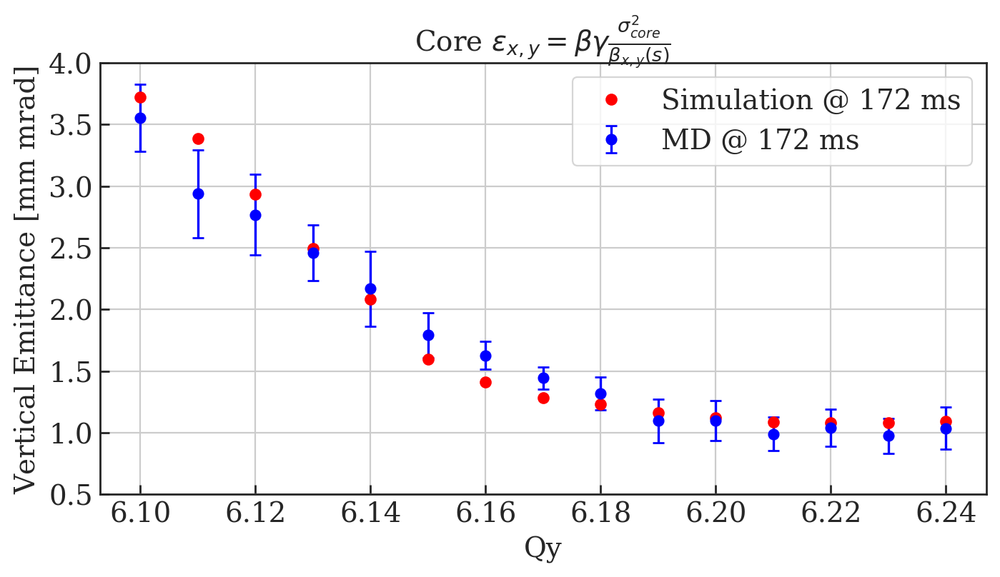

In [115]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_error_172 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['Core emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_172.append( np.std( df0['Core emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
plt.errorbar(x_data, y_data_172, y_error_172, label='MD @ 172 ms', linestyle='None', marker='o', capsize=3, color='b')

plt.plot(df0_sim['Qy'], df0_sim['Core emittance V'], label='Simulation @ 172 ms', linestyle='None', marker='o', color='r', markersize=5)

plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');

plt.title(r'Core $\epsilon_{x,y} = \beta\gamma \frac{\sigma_{core}^2}{\beta_{x,y}(s)}$')

plt.ylim(0.5, 4)

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Core_Emittance_Errors_Using_Sim_Optics_Sim_172.png');

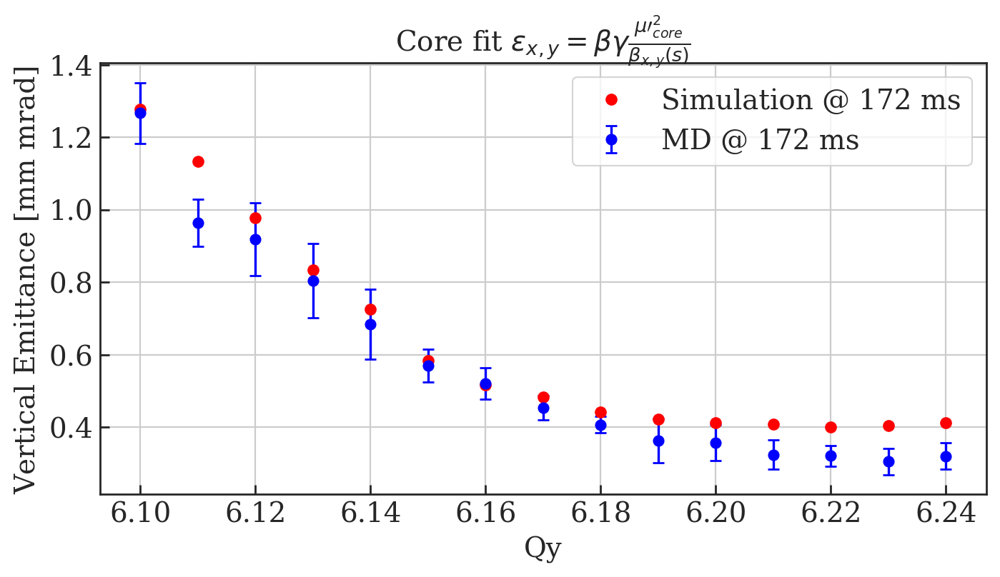

In [116]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_error_172 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['Core emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_172.append( np.std( df0['Core emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
plt.errorbar(x_data, y_data_172, y_error_172, label='MD @ 172 ms', linestyle='None', marker='o', capsize=3, color='b')

plt.plot(df0_sim['Qy'], df0_sim['Core emittance V 2ndMoment'], label='Simulation @ 172 ms', linestyle='None', marker='o', color='r', markersize=5)

plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');

plt.title(r'Core fit $\epsilon_{x,y} = \beta\gamma \frac{\mu\prime^2_{core}}{\beta_{x,y}(s)}$')

# plt.ylim(0.5, 3.5)

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Core_Emittance_2nd_Errors_Using_Sim_Optics_Sim_172.png');